<a href="https://colab.research.google.com/github/ba-careerpath-7/TESLA_Stock_Price_Prediction_Project/blob/main/TESLA_Stock_Price_Prediction_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🚗 TESLA Stock Price Prediction Project




# ⭐ SECTION A: Introduction

---
## Tesla Stock Prices. Woooooo! 🚀

Welcome to the **TESLA Stock Price Prediction Project**!

In this project, we will try to find ways to visualize stock price trends and forecast stock prices. This can be useful for someone who wants to figure out if he should keep his/her stocks or sell them to gain revenue.  As you guessed from the title, we will be using Tesla Stock Prices! More specifically, this project will use 2016 to 2025 Tesla Stock Prices from the NASDAQ website.


Elon Musk's website states:
"Since the company’s inception in 2003, Tesla’s mission has been to accelerate the world’s transition to sustainable energy. Tesla is known for creating cars such as Model X, Model S, Model 3, and the Cybertruck" ("Elon Musk | Tesla").



As of January 1, 2026, Elon Musk remains the richest person in the world (Moskowitz), which makes Tesla stock trends especially interesting to study.

Since Elon Musk is the richest person in the world, what do the Tesla stock prices look like? Lets examine the Tesla stock price trends and try to predict them using machine learning (ML) and time series models.


---
## The Objectives

Firstly, we will use the daily stock price data and apply ML models such as Linear Regression or XGBoost. ML models do great when examining daily prices.

Secondly, we will use monthly stock price data and apply with time series models such as Prophet and State Space models. Many companies use time series models for monthly data in order to see long term patterns.

Thirdly, we will gather any insights and results. Perhaps we can discover what months are optimal to buy or sell stocks.   


---



Before we do that, lets jump into some business words so that the rest of the project makes sense!





# Financial Definitions

Lets talk about some financial words in order to understand what this project is about.


---

### What are stocks?

Stock Definition: "A stock represents partial ownership in a company, offering a claim on its earnings and assets. As the company's value rises or falls, so does the value of its stock" (Schwab Brokerage).

More simply, a stock is a share of ownership in a company.

If someone buys a stock, they own a small part of that company.

---

### Why do stocks exist?

* The main reason stocks exist is so that a company can raise money.

* A company does not have to borrow money from a bank. Instead, they can sell stocks (parts of the company).

* Investors are people who want to spend money in stocks, bonds, or a business. They hope that a company does well in order to  earn more money in the future.

* Investors pay for stocks now. In return, they earn a small part of the company.


---

### Why would someone buy a stock?

There are 2 main reasons people buy stocks, and they hope to get money out of it:

* Capital Gains: A stock price can go up if a company does well. If someone buys a stock for 30 dollars and after a few months it is worth 50 dollars, the person can sell it and gain 20 dollars.

But the inverse is true as well. If someone buys a stock for 90 dollars and after a few months it is worth 10 dollars, the person could sell it. but basically lose 80 dollars.

* Dividends: Some companies share some of their profits to share holders. So if someone has a stock, they could get free money just by owning a stock.

Overall, people buy stocks in order to help a company out. They hope that company gets more successful so that they can get money out of it.  Investors who buy Tesla stock are essentially betting on the company’s mission and growth.




---
### What is a stock market?

A stock market is a online system where people buy and sell stocks. That's it!



---
## Machine Learning Models Note:

If you want more theory or want to know the process on how a machine learning model works, please refer to my Pokemon Pokedex MEGA Project. The Github link is: https://github.com/ba-careerpath-7/Pokemon_Pokedex_MEGA_Project/blob/main/Pokemon_Pokedex_MEGA_Project_(main).ipynb


I will be focusing on the implementation of machine learning models in this project.


In [ ]:
# STARTING IMPORTS:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore") # will remove red warnings in final output


# import sklearn # not needed right away, we will do specific imports later


# possible module for 3d plotting, but even without it, we can plot 3d fine
# from mpl_toolkits import mplot3d

# sns.set_theme(style = "whitegrid") # this will set out style for all plots!

sns.set()
# this will automatiacally set the default seaborn view for all matplotlib plots!


In [ ]:
!pip install pmdarima

# google collab does not have the pdmarima library,
# so we need to install it in this session!


## How to Navigate this Project

This project contains a lot of content, so I decided to put emojis on each major section and on summary tables.

Any minor sections will not have emojis since too many emojis can clutter the project. Some major sections such as the Bibliography will not have an emoji due to other reasons. For instance, the Bibliography is a formal section and emojis make it less formal.  

Here is the content table below:

In [ ]:
# Make df display all content in columns:
pd.set_option("display.max_colwidth", None)

content_table = pd.DataFrame({"Major Sections and Table Results":[
    "Section A: Introduction",
    "Section B: Data Cleaning, Data Visualization, and Additional Discoveries",
    "Section C: Exploratory Data Analysis (EDA) for Predictors!",
    "Section D: Objective 1- Unsupervised Learning",
    "Section E: Objective 2- Regression",
    "Section F: Time Series Crash Course",
    "Section G: Objective 3- Time Series",
    "Section H: Conclusion",
    "Model Comparison Table / Important Plot / Final Model",
    "Important Consideration OR Business Insight"
                                                         ],
                              "Associated Emoji":["⭐",
                                                  "📊",
                                                  "🔎",
                                                  "🧩",
                                                  "📈",
                                                  "⏳",
                                                  "🕝",
                                                  "💡",
                                                  "🏆",
                                                  "❗"
                                                  ]})

content_table




,Major Sections and Table Results,Associated Emoji
0,Section A: Introduction,⭐
1,"Section B: Data Cleaning, Data Visualization, and Additional Discoveries",📊
2,Section C: Exploratory Data Analysis (EDA) for Predictors!,🔎
3,Section D: Objective 1- Unsupervised Learning,🧩
4,Section E: Objective 2- Regression,📈
5,Section F: Time Series Crash Course,⏳
6,Section G: Objective 3- Time Series,🕝
7,Section H: Conclusion,💡
8,Model Comparison Table / Important Plot / Final Model,🏆
9,Important Consideration OR Business Insight,❗


In [ ]:
# reset the column settings:
pd.reset_option("display.max_colwidth")

## Where I got my data set:


I got my Tesla stock price data from the NASDAQ website:

https://www.nasdaq.com/market-activity/stocks/tsla/historical?page=1&rows_per_page=10&timeline=y10

---

### What even is NASDAQ?

**NASDAQ** is a acrynonym for **N**ational **A**ssociation of **S**ecurities **D**ealers **A**utomated **Q**uotations.

Imagine you are in a market place trying to buy fruits, meats, and items.

NASDAQ is similar to the scenario above, but it involves someone being in a online market place trying to buying shares of companies.


## Uploading the CSV file:


In [ ]:
#---------------------------------------------------------------------
# code that allows us to import files from computer to google collab
from google.colab import files
import io

# Select: TESLA_project_dec_2025



# step 1: upload your CSV (colab will show a file picker)
uploaded = files.upload()

# step 2: read the uploaded CSV into a pandas DataFrame
tesla_df = pd.read_csv(io.BytesIO(list(uploaded.values())[0]))

tesla_df




Saving TESLA_project_dec_2025.csv to TESLA_project_dec_2025 (1).csv


,Date,Close/Last,Volume,Open,High,Low
0,12/23/2025,$485.56,58223630,$489.395,$491.97,$482.84
1,12/22/2025,$488.73,86916070,$489.88,$498.83,$485.33
2,12/19/2025,$481.20,103305400,$488.12,$490.49,$474.72
3,12/18/2025,$483.37,95168450,$478.16,$490.86,$473.12
4,12/17/2025,$467.26,106490400,$488.22,$495.2799,$466.20
...,...,...,...,...,...,...
2509,12/31/2015,$16.0007,40707235,$15.9007,$16.23,$15.8913
2510,12/30/2015,$15.8727,55416692,$15.7733,$16.2423,$15.7114
2511,12/29/2015,$15.8127,36036552,$15.3373,$15.848,$15.3031
2512,12/28/2015,$15.2633,28502551,$15.4327,$15.4653,$15.036


### What each variable does:

* Date: The stock information of the stated date.


According to Finnage Blog, it gives the following variable defintions:

"OHLCV stands for Open, High, Low, Close, and Volume — five key data points that define the price and trading activity of a financial instrument over a specific time interval.


* Close/Last: The last traded price before the period ends.



* Volume: The total quantity of the asset traded during that time frame.



* Open: The first traded price during the selected time frame.



* High: The highest price reached within that time frame.



* Low: The lowest price during the same period.

Whether you're working with stocks, forex, crypto, indices, or commodities, OHLCV provides the structured data required to interpret and act on price movements effectively" ("How to Use OHLCV Data").


---




# 📊 SECTION B: Data Cleaning, Data Visualization, and Additional Discoveries

We would want to clean the data so anyone can read it efficiently.

* NOTE: Lets check is there are missing values AFTER we have finished editing the data frame! We could get additional missing values after editing the data frame, so lets do this last.

### Standardizing the variable names

Lets first standardize the variable names so that they are all lower case:


In [ ]:

tesla_df = tesla_df.rename(columns = {"Date":"date",
                                      "Close/Last":"close",
                                      "Volume":"volume",
                                      "Open":"open",
                                      "High":"high",
                                      "Low":"low",
                                      })

tesla_df

,date,close,volume,open,high,low
0,12/23/2025,$485.56,58223630,$489.395,$491.97,$482.84
1,12/22/2025,$488.73,86916070,$489.88,$498.83,$485.33
2,12/19/2025,$481.20,103305400,$488.12,$490.49,$474.72
3,12/18/2025,$483.37,95168450,$478.16,$490.86,$473.12
4,12/17/2025,$467.26,106490400,$488.22,$495.2799,$466.20
...,...,...,...,...,...,...
2509,12/31/2015,$16.0007,40707235,$15.9007,$16.23,$15.8913
2510,12/30/2015,$15.8727,55416692,$15.7733,$16.2423,$15.7114
2511,12/29/2015,$15.8127,36036552,$15.3373,$15.848,$15.3031
2512,12/28/2015,$15.2633,28502551,$15.4327,$15.4653,$15.036


---

### Lets check the data types:



In [ ]:
tesla_df.dtypes

,0
date,object
close,object
volume,int64
open,object
high,object
low,object


This is a problem. It appears that the dollar signs is preventing the numbers from last to low to be numbers.

Lets remove the dollar signs.



In [ ]:
# editing: last
tesla_df["close"] = tesla_df["close"].str.replace("$","", regex = False) # removes $
tesla_df["close"] = tesla_df["close"].astype(float)

# editing: open
tesla_df["open"] = tesla_df["open"].str.replace("$","", regex = False) # removes $
tesla_df["open"] = tesla_df["open"].astype(float)

# editing: high
tesla_df["high"] = tesla_df["high"].str.replace("$","", regex = False) # removes $
tesla_df["high"] = tesla_df["high"].astype(float)

# editing: low
tesla_df["low"] = tesla_df["low"].str.replace("$","", regex = False) # removes $
tesla_df["low"] = tesla_df["low"].astype(float)







We should also turn the date variable into a date time variable type.


In [ ]:
tesla_df["date"] = pd.to_datetime(tesla_df["date"])



Lets check the variable types one more time:

In [ ]:
tesla_df.dtypes

,0
date,datetime64[ns]
close,float64
volume,int64
open,float64
high,float64
low,float64


---

### Rearrange the data frame

Lets put the very few first dates in the front, and the very last dates in the back.



In [ ]:
tesla_df = tesla_df.sort_values(by = "date", ascending = True)

tesla_df

,date,close,volume,open,high,low
2513,2015-12-24,15.3713,10654150,15.3707,15.4587,15.2187
2512,2015-12-28,15.2633,28502551,15.4327,15.4653,15.0360
2511,2015-12-29,15.8127,36036552,15.3373,15.8480,15.3031
2510,2015-12-30,15.8727,55416692,15.7733,16.2423,15.7114
2509,2015-12-31,16.0007,40707235,15.9007,16.2300,15.8913
...,...,...,...,...,...,...
4,2025-12-17,467.2600,106490400,488.2200,495.2799,466.2000
3,2025-12-18,483.3700,95168450,478.1600,490.8600,473.1200
2,2025-12-19,481.2000,103305400,488.1200,490.4900,474.7200
1,2025-12-22,488.7300,86916070,489.8800,498.8300,485.3300


Nice, this arrangement can help us create a time series variable soon.

## Feature Engineering:

The word "feature" is just a fancy word for "variable".

**WARNING:** These 6 raw variables are NOT enough for machine learning models capture patterns! So what can we do? Well what if we use these 6 raw variables to make new variables?

Feature engineering is when we use raw variables and use a combination of them to create new informative variables. These new informative variables better represent the underlying patterns in the data.


A Medium article states that "Feature engineering is like cooking with the best ingredients. You transform raw data into meaningful features for your predictive models" (Hong).


---


### Feature 1: Daily Range

The Daily range is:

$$\text{Daily Range} = High - Low$$

It can show volatile a stock is for a certain day.

* Volatile: How a stock price moves up and down on a given day.

A stock is volatile if the price bounces up or down signficantly. EX: 90 dollars in one moment, then 150 dollars in another moment.

A stock is NOT volatile if the price is usually consistent. EX: 100 dollars to 101 dollars.


In [ ]:
# lets create a new variable called: daily_range

tesla_df["daily_range"] = tesla_df["high"] - tesla_df["low"]

tesla_df["daily_range"]

,daily_range
2513,0.2400
2512,0.4293
2511,0.5449
2510,0.5309
2509,0.3387
...,...
4,29.0799
3,17.7400
2,15.7700
1,13.5000


### Features 2,3, and 4: Previous Closing Days (lag features), Price Change, AND Percent Change


**Previous Closing Price Days:**

$$Previous ~ Closing ~ price ~ days = Close_t, Close_{t-1}, Close{t-2},...$$

* Recent previous closing price days can help predict future stock prices effectively.




**Price Change:**

$$\text{Price Change = Close - Previous Close}$$  


* The Price Change shows the raw dollar changes. But sometimes this Price Change alone will not show the full story since a 2 dollar increase from a 10 dollar stock is a big leap. Meanwhile, a 2 dollar increase from a 500 dollar stock is NOT significant!



**Percent Change:**

$$\text{Percent Change} = \frac{ \text{ Close - Previous Close } }{ \text{Previous Close} } * 100$$  


* The Percent Change is the standardized version of the Price Change, and is useful when stocks have different price levels. However, the Percent Change is less intuitive than raw dollar increases or decreases.


* Both Price Change and Percent Change shows the actual movement of the stock. This is important feature for any ML model!

---


Lets first create the Percent Change first since the pandas library has a built in percent change function.




In [ ]:
# PERCENT change

# pandas has a built in function for percent change!

tesla_df["percent_change"] = tesla_df["close"].pct_change()

tesla_df["percent_change"] # the first observation is a NA value




,percent_change
2513,NaN
2512,-0.007026
2511,0.035995
2510,0.003794
2509,0.008064
...,...
4,-0.046175
3,0.034478
2,-0.004489
1,0.015648


### Shifting, what does it do?

In order to get previous day values in a current day observation, we use a function called shifting!

The code "shift(1)" moves the column down by 1 row, so tesla_df['close'].shift(1) is yesterday’s closing price.

Lets say we have a data set with 3 observations. Observation 1 contains A, Observation 2 contains B, and Observation 3 contains C.

Perhaps we want to create a new variable. This new variable will have the previous letter. Then this results in:

Observation 1 contains a missing value (since this is the very first observation), Observation 2 contains A, and Observation 3 contains B.



In [ ]:
example_df = pd.DataFrame({"letters":["A","B","C"]})

# shifted letters:
example_df["shifted_letters"] = example_df["letters"].shift(1)

example_df

,letters,shifted_letters
0,A,None
1,B,A
2,C,B


Now lets put the shift() function in practice!!!

In [ ]:

# First, create a shift to make it a previous_close:

tesla_df["previous_close"] = tesla_df["close"].shift(1)

# tesla_df["previous_close"] # the first observation is a NA value

# PRICE change:

tesla_df["price_change"] = tesla_df["close"] - tesla_df["previous_close"]

tesla_df["price_change"]


,price_change
2513,NaN
2512,-0.1080
2511,0.5494
2510,0.0600
2509,0.1280
...,...
4,-22.6200
3,16.1100
2,-2.1700
1,7.5300


### Features 5, 6, and 7: Previous Volume Days, Volume Change, AND Volume Ratio

**Previous Volume Days:**

$$Previous ~ Volume = Volume_t, Volume_{t-1}, Volume_{t-2},...$$

* Recent previous closing price days can help predict future stock prices effectively.


**Volume Change:**

$$\text{Volume Change = Volume - Previous Volume}$$  


* Volume change can show us trading activity changes from the previous day to the current day.

* We can not rely on Prices alone. If the Price Change is positive, but the Volume change decreases, it shows that fewer people are buying the stock.

**Volume Ratio:**

$$\text{Volume Ratio} = \frac{ \text{ Volume} }{ \text{ Moving Average of Volume} }$$  


* Volume Ratio is tells us how much trading happened compared to the previous day. If the Volume Ratio is greater than 1, then current day's volume is higher than the recent average. If less than 1, then the current day's volume is lower than the recent average.

* The moving average is just the mean of a period of trading days. I will use 10 trading days.

$$MA_{10} = \frac{obs_t + obs_{t-1} + ... + obs_{t-9}}{10}$$


---




In [ ]:

# first create a shifted volume, this is our previous volume:
tesla_df["previous_volume"] = tesla_df["volume"].shift(1)

# tesla_df["previous_volume"]

# volume change:

tesla_df["volume_change"] = tesla_df["volume"] - tesla_df["previous_volume"]

tesla_df["volume_change"]

,volume_change
2513,NaN
2512,17848401.0
2511,7534001.0
2510,19380140.0
2509,-14709457.0
...,...
4,-1117700.0
3,-11321950.0
2,8136950.0
1,-16389330.0


Now lets make our volume ratio.



In [ ]:
# first, we make our moving average!

tesla_df["volume_MA10"] = tesla_df["volume"].rolling(window = 10).mean()

tesla_df["volume_MA10"][0:20]



,volume_MA10
2513,NaN
2512,NaN
2511,NaN
2510,NaN
2509,NaN
2508,NaN
2507,NaN
2506,NaN
2505,NaN
2504,48491380.3


* The 10 day moving average will cause the first 9 rows to be NAs, since the first 9 rows do not have 10 observations yet!

Lets proceed.

In [ ]:
tesla_df["volume_ratio"] = tesla_df["volume"] / tesla_df["volume_MA10"]

tesla_df["volume_ratio"][0:20]

,volume_ratio
2513,NaN
2512,NaN
2511,NaN
2510,NaN
2509,NaN
2508,NaN
2507,NaN
2506,NaN
2505,NaN
2504,1.105049


### Feature 8: SMA (Simple Moving Average) for closing price

This is simply the average of a period's closing prices. It is that simple!

Lets do a SMA of 10 closing prices:

$$SMA_{10} = \frac{closing_t + closing_{t-1} + ... + closing_{t-9}}{10}$$






In [ ]:
# SMA_10:

tesla_df["SMA_10"] = tesla_df["close"].rolling(window = 10).mean()

tesla_df["SMA_10"]

,SMA_10
2513,NaN
2512,NaN
2511,NaN
2510,NaN
2509,NaN
...,...
4,458.403
3,461.287
2,463.907
1,468.822


### Feature 9: EMA (Exponential Moving Average)

Same thing as SMA, but recent days are weighted more.

$$EMA_t = \alpha * Close_t + (1 - \alpha) * EMA_{t-1}$$

**WARNING:** In formula level, it is true that we only use two days. HOWEVER, the $t-1$ component actually includes all times values from $t-1, t-2,..., 1$

* EMA is a recursive formula


* EMA  reacts faster than SMA since the recent days are more relevant.

* The alpha value is calcuated by: $\alpha = \frac{2}{N+1}$

$N$ is the number of days.

In [ ]:
# EMA_10

tesla_df["EMA_10"] = tesla_df["close"].ewm(span = 10, adjust = False).mean()
# span = 10 -> 10 day window
# adjust = false -> use EMA formula

tesla_df["EMA_10"]


,EMA_10
2513,15.371300
2512,15.351664
2511,15.435488
2510,15.514981
2509,15.603294
...,...
4,459.302242
3,463.678198
2,466.863980
1,470.839620


### Features 10,11, and 12: Rollling Statistics (Standard Deviation, Min, and Max)

**Rolling Standard Devation:** We simply take the standard deviation of the 10 surronding closing prices of the observation.

**Rolling Min:** Just take the lowest closing price out of the 10 surronding days.

**Rolling Max:** Just take the highest closing price out of the 10 surronding days.


In [ ]:
# rolling standard deviation:

tesla_df["rolling_std_10"] = tesla_df["close"].rolling(window = 10).std()

tesla_df["rolling_std_10"]




,rolling_std_10
2513,NaN
2512,NaN
2511,NaN
2510,NaN
2509,NaN
...,...
4,15.247209
3,17.053748
2,17.968584
1,17.284020


In [ ]:
# rolling max:

tesla_df["rolling_max_10"] = tesla_df["close"].rolling(window = 10).max()

tesla_df["rolling_max_10"]



,rolling_max_10
2513,NaN
2512,NaN
2511,NaN
2510,NaN
2509,NaN
...,...
4,489.88
3,489.88
2,489.88
1,489.88


In [ ]:
# rolling min:

tesla_df["rolling_min_10"] = tesla_df["close"].rolling(window = 10).min()

tesla_df["rolling_min_10"]




,rolling_min_10
2513,NaN
2512,NaN
2511,NaN
2510,NaN
2509,NaN
...,...
4,439.58
3,439.58
2,439.58
1,445.17


### Feature 13: Momentum

Momentum  measures the raw price change in N days:

$$Momentum = Close_t - Close_{t-N}$$

Lets let $N = 10$.

A postive momentum means that the closing price increased over 10 days.

A negative momentum means that the closing price decreased over 10 days.





In [ ]:
# lets create a shift of 10 for closing prices:

tesla_df["close_shift_10"] = tesla_df["close"].shift(10)

tesla_df["close_shift_10"]


,close_shift_10
2513,NaN
2512,NaN
2511,NaN
2510,NaN
2509,NaN
...,...
4,446.74
3,454.53
2,455.00
1,439.58


In [ ]:
# momentum:

tesla_df["momentum"] = tesla_df["close"] - tesla_df["close_shift_10"]

tesla_df["momentum"]



,momentum
2513,NaN
2512,NaN
2511,NaN
2510,NaN
2509,NaN
...,...
4,20.52
3,28.84
2,26.20
1,49.15


### Feature 14: ROC (Rate of Change)

ROC is just a momentum based percentage that measures price change over N days:

$$ROC = \frac{Close_t - Close_{t-N}}{Close_{t-N}} * 100$$

Again, lets let $N = 10$.


ROC can be effective when we want to find the relative increase or decreases of price changes.


In [ ]:
# making ROC:

tesla_df["ROC_10"] = ( (tesla_df["close"] - tesla_df["close_shift_10"]) / tesla_df["close_shift_10"] ) * 100

tesla_df["ROC_10"]


,ROC_10
2513,NaN
2512,NaN
2511,NaN
2510,NaN
2509,NaN
...,...
4,4.593276
3,6.345016
2,5.758242
1,11.181127


### Removing NA values

* Due to the shift, the first observation is a NA value. I am not a fan of removing observations, but we will have to do this in order to make a time series model or most ML models work.




In [ ]:
tesla_df = tesla_df.dropna()

tesla_df # we should have no NA values now.

,date,close,volume,open,high,low,daily_range,percent_change,previous_close,price_change,...,volume_MA10,volume_ratio,SMA_10,EMA_10,rolling_std_10,rolling_max_10,rolling_min_10,close_shift_10,momentum,ROC_10
2503,2016-01-11,13.8567,61362614,14.2673,14.2967,13.5333,0.7634,-0.014929,14.0667,-0.2100,...,53562226.7,1.145632,14.96415,14.703243,0.762065,16.0007,13.8567,15.3713,-1.5146,-9.853428
2502,2016-01-12,13.9980,46185742,14.1067,14.2493,13.6873,0.5620,0.010197,13.8567,0.1413,...,55330545.8,0.834724,14.83762,14.575017,0.810387,16.0007,13.8567,15.2633,-1.2653,-8.289819
2501,2016-01-13,13.3540,61814864,14.1340,14.1767,13.3333,0.8434,-0.046007,13.9980,-0.6440,...,57908377.0,1.067460,14.59175,14.353014,0.853514,16.0007,13.3540,15.8127,-2.4587,-15.548894
2500,2016-01-14,13.7453,97358636,13.4807,14.0000,12.8920,1.1080,0.029302,13.3540,0.3913,...,62102571.4,1.567707,14.37901,14.242520,0.758613,16.0007,13.3540,15.8727,-2.1274,-13.402887
2499,2016-01-15,13.6660,79886555,13.2647,13.6713,13.1500,0.5213,-0.005769,13.7453,-0.0793,...,66020503.4,1.210026,14.14554,14.137699,0.528400,14.8953,13.3540,16.0007,-2.3347,-14.591237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,2025-12-17,467.2600,106490400,488.2200,495.2799,466.2000,29.0799,-0.046175,489.8800,-22.6200,...,80340162.0,1.325494,458.40300,459.302242,15.247209,489.8800,439.5800,446.7400,20.5200,4.593276
3,2025-12-18,483.3700,95168450,478.1600,490.8600,473.1200,17.7400,0.034478,467.2600,16.1100,...,82666358.0,1.151236,461.28700,463.678198,17.053748,489.8800,439.5800,454.5300,28.8400,6.345016
2,2025-12-19,481.2000,103305400,488.1200,490.4900,474.7200,15.7700,-0.004489,483.3700,-2.1700,...,87354146.0,1.182604,463.90700,466.863980,17.968584,489.8800,439.5800,455.0000,26.2000,5.758242
1,2025-12-22,488.7300,86916070,489.8800,498.8300,485.3300,13.5000,0.015648,481.2000,7.5300,...,89129178.0,0.975170,468.82200,470.839620,17.284020,489.8800,445.1700,439.5800,49.1500,11.181127


### How does out data frame look like so far?



In [ ]:
tesla_df

,date,close,volume,open,high,low,daily_range,percent_change,previous_close,price_change,...,volume_MA10,volume_ratio,SMA_10,EMA_10,rolling_std_10,rolling_max_10,rolling_min_10,close_shift_10,momentum,ROC_10
2503,2016-01-11,13.8567,61362614,14.2673,14.2967,13.5333,0.7634,-0.014929,14.0667,-0.2100,...,53562226.7,1.145632,14.96415,14.703243,0.762065,16.0007,13.8567,15.3713,-1.5146,-9.853428
2502,2016-01-12,13.9980,46185742,14.1067,14.2493,13.6873,0.5620,0.010197,13.8567,0.1413,...,55330545.8,0.834724,14.83762,14.575017,0.810387,16.0007,13.8567,15.2633,-1.2653,-8.289819
2501,2016-01-13,13.3540,61814864,14.1340,14.1767,13.3333,0.8434,-0.046007,13.9980,-0.6440,...,57908377.0,1.067460,14.59175,14.353014,0.853514,16.0007,13.3540,15.8127,-2.4587,-15.548894
2500,2016-01-14,13.7453,97358636,13.4807,14.0000,12.8920,1.1080,0.029302,13.3540,0.3913,...,62102571.4,1.567707,14.37901,14.242520,0.758613,16.0007,13.3540,15.8727,-2.1274,-13.402887
2499,2016-01-15,13.6660,79886555,13.2647,13.6713,13.1500,0.5213,-0.005769,13.7453,-0.0793,...,66020503.4,1.210026,14.14554,14.137699,0.528400,14.8953,13.3540,16.0007,-2.3347,-14.591237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,2025-12-17,467.2600,106490400,488.2200,495.2799,466.2000,29.0799,-0.046175,489.8800,-22.6200,...,80340162.0,1.325494,458.40300,459.302242,15.247209,489.8800,439.5800,446.7400,20.5200,4.593276
3,2025-12-18,483.3700,95168450,478.1600,490.8600,473.1200,17.7400,0.034478,467.2600,16.1100,...,82666358.0,1.151236,461.28700,463.678198,17.053748,489.8800,439.5800,454.5300,28.8400,6.345016
2,2025-12-19,481.2000,103305400,488.1200,490.4900,474.7200,15.7700,-0.004489,483.3700,-2.1700,...,87354146.0,1.182604,463.90700,466.863980,17.968584,489.8800,439.5800,455.0000,26.2000,5.758242
1,2025-12-22,488.7300,86916070,489.8800,498.8300,485.3300,13.5000,0.015648,481.2000,7.5300,...,89129178.0,0.975170,468.82200,470.839620,17.284020,489.8800,445.1700,439.5800,49.1500,11.181127


## Are these engineered features too correlated?

* Only some  predictor variables such as Daily Range or Volume Ratio do not use the response Closing price. But most variables such as SMA or Percent Change use the Closing Price.

* It is true that we do NOT multi-collinerity. Multi-collinearity is when we reintroduce redundant information. For instance, if our predictor variable is meters of a shower head, but the response variable is inches of a shower head, well those two variables will be too correlated. A bigger shower head is bound to have a higher amount of inches and meters. And a 1 meter will always be 2.54 inches so that scale never changes.  Usually, multi-collinear variables usually have a correlation coefficient of $\rho \ge 0.9$.

**NOW**, here is the kicker, since we use PAST information in our predictor variables that use Closing Price, it is OKAY to use these predictor variables. Yes, past values will correlate to current values and even have the multi-collinear problem. But we can use ML models such as LASSO or Random Forests to mitigate this usse.

* But this seg ways to the next topic. The stock price observations do not seem independent of each other. For instance, the 253th stock price seems to affect the 254th stock price. So what are some considerations we have to make? One consideration we have to make is Cross Validation.

---

## Should we do Cross Validation???

Cross Validation (CV) is a process where we split the data into multiple sets, and these sets can be the training set or testing set. A popular CV style is the K-fold Cross validation.

K-fold cross validation is the process of having a $K$ amount of sets. We make $K-1$ sets the training set, and the left over set is the testing set. Repeat this process $K$ times.

**HOWEVER**, Cross Validation relies on the observations to be INDEPENDENT of each other! Stock Prices observations are NOT independent of each other! A current stock price is usually dependent on previous stock prices, especially when time is involved!


It is more safe to NOT use Cross Validation in this case. We should just the old trusty method of a big training set and a small testing set! This applies for both ML models and time series models!

---

# 🔎 SECTION C: Exploratory Data Analysis (EDA) for Predictors!

Exploratory Data Analysis (EDA) is something any statistician, data analyst, quant analyst, or data scientist MUST do before using machine learning models!

If possible, we should look at the data, find any interesting aggregates and filters, and do basic data visualization because this counts as EDA as well. We want to get a feel for the data and know what we are getting into!

But most importantly, we can not go blindly making machine learning models right at the start! We have to use good predictor variables for our models! If we end up using garbage predictors, we will end up with garbage results. This is known as "garbage in, garbage out"!

* For supervised regression models, one way to do this is to make separate plots of our predictor variables against the response variables.

* For un-supervised models, we can make plots of predictor variables against other predictor variables. A fast way to plot this is by a pair plot. Another informative plot could be a correlation plot, to see how correlated the predictors are too each other.

---






## Regression EDA

Making a EDA plot for each of the 14 predictors will not be efficient.

I plan to make 4 pair plots:

* Price Pair Plot

* Volume Pair Plot

* Rolling Pair Plot

* Momentum Pair Plot

Each pair plot will have the response variable of the closing price, "close".


**IMPORTANT NOTE:** Normally, many people will think "Oh I have to pick any predictors that have a high correlation with the response variable." BUT this only applies if we do linear regression!

**During EDA, we can pick predictors that has ANY kind of shape with the response variable!** Why? Because we have ML models that deal with non-linear relationships such as LASSO, Random Forests, and XGBoost!

We won't be able to use linear regression if we do this approach, but thats totally fine! There are plently of ML models out there that we can use!

---



In [ ]:
tesla_df.columns

Index(['date', 'close', 'volume', 'open', 'high', 'low', 'daily_range',
       'percent_change', 'previous_close', 'price_change', 'previous_volume',
       'volume_change', 'volume_MA10', 'volume_ratio', 'SMA_10', 'EMA_10',
       'rolling_std_10', 'rolling_max_10', 'rolling_min_10', 'close_shift_10',
       'momentum', 'ROC_10'],
      dtype='object')

### Price Pair Plot

In [ ]:
price_df = tesla_df[["close","previous_close", "daily_range", "percent_change",
                     "SMA_10","EMA_10"]]

price_df

,close,previous_close,daily_range,percent_change,SMA_10,EMA_10
2503,13.8567,14.0667,0.7634,-0.014929,14.96415,14.703243
2502,13.9980,13.8567,0.5620,0.010197,14.83762,14.575017
2501,13.3540,13.9980,0.8434,-0.046007,14.59175,14.353014
2500,13.7453,13.3540,1.1080,0.029302,14.37901,14.242520
2499,13.6660,13.7453,0.5213,-0.005769,14.14554,14.137699
...,...,...,...,...,...,...
4,467.2600,489.8800,29.0799,-0.046175,458.40300,459.302242
3,483.3700,467.2600,17.7400,0.034478,461.28700,463.678198
2,481.2000,483.3700,15.7700,-0.004489,463.90700,466.863980
1,488.7300,481.2000,13.5000,0.015648,468.82200,470.839620


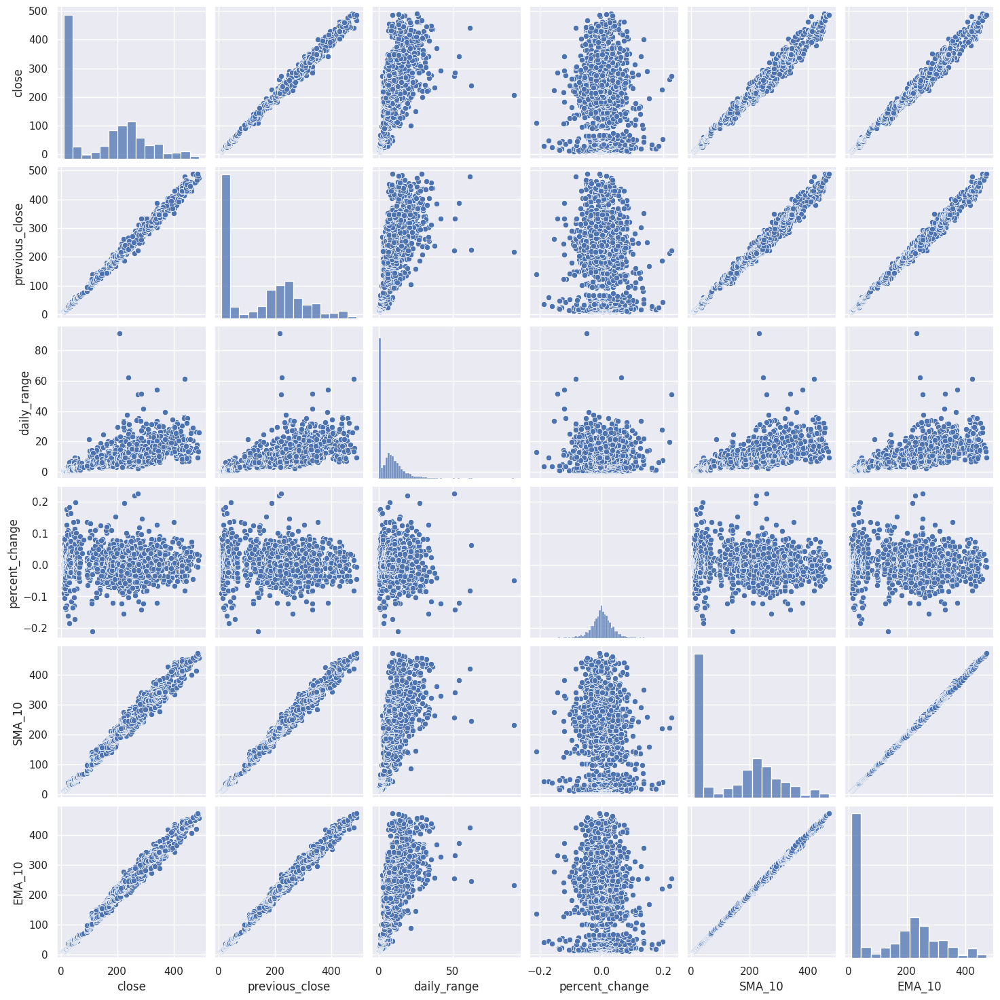

In [ ]:
sns.pairplot(price_df);


The most important column is the very left column because it contains the response variable "close". Remember that this is the closing price.  (Every other plot can be ignored.)

---

* The significant predictors are: daily_range, previous_close, SMA_10, and EMA_10.

daily_range is defintely weakly correlated. But in finance, we want weakly correlated predictors as well. This can be a potentially useful feature for ML models.

previous_close, SMA_10, and EMA_10 seem to have high correlation. Sure this implies that these predictors are multi-collinear, but ML models such as LASSO or random forests can deal with this issue.  

* Do not use these predictors: percent_change

percent_change is looks like a rectangle of points. There is no pattern. Both linear regression and tree based models will learn nothing significant from this predictor.

---




### Volume Pair Plot

In [ ]:
volume_df = tesla_df[["close","previous_volume", "volume_change","volume_ratio"]]

volume_df

,close,previous_volume,volume_change,volume_ratio
2503,13.8567,53585373.0,7777241.0,1.145632
2502,13.9980,61362614.0,-15176872.0,0.834724
2501,13.3540,46185742.0,15629122.0,1.067460
2500,13.7453,61814864.0,35543772.0,1.567707
2499,13.6660,97358636.0,-17472081.0,1.210026
...,...,...,...,...
4,467.2600,107608100.0,-1117700.0,1.325494
3,483.3700,106490400.0,-11321950.0,1.151236
2,481.2000,95168450.0,8136950.0,1.182604
1,488.7300,103305400.0,-16389330.0,0.975170


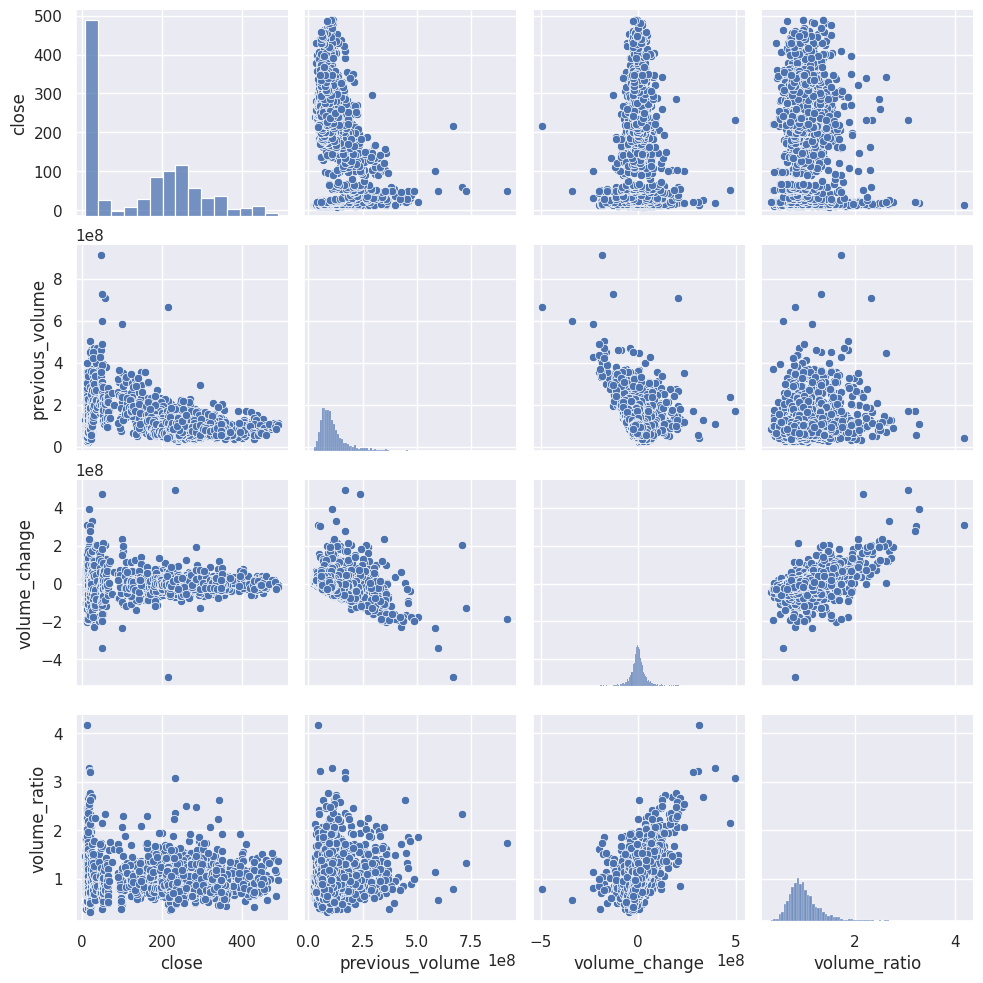

In [ ]:
sns.pairplot(volume_df);

The most important column is the very left column because it contains the response variable "close". Remember that this is the closing price.  (Every other plot can be ignored.)

---

* Use these predictors: previous_volume and volume_change

previous_volume seems to have weak negative correlation. But that even weak correlation can give information.


My choice of percent_change seems wild, but I can explain. We do NOT just want to consider


percent_change looks like a side ways triangle. The variance seems to decrease as the close price increases.  It is true that there is almost no correlation, but a tree based model like XGBoost does not need correlation!


* Do not use these predictors: volume_ratio

volume_ratio seems to be a rectangle shape with a cloud of points. This is pure noise. Both linear regression and tree based models will not learn from this predictor.



---




### Rolling Pair Plot

In [ ]:
rolling_df = tesla_df[["close", "rolling_std_10",
                       "rolling_max_10", "rolling_min_10"]]

rolling_df

,close,rolling_std_10,rolling_max_10,rolling_min_10
2503,13.8567,0.762065,16.0007,13.8567
2502,13.9980,0.810387,16.0007,13.8567
2501,13.3540,0.853514,16.0007,13.3540
2500,13.7453,0.758613,16.0007,13.3540
2499,13.6660,0.528400,14.8953,13.3540
...,...,...,...,...
4,467.2600,15.247209,489.8800,439.5800
3,483.3700,17.053748,489.8800,439.5800
2,481.2000,17.968584,489.8800,439.5800
1,488.7300,17.284020,489.8800,445.1700


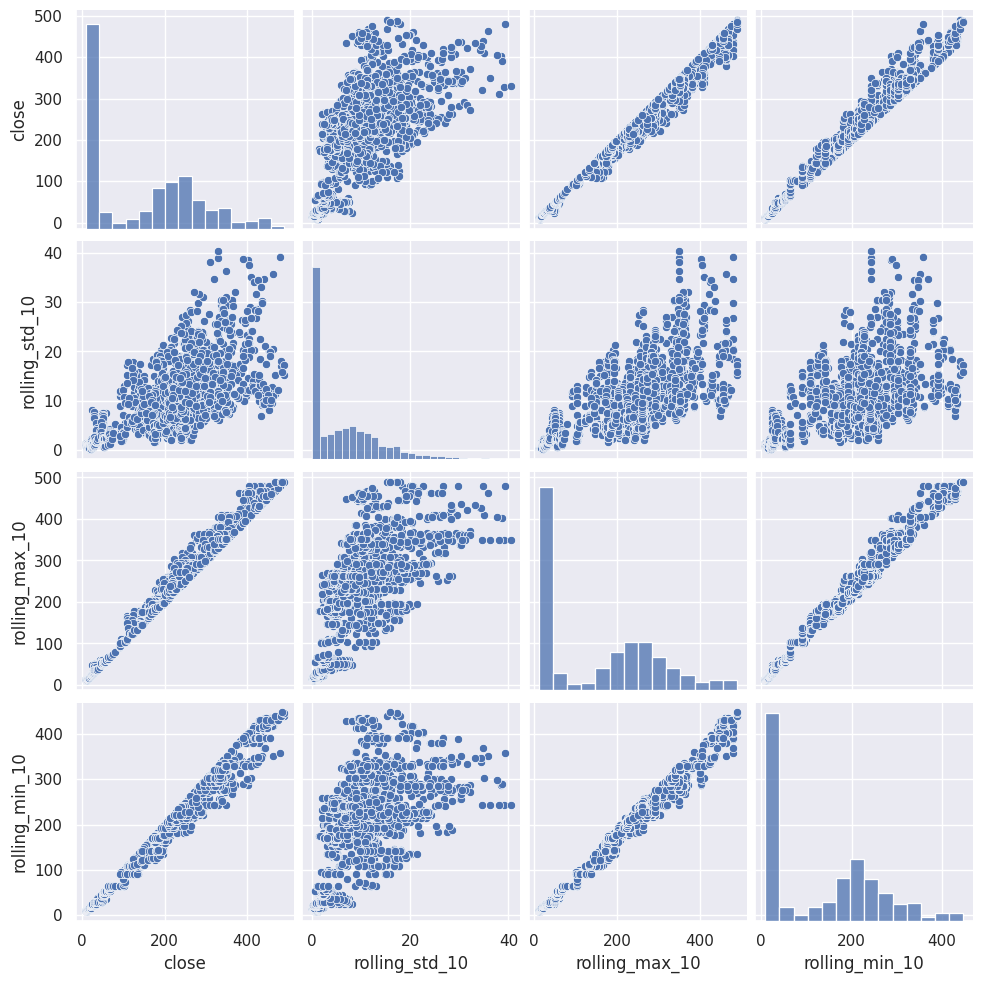

In [ ]:
sns.pairplot(rolling_df);

The most important column is the very left column because it contains the response variable "close". Remember that this is the closing price.  (Every other plot can be ignored.)

---

* Use ALL these predictors: rolling_std_10, rolling_max_10, and rolling_min_10

rolling_std_10 actually seems moderately correlated and this is actually a really great trait. We want some noise because future stock prices might be really volatile.  

rolling_max_10 and rolling_min_10 seem highly correlated with the closing price. We defintely keep those predictors.


---




### Momentum Pair Plot

In [ ]:
momentum_df = tesla_df[["close", "momentum", "ROC_10"]]

momentum_df

,close,momentum,ROC_10
2503,13.8567,-1.5146,-9.853428
2502,13.9980,-1.2653,-8.289819
2501,13.3540,-2.4587,-15.548894
2500,13.7453,-2.1274,-13.402887
2499,13.6660,-2.3347,-14.591237
...,...,...,...
4,467.2600,20.5200,4.593276
3,483.3700,28.8400,6.345016
2,481.2000,26.2000,5.758242
1,488.7300,49.1500,11.181127


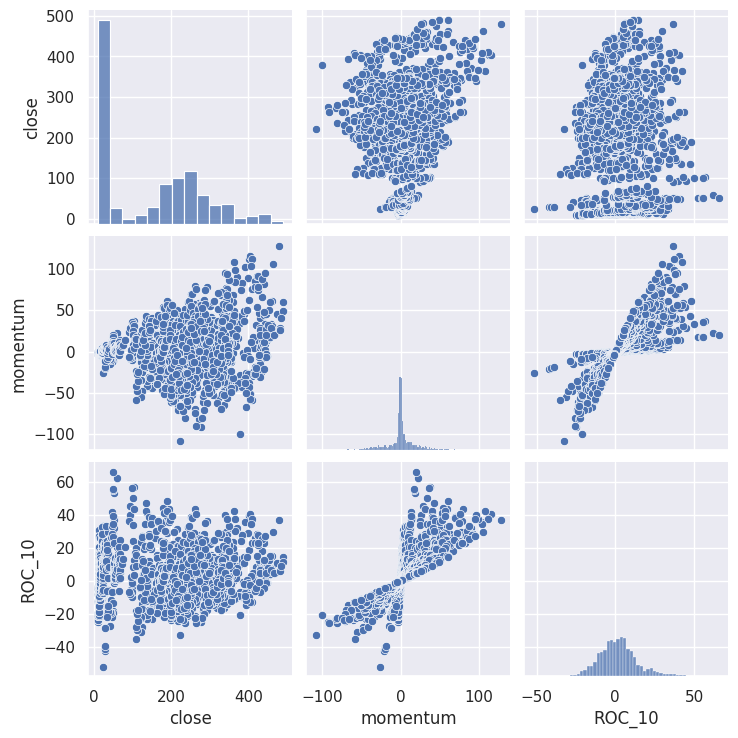

In [ ]:
sns.pairplot(momentum_df);

The most important column is the very left column because it contains the response variable "close". Remember that this is the closing price.  (Every other plot can be ignored.)

---

* Use these predictors: momentum

Before you disagree with me, let me explain why momentum can actually be good.

It is true that momentum does not linearly relate to the close variable. BUT momentum gives information. The increasing variance can tell a model that a stock price can go increase or decrease a lot in the next few days.

Because momentum is not linearly correlated, a regular linear regression will not do well. That is fine since we have many more ML models to use.

* Do not use these predictors: ROC_10

ROC_10 just seems like a cloud of points. I am not sure if we can get any useful information out of it.


---




## The Significant Regression Predictors

Based on our EDA, the significant predictors are: daily_range, previous_close, SMA_10, EMA_10, previous_volume, volume_change, rolling_std_10, rolling_max_10, rolling_min_10, and momentum.

Lets make a data frame of these significant predictors and response.

---

In [ ]:
regression_df = tesla_df[["close", "daily_range", "previous_close", "SMA_10",
                          "EMA_10", "previous_volume", "volume_change",
                          "rolling_std_10", "rolling_max_10",
                          "rolling_min_10", "momentum" ]]

regression_df

,close,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum
2503,13.8567,0.7634,14.0667,14.96415,14.703243,53585373.0,7777241.0,0.762065,16.0007,13.8567,-1.5146
2502,13.9980,0.5620,13.8567,14.83762,14.575017,61362614.0,-15176872.0,0.810387,16.0007,13.8567,-1.2653
2501,13.3540,0.8434,13.9980,14.59175,14.353014,46185742.0,15629122.0,0.853514,16.0007,13.3540,-2.4587
2500,13.7453,1.1080,13.3540,14.37901,14.242520,61814864.0,35543772.0,0.758613,16.0007,13.3540,-2.1274
2499,13.6660,0.5213,13.7453,14.14554,14.137699,97358636.0,-17472081.0,0.528400,14.8953,13.3540,-2.3347
...,...,...,...,...,...,...,...,...,...,...,...
4,467.2600,29.0799,489.8800,458.40300,459.302242,107608100.0,-1117700.0,15.247209,489.8800,439.5800,20.5200
3,483.3700,17.7400,467.2600,461.28700,463.678198,106490400.0,-11321950.0,17.053748,489.8800,439.5800,28.8400
2,481.2000,15.7700,483.3700,463.90700,466.863980,95168450.0,8136950.0,17.968584,489.8800,439.5800,26.2000
1,488.7300,13.5000,481.2000,468.82200,470.839620,103305400.0,-16389330.0,17.284020,489.8800,445.1700,49.1500


We will soon making a training set and a testing set of the regression data frame.

Before we do that, lets do unsupervised EDA with these predictors.

## Unsupervised EDA





In [ ]:

unsupervised_df = tesla_df[["daily_range", "previous_close", "SMA_10",
                          "EMA_10", "previous_volume", "volume_change",
                          "rolling_std_10", "rolling_max_10",
                          "rolling_min_10", "momentum" ]]

unsupervised_df

,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum
2503,0.7634,14.0667,14.96415,14.703243,53585373.0,7777241.0,0.762065,16.0007,13.8567,-1.5146
2502,0.5620,13.8567,14.83762,14.575017,61362614.0,-15176872.0,0.810387,16.0007,13.8567,-1.2653
2501,0.8434,13.9980,14.59175,14.353014,46185742.0,15629122.0,0.853514,16.0007,13.3540,-2.4587
2500,1.1080,13.3540,14.37901,14.242520,61814864.0,35543772.0,0.758613,16.0007,13.3540,-2.1274
2499,0.5213,13.7453,14.14554,14.137699,97358636.0,-17472081.0,0.528400,14.8953,13.3540,-2.3347
...,...,...,...,...,...,...,...,...,...,...
4,29.0799,489.8800,458.40300,459.302242,107608100.0,-1117700.0,15.247209,489.8800,439.5800,20.5200
3,17.7400,467.2600,461.28700,463.678198,106490400.0,-11321950.0,17.053748,489.8800,439.5800,28.8400
2,15.7700,483.3700,463.90700,466.863980,95168450.0,8136950.0,17.968584,489.8800,439.5800,26.2000
1,13.5000,481.2000,468.82200,470.839620,103305400.0,-16389330.0,17.284020,489.8800,445.1700,49.1500


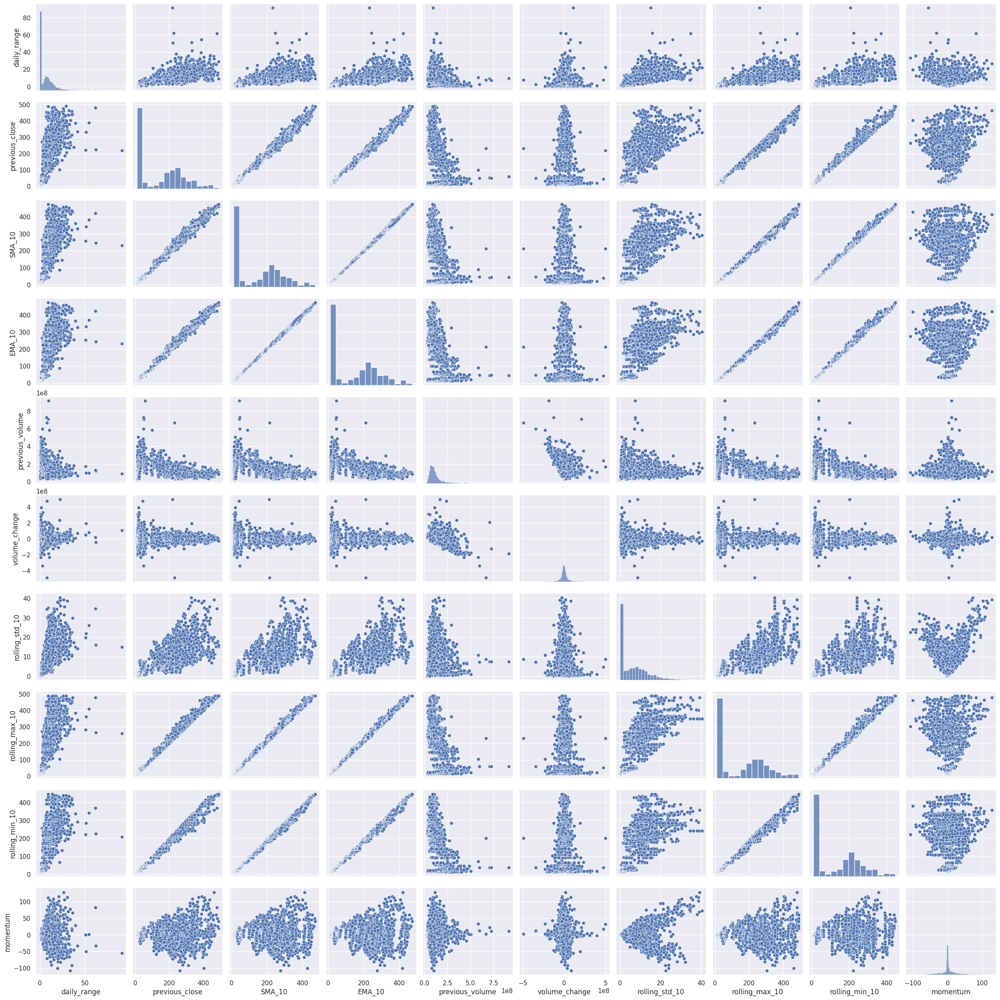

In [ ]:
sns.pairplot(unsupervised_df);



* Since not all predictors are linearly correlated with each other, a unsupervised model like PCA may struggle.

* A unsupervised model like LLE may do well since LLE can handle non-linear data.

More on these models in Section D!

How does a correlation matrix look like?

In [ ]:
the_cols = unsupervised_df.select_dtypes(include = ["float64","int64"])
the_cols




,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum
2503,0.7634,14.0667,14.96415,14.703243,53585373.0,7777241.0,0.762065,16.0007,13.8567,-1.5146
2502,0.5620,13.8567,14.83762,14.575017,61362614.0,-15176872.0,0.810387,16.0007,13.8567,-1.2653
2501,0.8434,13.9980,14.59175,14.353014,46185742.0,15629122.0,0.853514,16.0007,13.3540,-2.4587
2500,1.1080,13.3540,14.37901,14.242520,61814864.0,35543772.0,0.758613,16.0007,13.3540,-2.1274
2499,0.5213,13.7453,14.14554,14.137699,97358636.0,-17472081.0,0.528400,14.8953,13.3540,-2.3347
...,...,...,...,...,...,...,...,...,...,...
4,29.0799,489.8800,458.40300,459.302242,107608100.0,-1117700.0,15.247209,489.8800,439.5800,20.5200
3,17.7400,467.2600,461.28700,463.678198,106490400.0,-11321950.0,17.053748,489.8800,439.5800,28.8400
2,15.7700,483.3700,463.90700,466.863980,95168450.0,8136950.0,17.968584,489.8800,439.5800,26.2000
1,13.5000,481.2000,468.82200,470.839620,103305400.0,-16389330.0,17.284020,489.8800,445.1700,49.1500


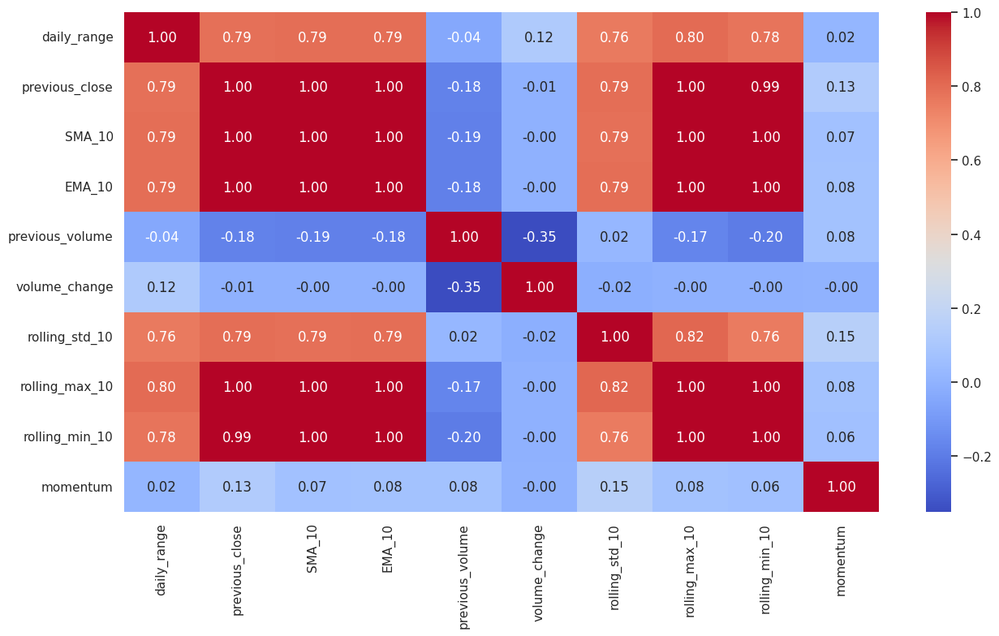

In [ ]:
corr_matrix = the_cols.corr()

fig = plt.figure(figsize = (15,8))

sns.heatmap(corr_matrix, annot= True, fmt = ".2f", cmap = "coolwarm");

* A left downward diagonal that has a correlation value of 1 is expected since that shows a predictor is correlated with itself.

* Some our predictors have a correlation of 1, which makes sense, SMA_10 and EMA_10 literally uses values from previous_close. But I will admit that a correlation of 1 or near 1 looks unnatural. It is a consequence of feature engineering from Section B.


# 🧩 SECTION D: Objective 1- Unsupervised Learning

For supervised learning (classification and regression) we have:
$$y \sim x_1,x_2,...,x_p$$

* We have a response variable that gets a value based on the predictor variables.

* We split data into training and testing sets to see if the model predicts the response variable well.

But for un-supervised learning (pattern) we have:

$$x_1,x_2,...,x_p$$

* Un-supervised learning is about learning patterns in the data, not about measuring a outcome. Therefore, there is no response variable.

* These patterns may be discovered by  dimension reduction, clusters, or outliers. Some people believe that un-supervised learning is solely about making clusters, but this is not entirely true.

The main goal for un-supervised learning is to learn patterns from the full data set! This is not about making predicting values for a response variable!

So we do NOT have training set and testing set for un-supervised learning! We use as much data as possible!


(This explenation originally appeared in my Pokemon MEGA Project.)



---



## Unsupervised Learning set up:



In [ ]:
X = unsupervised_df

X

# no training set and testing set for unsupervied learning!

,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum
2503,0.7634,14.0667,14.96415,14.703243,53585373.0,7777241.0,0.762065,16.0007,13.8567,-1.5146
2502,0.5620,13.8567,14.83762,14.575017,61362614.0,-15176872.0,0.810387,16.0007,13.8567,-1.2653
2501,0.8434,13.9980,14.59175,14.353014,46185742.0,15629122.0,0.853514,16.0007,13.3540,-2.4587
2500,1.1080,13.3540,14.37901,14.242520,61814864.0,35543772.0,0.758613,16.0007,13.3540,-2.1274
2499,0.5213,13.7453,14.14554,14.137699,97358636.0,-17472081.0,0.528400,14.8953,13.3540,-2.3347
...,...,...,...,...,...,...,...,...,...,...
4,29.0799,489.8800,458.40300,459.302242,107608100.0,-1117700.0,15.247209,489.8800,439.5800,20.5200
3,17.7400,467.2600,461.28700,463.678198,106490400.0,-11321950.0,17.053748,489.8800,439.5800,28.8400
2,15.7700,483.3700,463.90700,466.863980,95168450.0,8136950.0,17.968584,489.8800,439.5800,26.2000
1,13.5000,481.2000,468.82200,470.839620,103305400.0,-16389330.0,17.284020,489.8800,445.1700,49.1500


## Unsupervised Model 1: Principal Components Analysis (PCA)

Principal Components Analysis (PCA), is a dimension reduction technique that reduces $p$ number of dimensions/predictors into $k$ amount of dimensions. Where: $k < p$

New variables called Principal Components (PCs) are created. These PCs contain linear combinations of all the predictor variables.

One main reason we use PCA is to visualize the data in a 2D or 3D space. Furthermore, we may find any patterns in this space.


Lets start coding our PCA model!

---

### Standardization formula:

$x_{i,standardized} = \frac{x_i - \bar x}{\sigma}$


* NOTE: We will need to start to standardize the data first! Otherwise, one predictor that has big values could dominate a PCA plot.


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler_function = StandardScaler()

X_scaled = scaler_function.fit_transform(X)

# will give the scaled numbers in a numpy array.

# X_scaled




### Making a Scree Plot


A scree plot can tell us how much Principal Components (PCs) to select. we want to select the number PCs that gives at least 90% of cumulative variance.

For visualization, we have to pick either 2 PCs for 2D plots or 3 PCs for 3D plots, so keep this in mind.


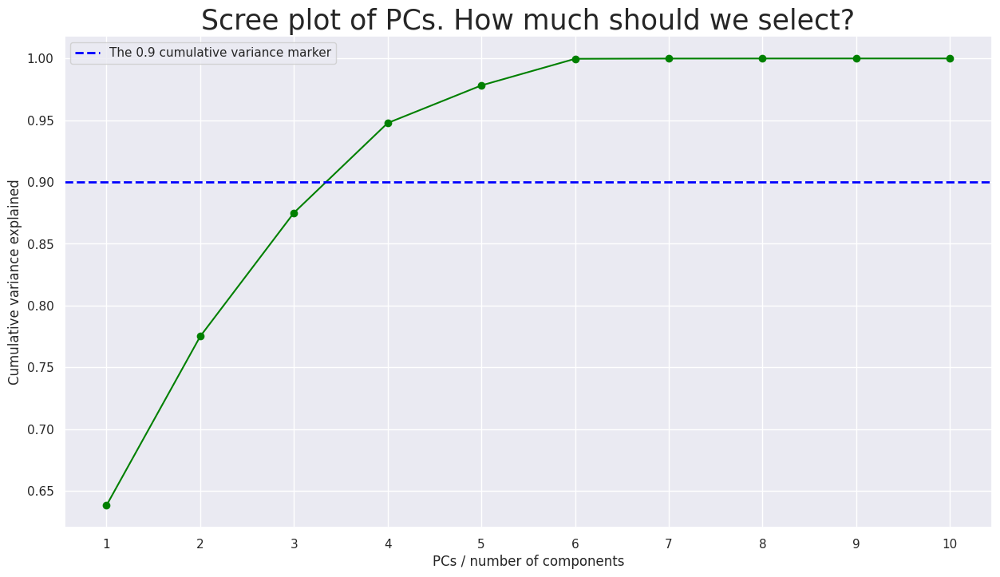

In [ ]:
from sklearn.decomposition import PCA

pca_model_scree = PCA().fit(X_scaled)


plt.figure(figsize=(15,8))  # width= 15 inches, height= 8 inches

ax = plt.axes()


cumulative_var = np.cumsum(pca_model_scree.explained_variance_ratio_)


ax.plot(np.cumsum(pca_model_scree.explained_variance_ratio_),
        marker = "o",color = "green")
# we need to set a marker

ax.axhline(y = 0.9, color = "blue", linestyle = "--", linewidth = 2,
           label = "The 0.9 cumulative variance marker" # this can be used for the legend
           )

ax.set_title("Scree plot of PCs. How much should we select?", fontsize = 25)
ax.set_xlabel("PCs / number of components")
ax.set_ylabel("Cumulative variance explained")

# set the ticks from 0 to 9
ax.set_xticks(range(0, len(cumulative_var), 1)) # only show increments of 5

# set the tick labels to be from 1 to 10
ax.set_xticklabels(range(1,len(cumulative_var)+1, 1));

ax.legend();






Good news! We can use 3 PCs, and explain about 87.5% of the cumulative variance!

Lets use 3 PCs and make visualizations on them!


In [ ]:
from sklearn.decomposition import PCA

pca_model = PCA(n_components = 3)

X_pca = pca_model.fit_transform(X_scaled)

X_pca

array([[-2.5196912 , -0.84038119,  0.03914465],
       [-2.53905943, -0.46039585, -0.08307916],
       [-2.50906121, -1.02107318,  0.04949465],
       ...,
       [ 5.81423568,  0.12134863,  0.75615356],
       [ 5.74665349,  0.71145267,  1.52935454],
       [ 5.53224176,  0.61301935,  1.11431438]])

Lets make a data frame of the PC values. X_pca is a numpy array currently, not a pandas data frame.



In [ ]:
pca_df = pd.DataFrame(X_pca)

pca_df = pca_df.rename(columns = {0:"PC1",1:"PC2", 2:"PC3"})

pca_df

,PC1,PC2,PC3
0,-2.519691,-0.840381,0.039145
1,-2.539059,-0.460396,-0.083079
2,-2.509061,-1.021073,0.049495
3,-2.515004,-1.133064,0.170244
4,-2.598468,-0.100862,-0.151275
...,...,...,...
2499,6.233114,0.251387,0.386109
2500,5.782827,0.488810,0.727838
2501,5.814236,0.121349,0.756154
2502,5.746653,0.711453,1.529355


Now we can start plotting!


### 2D PCA Plot


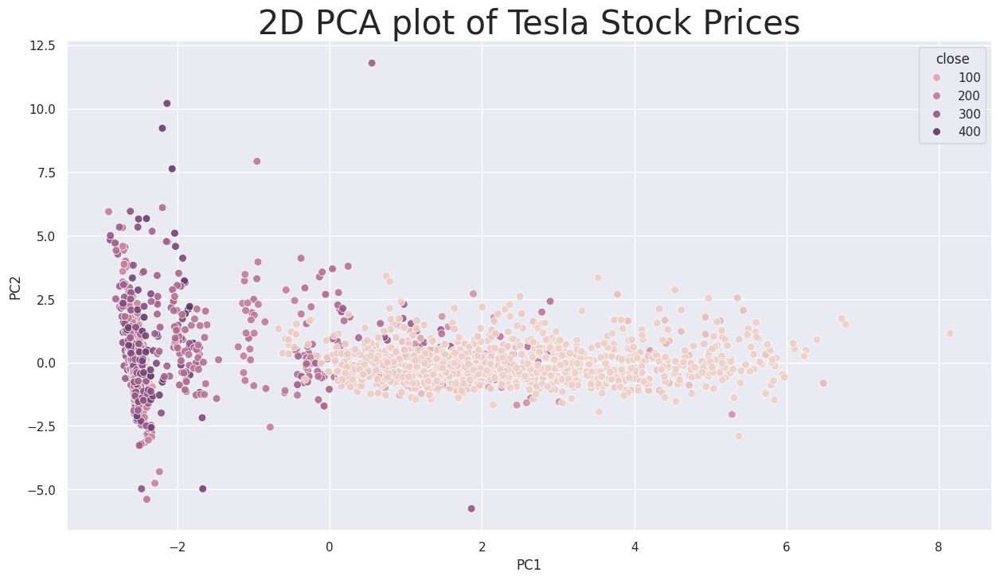

In [ ]:
fig = plt.figure(figsize = (15,8))

sns.scatterplot(pca_df, x = "PC1", y = "PC2", alpha = 0.9,
                s = 50, hue = tesla_df["close"])

plt.title("2D PCA plot of Tesla Stock Prices", fontsize = 30);





* Keep in mind that many Tesla prices were around the 15 dollar range from the years 2015 to 2020. (Check SECTION G: "How does the Monthly Time Series plot look like?" for a time series plot of this!)


* It appears that the more positive the PC1 values are, the less value the closing stock price becomes.

* Around $PC1 = -2$, almost all closing stock prices are greater than 100. The values seem to be about 200 to 400.  

### 3D PCA Plot

Lets use the Plotly library to make a 3D PCA plot! It is more easier to make compared to matplotlib and it is more interactive!


In [ ]:
# First lets add the closing price from the tesla_df into pca_df

pca_df["close_price"] = tesla_df["close"]

pca_df


,PC1,PC2,PC3,close_price
0,-2.519691,-0.840381,0.039145,485.5600
1,-2.539059,-0.460396,-0.083079,488.7300
2,-2.509061,-1.021073,0.049495,481.2000
3,-2.515004,-1.133064,0.170244,483.3700
4,-2.598468,-0.100862,-0.151275,467.2600
...,...,...,...,...
2499,6.233114,0.251387,0.386109,13.6660
2500,5.782827,0.488810,0.727838,13.7453
2501,5.814236,0.121349,0.756154,13.3540
2502,5.746653,0.711453,1.529355,13.9980


In [ ]:
import plotly.express as px

pca_3d_plot = px.scatter_3d(
    pca_df,
    x = "PC1",
    y = "PC2",
    z = "PC3",
    title = "3D PCA Plot of Tesla Stock Prices",
    color = "close_price",
    color_continuous_scale = "plasma",
    opacity = 0.4, # similar to alpha in matplotlib
    size_max = 18, # point size
    width = 1000, # make width bigger
    height = 1000  # make height bigger

)

pca_3d_plot



### 3D PCA Plot PNG file

In case plotly does not load, here is a picture:

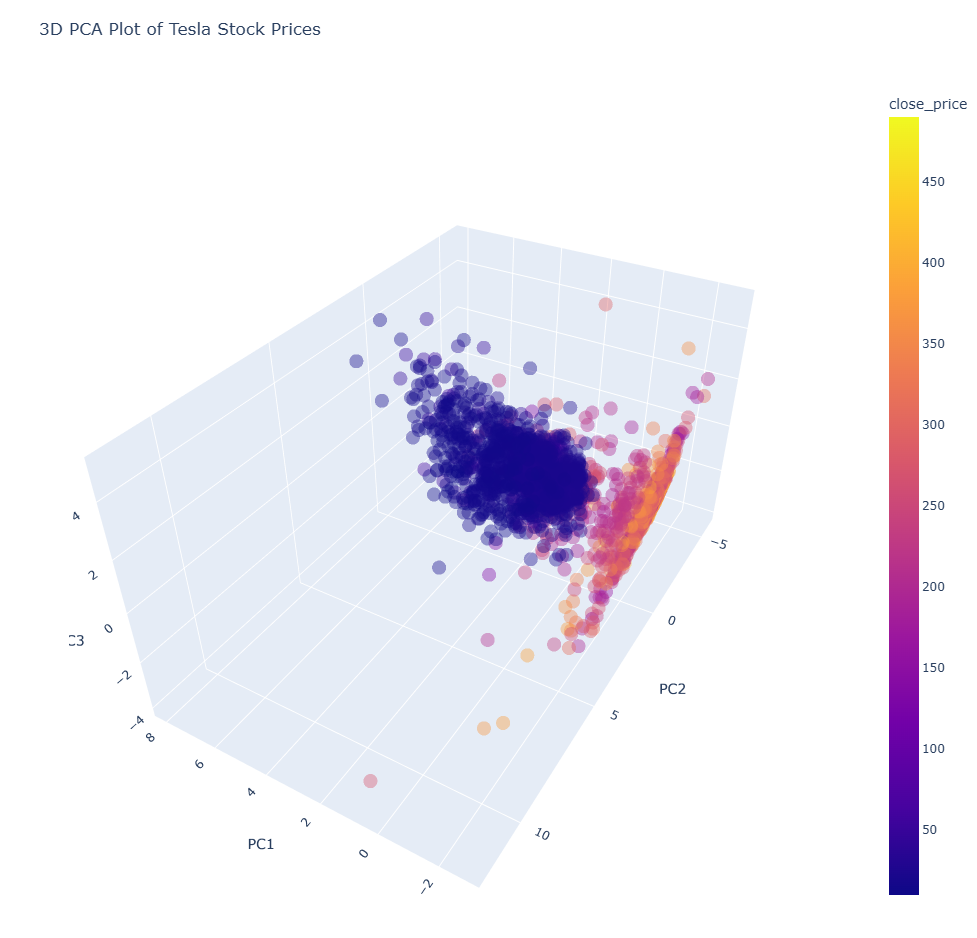


### Conclusion for PCA

Even though some predictors are non-linear, I think PCA made a plot that was interprettable!

But we have another dimension reduction technique that specializes with non-linear variables. How will PCA do compared to this model? Let's find out.


---

## Unsupervised Model 2: Locally Linearly Embedding (LLE)



* Locally Linear Embedding (LLE) is another dimension reduction technique like PCA.

* LLE has a big advantage that PCA does not have. LLE can do dimension reduction in NON-linear data more effectively than PCA.


* This is because LLE only calculates pairwise distances of nearby points.

**EASY EXPLENATION:** LLE projects from higher dimensions into lower dimensions (2D or 3D) while preserving local relationships between points. PCA also projects from higher dimensions into lower dimensions. BUT PCA is different since it considers the variances of each PC to project down.


* For LLE, it would just calculate pairwise distances of the 100 nearest points. (We can adjust the amount of points by using "n_neighbors = " if we think 100 is not good.) Overall, LLE only considers local structure of the data.

---

Lets make some LLE plots:


### 2D LLE Plot

In [ ]:
from sklearn.manifold import LocallyLinearEmbedding

LLE_model = LocallyLinearEmbedding(n_neighbors = 100, n_components = 2,
                                   method = "modified", eigen_solver = "dense")

X_lle = LLE_model.fit_transform(X)


lle_df = pd.DataFrame(X_lle, columns = ["Component 1", "Component 2"])
lle_df


,Component 1,Component 2
0,-0.017069,-0.003935
1,-0.014407,-0.012960
2,-0.019253,-0.001373
3,-0.015438,0.008843
4,-0.004484,-0.009791
...,...,...
2499,-0.002157,-0.001611
2500,-0.002177,-0.006087
2501,-0.005770,0.000887
2502,-0.002897,-0.008624


Text(0.5, 1.0, '2D LLE plot of Tesla Stocks')

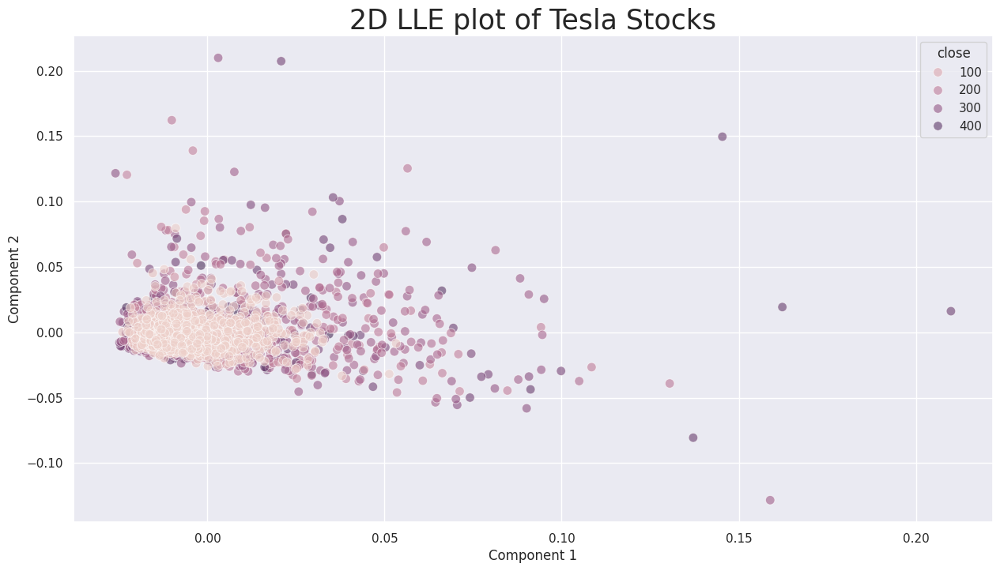

In [ ]:

fig = plt.figure(figsize = (15,8))

sns.scatterplot(lle_df, x = "Component 1", y = "Component 2",
                alpha = 0.6, s = 70,
                hue = tesla_df["close"])


plt.title("2D LLE plot of Tesla Stocks", fontsize = 25)



I am not sure if this LLE plot is showing any significant patterns.




### 3D LLE Plot

Before we make a 3D LLE plot, we need to make another data frame that has 3 LLE components.

In [ ]:

LLE_model_3d = LocallyLinearEmbedding(n_neighbors = 100, n_components = 3,
                                      method = "modified", eigen_solver = "dense")

X_lle_3d = LLE_model_3d.fit_transform(X)

lle_3d_df = pd.DataFrame(X_lle_3d, columns = ["Component 1", "Component 2", "Component 3"])
lle_3d_df


,Component 1,Component 2,Component 3
0,0.017083,-0.003882,-0.028236
1,0.014445,-0.012918,-0.027455
2,0.019260,-0.001312,-0.027519
3,0.015414,0.008890,-0.008006
4,0.004509,-0.009784,0.013412
...,...,...,...
2499,0.002160,-0.001607,0.014134
2500,0.002193,-0.006082,0.016665
2501,0.005767,0.000901,0.005356
2502,0.002919,-0.008617,0.016609


In [ ]:
# lets add the closing price to the lle_df

lle_3d_df["closing_price"] = tesla_df["close"]

lle_3d_df




,Component 1,Component 2,Component 3,closing_price
0,0.017083,-0.003882,-0.028236,485.5600
1,0.014445,-0.012918,-0.027455,488.7300
2,0.019260,-0.001312,-0.027519,481.2000
3,0.015414,0.008890,-0.008006,483.3700
4,0.004509,-0.009784,0.013412,467.2600
...,...,...,...,...
2499,0.002160,-0.001607,0.014134,13.6660
2500,0.002193,-0.006082,0.016665,13.7453
2501,0.005767,0.000901,0.005356,13.3540
2502,0.002919,-0.008617,0.016609,13.9980


In [ ]:

lle_3d_plot = px.scatter_3d(
    lle_3d_df,
    x = "Component 1",
    y = "Component 2",
    z = "Component 3",
    opacity = 0.5,
    title = "3D LLE plot on Tesla Stock Prices",
    color = "closing_price",
    size_max = 18,
    width = 1000,
    height = 1000


)

lle_3d_plot




### 3D LLE Plot PNG file

In case plotly does not load, here is a picture:

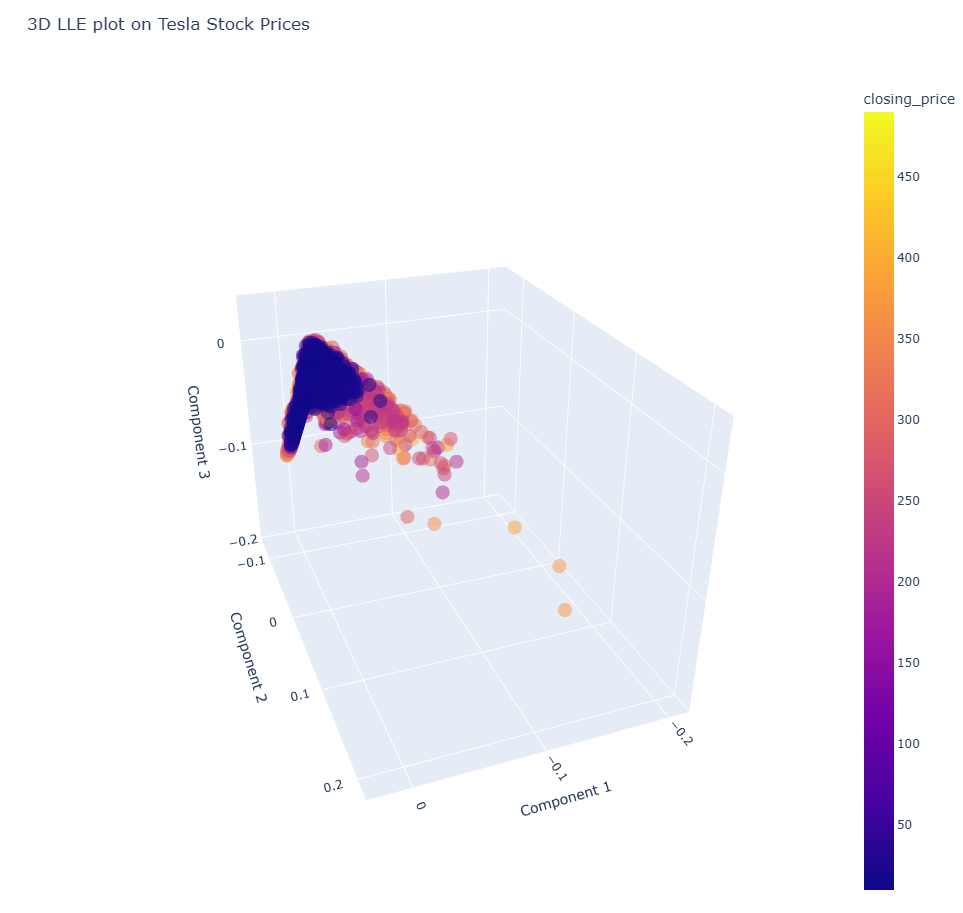


* It appears a stock price tends to be higher if Component 1 is more negative.

* On closer inspection, most of the the low stock prices appear to be at the very top of the saddle shape.

### Conclusion for LLE

I prefer PCA's visualizations since there is a more clear pattern of where the higher stock prices are located.

LLE is a bit more complicated, and the 2D LLE plot basically gives no information.


---

## Unsupervised Model 3: DBSCAN

Ok lets jump back into clustering again!

* DBSCAN stands for "Density-Based Spatial Clustering of Applications and Noise".

* DBSCAN is a easy model to understand. It clusters points based on density. Its not about where the points are located, its about the distance between points. DBSCAN does well in clustering groups of points that has irregular shapes.  


* As a bonus deal, DBSCAN can find outliers as well. If a point is too far away from other points, DBSCAN will just label that point as a outlier.  Outliers as labeled as "-1".


* DBSCAN does require parameters of eps and min_samples.

eps stands for epsilon ($\epsilon$). eps is the max distance between two points to be considered neighbors.

min_samples is the lowest number of observations needed to make a cluster.



* As a warning, DBSCAN defintely needs to use standardized data! But our PCA data is already standardized, so we do not have to standardize a second time.





In [ ]:
from sklearn.cluster import DBSCAN

# by default, we set eps = 0.5
# however, DBSCAN uses experimenation.
# we adjust the eps value, then adjust its value to get clusters
# that are more understandable


# eps = 0.6 -> max distance between two points to be considered neighbors,
# in order to make a cluster

# min_samples = 12 -> A cluster needs at least 5 observations


dbscan_model = DBSCAN(eps = 0.6, min_samples = 12)

dbscan_2d_df = pca_df[["PC1","PC2"]]

# fit the DBSCAN model with out PC values
dbscan_model.fit(dbscan_2d_df)

dbscan_labels = dbscan_model.labels_

print(dbscan_labels)

print("The outliers and clusters:", np.unique(dbscan_labels))

# lets store the dbscan labels in our PCA df:

pca_df["dbscan_2d_labels"] = dbscan_labels


[0 0 0 ... 1 1 1]
The outliers and clusters: [-1  0  1]


### 2D DBSCAN Plot

Text(0.5, 1.0, '2D DBSCAN plot for Tesla Stock Prices')

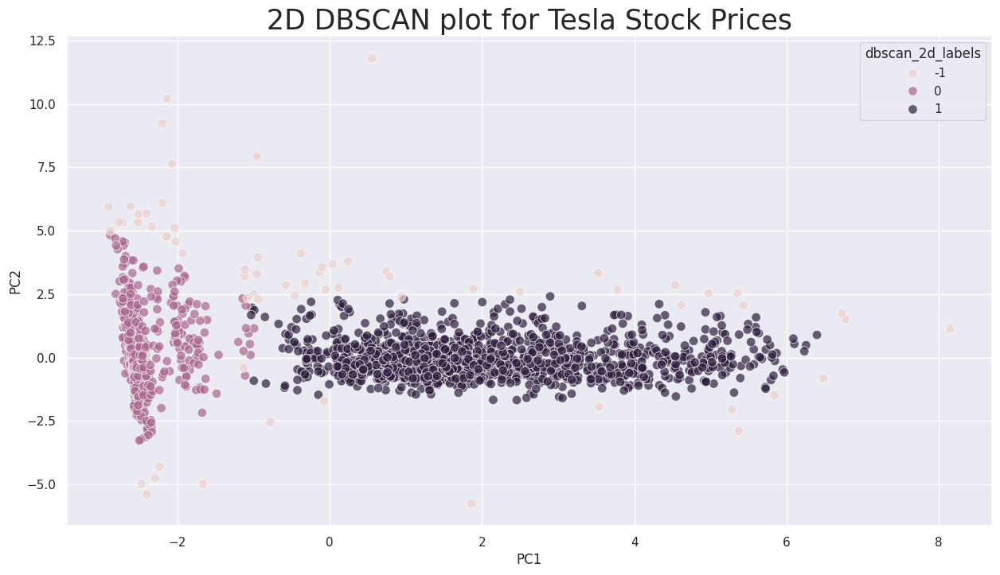

In [ ]:

fig = plt.figure(figsize = (15,8))


sns.scatterplot(pca_df, x="PC1", y = "PC2", hue = "dbscan_2d_labels",
                s = 70, alpha = 0.7)

plt.title("2D DBSCAN plot for Tesla Stock Prices", fontsize = 25)


It is hard to get understandable clusters using DBSCAN, but we have a general idea.

Recall that the left cluster contained the highest stock prices while the right long cluster contained the lowest stock prices. These appears to be our clusters. Any far away points seem to be our outliers.


Lets make DBSCAN clusters using 3D PCA.

### 3D DBSCAN Plot

In [ ]:
from sklearn.cluster import DBSCAN

# by default, we set eps = 0.5
# however, DBSCAN uses experimenation.
# we adjust the eps value, then adjust its value to get clusters
# that are more understandable


# eps = 0.6 -> max distance between two points to be considered neighbors,
# in order to make a cluster

# min_samples = 12 -> A cluster needs at least 5 observations


dbscan_model = DBSCAN(eps = 0.6, min_samples = 12)

dbscan_3d_df = pca_df[["PC1","PC2", "PC3"]]

# fit the DBSCAN model with out PC values
dbscan_model.fit(dbscan_3d_df)

dbscan_labels = dbscan_model.labels_

print(dbscan_labels)

print("The outliers and clusters:", np.unique(dbscan_labels))

# lets store the dbscan labels in our PCA df:

pca_df["dbscan_3d_labels"] = dbscan_labels

# make the dbscan labels a string:
pca_df["dbscan_3d_labels"] = pca_df["dbscan_3d_labels"].astype("str")


[ 0  0  0 ...  1 -1 -1]
The outliers and clusters: [-1  0  1]


In [ ]:
import plotly.express as px

dbscan_3d_plot = px.scatter_3d(
    pca_df,
    x = "PC1",
    y = "PC2",
    z = "PC3",
    title = "3D PCA-DBSCAN Plot of Tesla Stock Prices",
    color = "dbscan_3d_labels",
    symbol = "dbscan_3d_labels",
    color_discrete_map = {"0":"darkcyan", "1":"purple", "-1":"red"},
    symbol_map = {"0":"circle", "1":"x", "-1":"diamond"},
    opacity = 0.2, # similar to alpha in matplotlib
    size_max = 18, # point size
    width = 1000, # make width bigger
    height = 1000  # make height bigger

)

dbscan_3d_plot



### 3D DBSCAN Plot PNG file

In case plotly does not load, here is a picture:


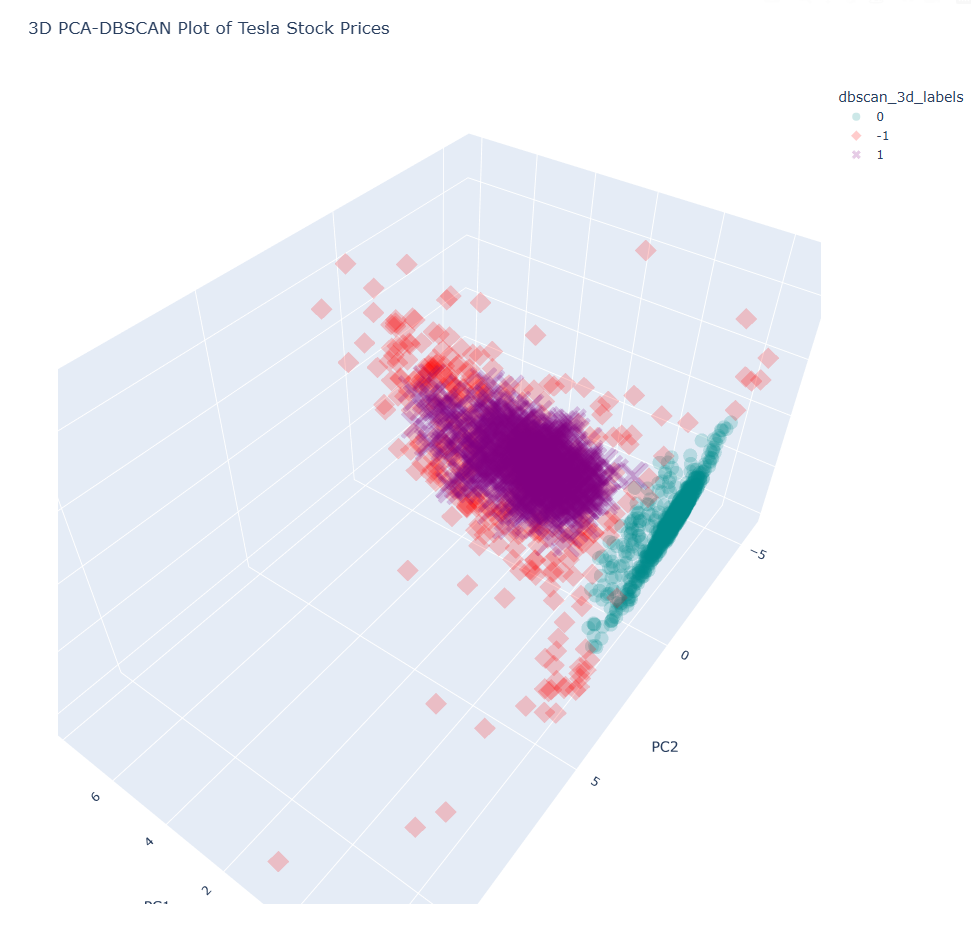

Overall the shape of the DBSCAN clusters for both 2D and 3D PCA plots are similar.



### Conclusion for DBSCAN

DBSCAN could not get perfect clusters of the low and high stock prices but it does give us a general idea.

DBSCAN would be a better choice than most clustering models such as K-Means since these clustering models have a determined amount of clusters and points. But sometimes, we won't know the amount of clusters we need or the amount of points to use.


---

## Unsupervised Model 4: Isolation Forest


Unsupervised learning models do not always have to be about obvious visual patterns or clusters. Unsupervised learning can also be about finding outliers/anomaly! Interestingly, outliers can be considered as extreme patterns.

This is what Isolation Forests do, this machine learning model tries to find outliers.

### Isolation Forest Intuition:


The of main idea of a Isolation Forest is that outliers just need a few cuts to be seperated from the data. Therefore, if a point only needs 1 cut to be seperated from the data, it is most likely a outlier.

Meanwhile, a non-outlier point needs many cuts to be seperated from the data. This suggests that this point is next to many other points.   


* Please refer to my Pokemon MEGA Project to see a in-depth explenation of Isolation Forest.


In [ ]:
from sklearn.ensemble import IsolationForest # 1. fetch the isolation forest model


# parameters defined:
# 1. n_estimators = 100 -> use 100 iso trees, this is the default number too
# 2. contamination = 0.05 -> The percentage of points that we want to assign as outliers
# In this case, 0.05 is 5%
# 3. random_state = 1 -> the seed number, makes the results reproducible

# 2. initate isolation forest model with parameters
IF_model = IsolationForest(n_estimators = 100, contamination = 0.05,
                           random_state = 1)

# 3. fit the model, applies for both unsupervised and superivsed:
IF_model.fit(X)


# 4. predict or transform points using model:

# binary label of -1 (outlier) or 1 (non-outlier)
preds = IF_model.predict(X)

anomaly_scores = IF_model.decision_function(X)

print("These are the first 20 predictions:", preds[0:20])
print("These are the last 20 predictions:", preds[len(tesla_df["close"])-20:len(tesla_df["close"])])

print()

print("These are the first 20 anomaly scores:", np.round(anomaly_scores[0:20],2))
print("These are the last 20 anomaly scores:", np.round(anomaly_scores[len(tesla_df["close"])-20:len(tesla_df["close"])],2))



These are the first 20 predictions: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
These are the last 20 predictions: [ 1  1  1 -1  1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]

These are the first 20 anomaly scores: [0.18 0.18 0.17 0.15 0.18 0.18 0.17 0.17 0.18 0.18 0.15 0.17 0.16 0.17
 0.14 0.16 0.14 0.14 0.11 0.12]
These are the last 20 anomaly scores: [ 0.03  0.03  0.01 -0.01  0.02 -0.   -0.02 -0.03 -0.01  0.01 -0.   -0.01
 -0.02 -0.03 -0.06 -0.06 -0.03 -0.05 -0.05 -0.06]


It appears the last observations have some outliers.

Lets now organize our Isolation Forest predictions


In [ ]:

IF_df = pd.DataFrame({"predictions":preds,
                      "anomaly_scores":anomaly_scores})

IF_df

,predictions,anomaly_scores
0,1,0.179995
1,1,0.180899
2,1,0.165828
3,1,0.152959
4,1,0.177321
...,...,...
2499,-1,-0.059665
2500,-1,-0.034335
2501,-1,-0.047752
2502,-1,-0.049445


What observations are outliers?

In [ ]:
outlier_df = IF_df[IF_df["predictions"] == -1]

# outlier_df


print(outlier_df.index)
# we have about 126 outliers out of approximately 2500 observations



Index([1021, 1022, 1023, 1024, 1025, 1026, 1028, 1031, 1043, 1051,
       ...
       2494, 2495, 2496, 2497, 2498, 2499, 2500, 2501, 2502, 2503],
      dtype='int64', length=126)


What values do these outliers have?



In [ ]:
unsupervised_df.iloc[outlier_df.index]

,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum
1482,1.3654,42.7207,38.41051,38.795483,435084982.0,-199296050.0,2.765963,43.3714,34.0334,9.1387
1481,7.5080,43.3714,40.20717,41.196304,235788932.0,472713214.0,4.738615,52.0000,36.4800,17.9666
1480,9.0074,52.0000,42.47291,44.458322,708502146.0,205578797.0,7.417819,59.1374,37.2014,22.6574
1479,9.4580,59.1374,43.57384,45.280445,914080943.0,-187723706.0,7.491982,59.1374,37.2014,11.0093
1478,7.2554,48.9800,44.75224,46.125946,726357237.0,-128146286.0,7.470220,59.1374,37.2014,11.7840
...,...,...,...,...,...,...,...,...,...,...
4,29.0799,489.8800,458.40300,459.302242,107608100.0,-1117700.0,15.247209,489.8800,439.5800,20.5200
3,17.7400,467.2600,461.28700,463.678198,106490400.0,-11321950.0,17.053748,489.8800,439.5800,28.8400
2,15.7700,483.3700,463.90700,466.863980,95168450.0,8136950.0,17.968584,489.8800,439.5800,26.2000
1,13.5000,481.2000,468.82200,470.839620,103305400.0,-16389330.0,17.284020,489.8800,445.1700,49.1500


How do regular observation valuyes look like?

In [ ]:
# WARNING: Doing this code below will NOT remove the outlier index!
# It will do negative indexing again! BE CAREFUL!

# unsupervised_df.iloc[-(outlier_df.index)]

# This following code will give us a df without any outliers!

no_outlier_df = unsupervised_df.drop(index = outlier_df.index)
no_outlier_df


,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum
2493,0.5960,13.0920,13.44886,13.495072,40431100.0,33922633.0,0.327806,13.9980,12.9040,-0.9527
2488,0.8594,13.1293,12.93233,12.948969,79435235.0,7036977.0,0.405339,13.5033,12.1853,-1.4627
2486,0.5993,11.5653,12.59993,12.513994,118914541.0,-53222944.0,0.626381,13.5033,11.5653,-1.6426
2485,1.0170,11.6887,12.33360,12.209632,65691597.0,75825757.0,0.753005,13.1293,10.8400,-2.6633
2484,0.7434,10.8400,12.01100,11.783517,141517354.0,-1916114.0,1.031521,13.1293,9.8660,-3.2260
...,...,...,...,...,...,...,...,...,...,...
4,29.0799,489.8800,458.40300,459.302242,107608100.0,-1117700.0,15.247209,489.8800,439.5800,20.5200
3,17.7400,467.2600,461.28700,463.678198,106490400.0,-11321950.0,17.053748,489.8800,439.5800,28.8400
2,15.7700,483.3700,463.90700,466.863980,95168450.0,8136950.0,17.968584,489.8800,439.5800,26.2000
1,13.5000,481.2000,468.82200,470.839620,103305400.0,-16389330.0,17.284020,489.8800,445.1700,49.1500


It may not be obvious, but the outliers are  any observations that have at least one predictor variable value that is extremely high or low.

This is the main criteria that Isolation Forest uses to find outliers.

---


Lets view two types of Isolation Forest plots:

Firstly, lets view a outlier plot.

Secondly, lets view a anomaly score plot.


### 2D Isolation Forest Plot - Outliers


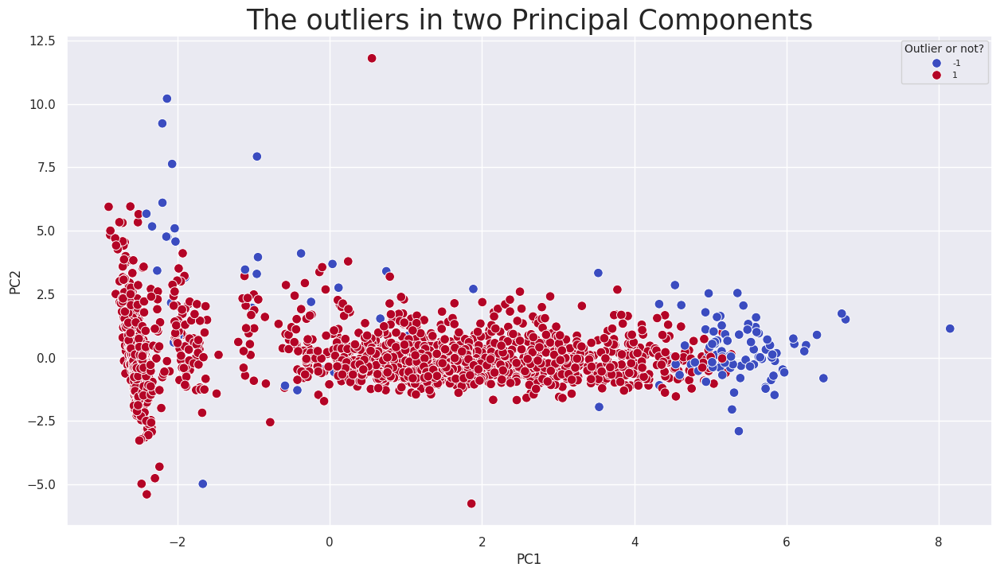

In [ ]:
fig = plt.figure(figsize=(15,8))



sns.scatterplot(data = pca_df, x= "PC1" , y= "PC2",
                hue = preds, s = 70, alpha = 1,
                palette = "coolwarm" )


plt.title("The outliers in two Principal Components", fontsize = 25)


plt.legend(title = "Outlier or not?", title_fontsize= 10, fontsize=8);
# title and labels font size



We can see that the outliers are usually in the outer parts of the plot.

But surprisingly, some outliers are somewhat near the center, even if many points are at the center.

Perhaps PCA is not the most perfect plot to demonstrate outliers, but PCA is one of the only way to visualize many predictors in a 2D or 3D plot.

### 2D Isolation Forest Plot - Anomaly Scores


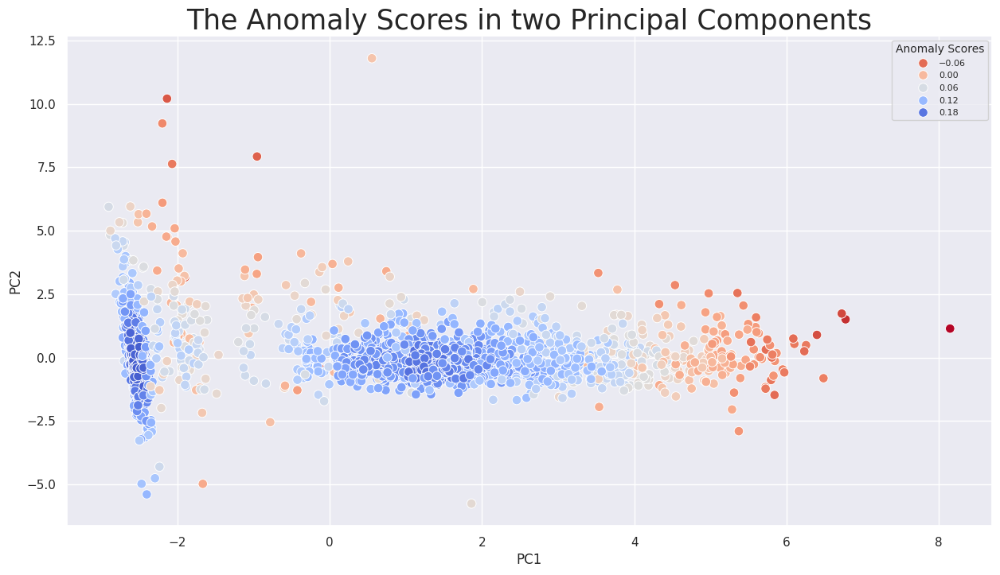

In [ ]:
fig = plt.figure(figsize=(15,8))



sns.scatterplot(data = pca_df, x= "PC1" , y= "PC2",
                hue = anomaly_scores, s = 70, alpha = 1,
                palette = "coolwarm_r" )


plt.title("The Anomaly Scores in two Principal Components", fontsize = 25)


plt.legend(title = "Anomaly Scores", title_fontsize= 10, fontsize=8);
# title and labels font size



### 3D Isolation Forest Plot - Outliers



In [ ]:
# will need to convert to string to make plotly not use continous color map
preds = preds.astype("str")

pca_3d_plot_IF = px.scatter_3d(
    pca_df,
    x="PC1",
    y="PC2",
    z="PC3",
    title = "The Outliers in three Principal Components.",
    color = preds,
    color_discrete_map = {"-1":"orange", "1":"blue"}, # lets pick our colors
    symbol = preds,
    symbol_map = {"-1":"square", "1":"circle"},
    opacity = 0.8,
    size_max = 18,
    width = 1000,
    height = 1000

)

pca_3d_plot_IF



### 3D Isolation Forest Plot - Outliers PNG file

In case Plotly does not load, here is a picture:

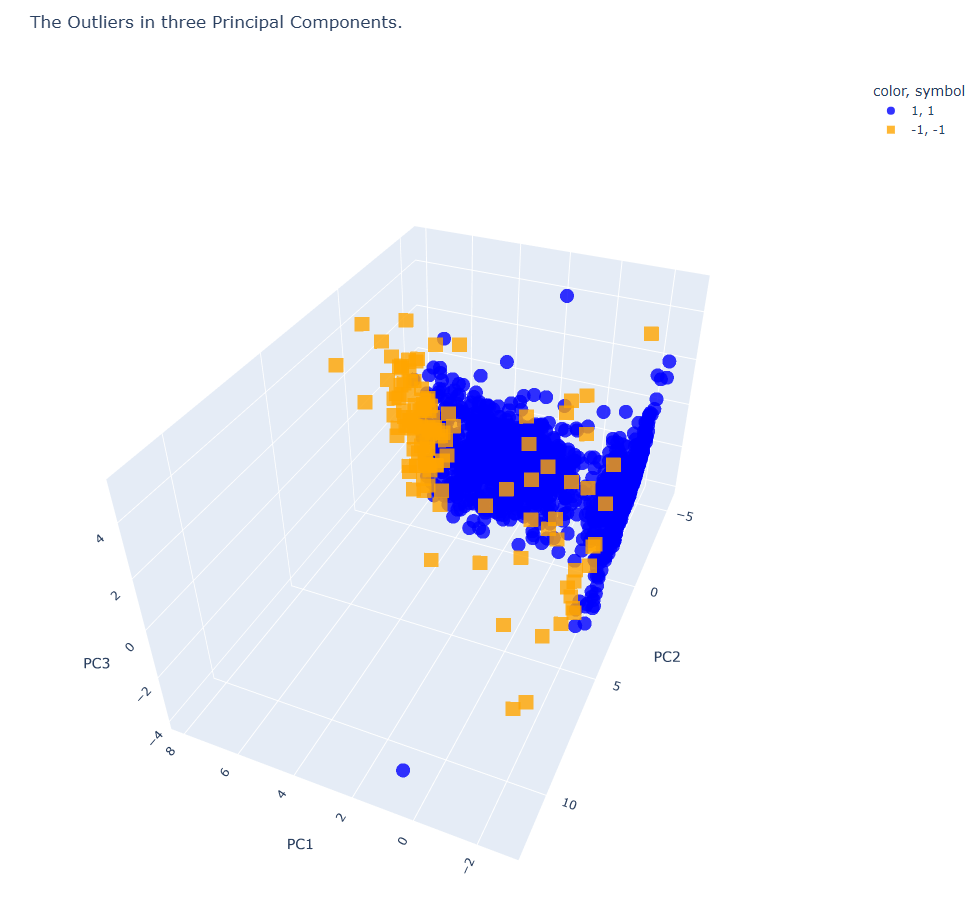


The 3D picture defintely gives more insight on where the outliers are located.

The 2D and 3D picture gave relatively similar patterns.

### 3D Isolation Forest Plot - Anomaly Scores


In [ ]:

pca_3d_plot_IF_anomaly = px.scatter_3d(
    pca_df,
    x="PC1",
    y="PC2",
    z="PC3",
    title = "The Anomaly Scores in three Principal Components.",
    color = anomaly_scores,
    color_continuous_scale = "magma", # lets pick our own color again
    opacity = 0.8,
    size_max = 18,
    width = 1000,
    height = 1000

)


pca_3d_plot_IF_anomaly



### 3D Isolation Forest Plot - Anomaly Scores PNG file

In case Plotly does not load, here is a picture:

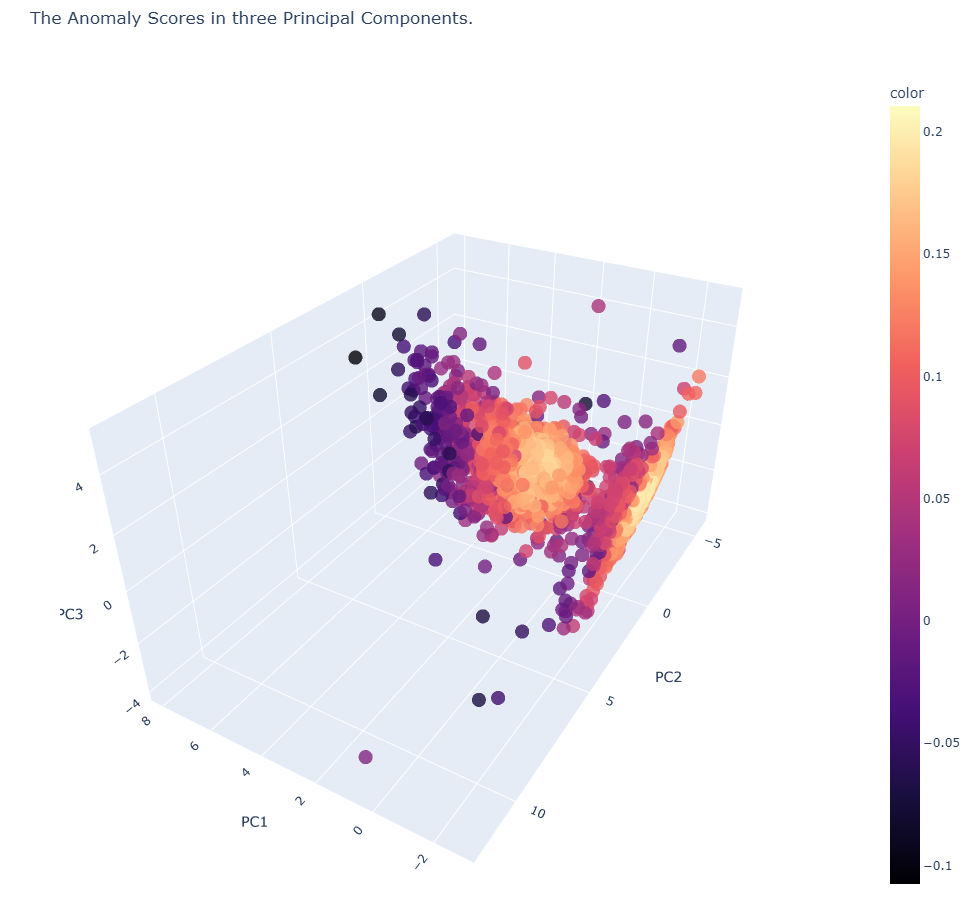



The more darker the point, the more likely it is a outlier.

---
When comparing the outlier and anomaly score plots, I think I prefer the anomaly score plots more.

The anomaly scores are an objective score to see if a point is likely a outlier.

If we set "contamination = 0.5", then Isolation Forest will try to find 50% of points that are likely outliers even though most of their anomaly scores are positive.

Therefore, classifying a point as a outlier can be subjective. But assigning a point's anomaly score is a more objective metric.


### Conclusion for Isolation Forest

Isolation Forest did not reveal any obvious insights in this data set.

The outliers could either be a low or high stock price. Therefore, outliers are not a great way to detect a stock's price level.

Instead, Isolation Forest flagged any high stock prices with at least one extremely low predictor value, and low stock prices with at least one extremely high predictor value as outliers.

---

# 📈 SECTION E: Objective 2- Regression

## Some notes about validation sets and cross validation sets:

Lets go over how we will organize the data one more time:

### How will the training set and testing set work?

Recall that I made generations 1 to 8 the training set and generation 9 the testing set!

---

Because of this, we do NOT use this code:

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test =  train_test_split(X,y, training_size = 0.8
 random_state = 0)

This would randomize the stock prices and we may have 2025 stock prices at the training set, which is NOT the goal of this project!
All we want are the past values of 2016 to 2024 in the training set. Then we want the "future" values of 2025 in the testing set.



---

### What about cross validaition?

I will not be using this code either:

from sklearn.model_selection import cross_val_score

cross_val_score(model,X,y,cv=5) # make 5 sets of training and validation sets

I agree that cross validation (CV) can give us a better generalization of how much our error our model has. This is because cross validation takes k-1 sets of training and use 1 set as the testing set, estimate the error for each scenario, then take the average of the scenarios.

But the problem is that CV could consider a 2017 stock price as a testing set, and a 2025 stock price in the training set. This is not my goal and this is possible data leakage. The training set has "future information".

---



## Create training set and testing set

Let's set up the training set and testing set.


* As a reminder, the training set is the data that trains a model. This will include data from years 2016 to 2024.


* Meanwhile, the testing set is the data that validates a model's performance. This will include data from years 2025.


* Splitting data by year ensures that the model is trained on past data and tested on future data.  This is important for time-series data or sequential tasks.


In [ ]:
# recall this is the original tesla_df:

tesla_df




,date,close,volume,open,high,low,daily_range,percent_change,previous_close,price_change,...,volume_MA10,volume_ratio,SMA_10,EMA_10,rolling_std_10,rolling_max_10,rolling_min_10,close_shift_10,momentum,ROC_10
2503,2016-01-11,13.8567,61362614,14.2673,14.2967,13.5333,0.7634,-0.014929,14.0667,-0.2100,...,53562226.7,1.145632,14.96415,14.703243,0.762065,16.0007,13.8567,15.3713,-1.5146,-9.853428
2502,2016-01-12,13.9980,46185742,14.1067,14.2493,13.6873,0.5620,0.010197,13.8567,0.1413,...,55330545.8,0.834724,14.83762,14.575017,0.810387,16.0007,13.8567,15.2633,-1.2653,-8.289819
2501,2016-01-13,13.3540,61814864,14.1340,14.1767,13.3333,0.8434,-0.046007,13.9980,-0.6440,...,57908377.0,1.067460,14.59175,14.353014,0.853514,16.0007,13.3540,15.8127,-2.4587,-15.548894
2500,2016-01-14,13.7453,97358636,13.4807,14.0000,12.8920,1.1080,0.029302,13.3540,0.3913,...,62102571.4,1.567707,14.37901,14.242520,0.758613,16.0007,13.3540,15.8727,-2.1274,-13.402887
2499,2016-01-15,13.6660,79886555,13.2647,13.6713,13.1500,0.5213,-0.005769,13.7453,-0.0793,...,66020503.4,1.210026,14.14554,14.137699,0.528400,14.8953,13.3540,16.0007,-2.3347,-14.591237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,2025-12-17,467.2600,106490400,488.2200,495.2799,466.2000,29.0799,-0.046175,489.8800,-22.6200,...,80340162.0,1.325494,458.40300,459.302242,15.247209,489.8800,439.5800,446.7400,20.5200,4.593276
3,2025-12-18,483.3700,95168450,478.1600,490.8600,473.1200,17.7400,0.034478,467.2600,16.1100,...,82666358.0,1.151236,461.28700,463.678198,17.053748,489.8800,439.5800,454.5300,28.8400,6.345016
2,2025-12-19,481.2000,103305400,488.1200,490.4900,474.7200,15.7700,-0.004489,483.3700,-2.1700,...,87354146.0,1.182604,463.90700,466.863980,17.968584,489.8800,439.5800,455.0000,26.2000,5.758242
1,2025-12-22,488.7300,86916070,489.8800,498.8300,485.3300,13.5000,0.015648,481.2000,7.5300,...,89129178.0,0.975170,468.82200,470.839620,17.284020,489.8800,445.1700,439.5800,49.1500,11.181127


### Attach the time variable from tesla_df to regression_df

We will need this to see the exact time values for regression_df.


In [ ]:
regression_df["date"] = tesla_df["date"]

regression_df

,close,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum,date
2503,13.8567,0.7634,14.0667,14.96415,14.703243,53585373.0,7777241.0,0.762065,16.0007,13.8567,-1.5146,2016-01-11
2502,13.9980,0.5620,13.8567,14.83762,14.575017,61362614.0,-15176872.0,0.810387,16.0007,13.8567,-1.2653,2016-01-12
2501,13.3540,0.8434,13.9980,14.59175,14.353014,46185742.0,15629122.0,0.853514,16.0007,13.3540,-2.4587,2016-01-13
2500,13.7453,1.1080,13.3540,14.37901,14.242520,61814864.0,35543772.0,0.758613,16.0007,13.3540,-2.1274,2016-01-14
2499,13.6660,0.5213,13.7453,14.14554,14.137699,97358636.0,-17472081.0,0.528400,14.8953,13.3540,-2.3347,2016-01-15
...,...,...,...,...,...,...,...,...,...,...,...,...
4,467.2600,29.0799,489.8800,458.40300,459.302242,107608100.0,-1117700.0,15.247209,489.8800,439.5800,20.5200,2025-12-17
3,483.3700,17.7400,467.2600,461.28700,463.678198,106490400.0,-11321950.0,17.053748,489.8800,439.5800,28.8400,2025-12-18
2,481.2000,15.7700,483.3700,463.90700,466.863980,95168450.0,8136950.0,17.968584,489.8800,439.5800,26.2000,2025-12-19
1,488.7300,13.5000,481.2000,468.82200,470.839620,103305400.0,-16389330.0,17.284020,489.8800,445.1700,49.1500,2025-12-22


### Filtering rows that contain 2016 to 2024, and 2025:

We simply use the following code format:

regression_df["date"].between("2016-01-01", "2024-12-31")

-> This will give a boolean series of Trues and Falses. Any date that is in the year 2016 and 2024 will be "True". Otherwise the observation is a "False" value.


In [ ]:
regression_df["date"].between("2016-01-01", "2024-12-31")




,date
2503,True
2502,True
2501,True
2500,True
2499,True
...,...
4,False
3,False
2,False
1,False


Now lets use this boolean series to get filter all the True values, AKA the year values of 2016 to 2024!

This will be our training set!


In [ ]:
training_df = regression_df[regression_df["date"].between("2016-01-01", "2024-12-31")]

training_df


,close,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum,date
2503,13.8567,0.7634,14.0667,14.96415,14.703243,53585373.0,7777241.0,0.762065,16.0007,13.8567,-1.5146,2016-01-11
2502,13.9980,0.5620,13.8567,14.83762,14.575017,61362614.0,-15176872.0,0.810387,16.0007,13.8567,-1.2653,2016-01-12
2501,13.3540,0.8434,13.9980,14.59175,14.353014,46185742.0,15629122.0,0.853514,16.0007,13.3540,-2.4587,2016-01-13
2500,13.7453,1.1080,13.3540,14.37901,14.242520,61814864.0,35543772.0,0.758613,16.0007,13.3540,-2.1274,2016-01-14
2499,13.6660,0.5213,13.7453,14.14554,14.137699,97358636.0,-17472081.0,0.528400,14.8953,13.3540,-2.3347,2016-01-15
...,...,...,...,...,...,...,...,...,...,...,...,...
249,462.2800,27.6400,430.6000,441.22200,432.979283,72698060.0,-13146310.0,20.514902,479.8600,418.1000,61.2900,2024-12-24
248,454.1300,14.3099,462.2800,444.15800,436.824868,59551750.0,17099460.0,19.993049,479.8600,418.1000,29.3600,2024-12-26
247,431.6600,23.5000,454.1300,445.51400,435.885801,76651210.0,6015610.0,18.427911,479.8600,421.0600,13.5600,2024-12-27
246,417.4100,11.2500,431.6600,443.63200,432.526565,82666820.0,-17725810.0,20.342933,479.8600,417.4100,-18.8200,2024-12-30


Now lets do the same approach with the year 2025!

This will be our testing set!

In [ ]:
regression_df["date"].between("2025-01-01", "2025-12-31")


,date
2503,False
2502,False
2501,False
2500,False
2499,False
...,...
4,True
3,True
2,True
1,True


In [ ]:
testing_df = regression_df[regression_df["date"].between("2025-01-01", "2025-12-31")]

testing_df


,close,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum,date
244,379.28,19.6899,403.84,427.656,418.577948,76825120.0,32885580.0,24.056436,462.28,379.28,-100.58,2025-01-02
243,410.44,32.4299,379.28,424.687,417.098321,109710700.0,-14287370.0,24.177697,462.28,379.28,-29.69,2025-01-03
242,411.05,24.7300,410.44,422.175,415.998626,95423330.0,-9906800.0,24.157024,462.28,379.28,-25.12,2025-01-06
241,394.36,24.3300,411.05,419.505,412.064331,85516530.0,-9817000.0,25.718991,462.28,379.28,-26.70,2025-01-07
240,394.94,15.0999,394.36,415.939,408.950816,75699530.0,-2660720.0,26.470896,462.28,379.28,-35.66,2025-01-08
...,...,...,...,...,...,...,...,...,...,...,...,...
4,467.26,29.0799,489.88,458.403,459.302242,107608100.0,-1117700.0,15.247209,489.88,439.58,20.52,2025-12-17
3,483.37,17.7400,467.26,461.287,463.678198,106490400.0,-11321950.0,17.053748,489.88,439.58,28.84,2025-12-18
2,481.20,15.7700,483.37,463.907,466.863980,95168450.0,8136950.0,17.968584,489.88,439.58,26.20,2025-12-19
1,488.73,13.5000,481.20,468.822,470.839620,103305400.0,-16389330.0,17.284020,489.88,445.17,49.15,2025-12-22


---

### What do the words "predictors" and "response" mean?

* Predictor variables- The $x$ variables, also known as independent variables or features. The model uses this to make predictions. Predictors are usually stored in a matrix, commonly known as a feature matrix.  The feature matrix is made up of multiple columns from a data frame.

* Response variable- The $y$ variable, also known as dependent variable or target. The model tries to predict these values. The response is usually stored in a vector (1D array). The response vector is made up of a single column from a data frame. Or, if we want estimated values, then the estimated response vector is made up values predicted by the model!

* Throughout this project, I will mostly be using the words "predictor" and "response".  



---

* This is the predictor/feature matrix:


$$X_{[n \times p]} =
\begin{bmatrix}
x_{1,1} & x_{1,2} & \cdots & x_{1,p} \\
x_{2,1} & x_{2,2} & \cdots & x_{2,p} \\
\vdots  & \vdots  & \ddots & \vdots \\
x_{n,1} & x_{n,2} & \cdots & x_{n,p}
\end{bmatrix}$$

Both Supervised Learning and Un-Supervised Learning models use the predictor matrix.


* This is the response vector:

$$\vec y_{[n \times 1]} =
\begin{bmatrix}
y_1 \\
y_2 \\
\vdots \\
y_n
\end{bmatrix}$$

Only the Supervised Learning models use a response vector.

Where:

$n$ is the number of observations.
$p$ is the number of predictors.

$x_{3,4}$ is the 3rd observation's 4th predictor value.

$y_3$ is the 3rd observation's response value.




---


## Setting up the predictor matrices and response vectors:

Lets create 4 Python variables:

* $X_{train}$ = Training set predictor matrix

* $\vec y_{train}$ = Training set response vector

* $X_{test}$ = Testing set predictor matrix

* $\vec y_{test}$ = Testing set response vector



In [ ]:
# X_train:

# ALERT: doing -> training_df[-["close","date"]] -> will RESULT IN A ERROR!
# use training_df.drop(columns = ["close","date"])

# we need to drop "date" since that is not a predictor variable we will use!

X_train = training_df.drop(columns = ["close","date"])
X_train





,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum
2503,0.7634,14.0667,14.96415,14.703243,53585373.0,7777241.0,0.762065,16.0007,13.8567,-1.5146
2502,0.5620,13.8567,14.83762,14.575017,61362614.0,-15176872.0,0.810387,16.0007,13.8567,-1.2653
2501,0.8434,13.9980,14.59175,14.353014,46185742.0,15629122.0,0.853514,16.0007,13.3540,-2.4587
2500,1.1080,13.3540,14.37901,14.242520,61814864.0,35543772.0,0.758613,16.0007,13.3540,-2.1274
2499,0.5213,13.7453,14.14554,14.137699,97358636.0,-17472081.0,0.528400,14.8953,13.3540,-2.3347
...,...,...,...,...,...,...,...,...,...,...
249,27.6400,430.6000,441.22200,432.979283,72698060.0,-13146310.0,20.514902,479.8600,418.1000,61.2900
248,14.3099,462.2800,444.15800,436.824868,59551750.0,17099460.0,19.993049,479.8600,418.1000,29.3600
247,23.5000,454.1300,445.51400,435.885801,76651210.0,6015610.0,18.427911,479.8600,421.0600,13.5600
246,11.2500,431.6600,443.63200,432.526565,82666820.0,-17725810.0,20.342933,479.8600,417.4100,-18.8200


In [ ]:
# y_train

y_train = training_df["close"]
y_train


,close
2503,13.8567
2502,13.9980
2501,13.3540
2500,13.7453
2499,13.6660
...,...
249,462.2800
248,454.1300
247,431.6600
246,417.4100


In [ ]:
# X_test:

# we need to drop "date" since that is not a predictor variable we will use!

X_test = testing_df.drop(columns = ["close","date"])
X_test





,daily_range,previous_close,SMA_10,EMA_10,previous_volume,volume_change,rolling_std_10,rolling_max_10,rolling_min_10,momentum
244,19.6899,403.84,427.656,418.577948,76825120.0,32885580.0,24.056436,462.28,379.28,-100.58
243,32.4299,379.28,424.687,417.098321,109710700.0,-14287370.0,24.177697,462.28,379.28,-29.69
242,24.7300,410.44,422.175,415.998626,95423330.0,-9906800.0,24.157024,462.28,379.28,-25.12
241,24.3300,411.05,419.505,412.064331,85516530.0,-9817000.0,25.718991,462.28,379.28,-26.70
240,15.0999,394.36,415.939,408.950816,75699530.0,-2660720.0,26.470896,462.28,379.28,-35.66
...,...,...,...,...,...,...,...,...,...,...
4,29.0799,489.88,458.403,459.302242,107608100.0,-1117700.0,15.247209,489.88,439.58,20.52
3,17.7400,467.26,461.287,463.678198,106490400.0,-11321950.0,17.053748,489.88,439.58,28.84
2,15.7700,483.37,463.907,466.863980,95168450.0,8136950.0,17.968584,489.88,439.58,26.20
1,13.5000,481.20,468.822,470.839620,103305400.0,-16389330.0,17.284020,489.88,445.17,49.15


In [ ]:
# y_test

y_test = testing_df["close"]
y_test


,close
244,379.28
243,410.44
242,411.05
241,394.36
240,394.94
...,...
4,467.26
3,483.37
2,481.20
1,488.73


## Regression Model 1: Linear Regression (Lets see how bad it does...)

Lets see how horrible Linear Regression predicts. Remember that Linear Regression needs predictors that are linear, but we have some predictors that are non-linear. Sooooooo lets just say this linear regression model will not be happy.

---
### Linear Regression explained

Here is the formula for the fitted linear regression model:

$$\widehat y_i = \widehat \beta_0 + \widehat \beta_1 x_{i1} + \widehat \beta_2 x_{i2} + ... + \widehat \beta_p x_{ip} + \widehat e_i$$

Where:

$$\widehat e_i \sim N(0, \widehat \sigma^2)$$


Here is what each notation means:

* $\widehat y_i$ is the response variable value for the i-th observation.

* $\widehat \beta_0$ is the intercept coefficient. In a slope line of, $y = mx+b$, $\beta_0$ is $b$.

* $\widehat \beta_1,... \widehat \beta_p$ are the "slope" coefficients. In a slope line, $y = mx + b$, $\widehat \beta_1$ is $m$. In a plane of $z = ax +by + c$, $\widehat \beta_1$ is $a$ and $\widehat  \beta_2$ is $b$.

* $x_{i1},x_{i2},...x_{ip}$ are the predictors. In our model, $x_{i1}$ is height_meters of a Pokemon in the i-th observation. Use the same logic for the next three predictors.  

* $\widehat e_i$ is the estimated residual for the i-th observation. The word "residual" is a fancy name for "error".

* $\widehat e_i \sim N(0, \widehat  \sigma^2)$ means that the estimated residuals should be normally distributed with a mean of 0 and have a constant variance of $\widehat \sigma^2$.

---

* The training set only has a sample from the population of data. Therefore a linear regression model will not get true values. This is why use hats like $\widehat \sigma^2$, any variables with hats are known as estimators (AKA statistics). These estimators are used to estimate the population value of $\sigma^2$, also known as the parameter.

* The main idea of linear regression is that the predicted value of $\widehat y_i$ tries to estimate the real value of $y_i$.

---

### Why the residual assumption is IMPORTANT!

* Linear Regression makes the best line or plane of fit with residuals! But if the residuals do NOT behave well, then this is a big sign Linear Regression is a bad model for the given data!!

* And be careful! Linear Regression can still fit with data that is either normally distributed or not normally distributed! The data is NOT what determines if Linear Regression is a good fit.

* The RESIDUALS determine if linear regression is a good fit! If the residuals are normally distributed, then Linear Regression is appropriate. If the residuals are not normally distributed, Linear Regression may not be the best model!

(This explenation originally appeared in my  Pokemon MEGA Project.)

---

Lets start making our linear regression model!

In [ ]:
from sklearn.linear_model import LinearRegression

linear_reg_model = LinearRegression(fit_intercept=True)

linear_reg_model.fit(X_train,y_train)


# lets round to 2 decimal places since actual values has 2 decimal places!
y_preds = np.round(linear_reg_model.predict(X_test),2)

# y_preds

results_df = pd.DataFrame({"Actual values": y_test,
                          "Predicted values": y_preds})

results_df


,Actual values,Predicted values
244,379.28,373.30
243,410.44,398.48
242,411.05,402.49
241,394.36,399.05
240,394.94,397.19
...,...,...
4,467.26,471.42
3,483.37,478.99
2,481.20,479.60
1,488.73,489.50


It is surprsing to see that some of Linear Regression's predicted values are really close to the actual closing price values!



## Why rMSE?

Firstly, we need a metric that measures how well our ML model estimates. One way is to measure the error of the actual testing set value vs the predicted value. Many people who use regression models uses MSE which is "Mean Squared Error".

rMSE simply means "root Mean Squared Error". And there is a interpretation difference between MSE and rMSE.

MSE has squared units. rMSE has regular units.

So lets say someone kicks a soccer ball and we want to measure the distance of how far he can kick the ball, and this person does multiple kick attempts. Next, we try to make a model where we predict how far the ball travels.

Then we calculate the MSE and we have a slight issue! We get our error in squared units. It is a bit cumbersome to say that the error of our model is in $81 ~ meters^2$.

We could take the square root of the error and finally say our model has a error of about $9 ~ meters$.  The interpretation is much easier with regular units compared to squared units!


In this case, linear regression has a rMSE of about 67.58 in terms of pokemon total base stats.

---

### What is a good rMSE value?

It depends on the response variable on if our rMSE value is good. If our response variable ranges from 0 to 10,000, having a rMSE of 3 is extremely good. But if the response variable ranges from 0 to 7, a rMSE of 3 is terrible.

One effective way to gauge rMSE is by taking the standard deviaition of the response variable. If the rMSE is lower than the standard deviation, it is a good rMSE!

Recall that the sample variance formula is:

$$Var(y_i) = s^2 = \frac{1}{n-1} \sum^n_{i=1} (y_i - \bar y)^2$$

Where:
* $y_i$ is the ith-observation's response variable value.

* $\bar y = \frac{1}{n}\sum^n_{i=1} y_i$ is the mean of the response variable.

* $n$ is the number of observations in the data set.

The standard variation is just the square root of the variance:

$$SD(y_i) = s = \sqrt{\frac{1}{n-1}\sum^n_{i=1} (y_i - \bar y)^2}$$


(This explenation originally appeared in my  Pokemon MEGA Project.)



In [ ]:
# standard deviation of response variable
SD_close_price = testing_df["close"].std()
print("The testing set's standard deviation of closing price:",SD_close_price)

SD_close_price_training = training_df["close"].std()
print("The training set's standard deviation of closing price:", SD_close_price_training)


# function that checks the rMSE number of a model and compares it with the st dev
def rMSE_check(rMSE_number):
  if rMSE_number < 0.05 * SD_close_price:
    print("Model's rMSE is NEARLY PERFECT!!!")
  elif rMSE_number < 0.1 * SD_close_price:
    print("Model's rMSE is AMAZING!!")
  elif rMSE_number < 0.15 * SD_close_price:
    print("MOdel's rMSE is fantastic!")
  elif rMSE_number < 0.2 * SD_close_price:
    print("Model's rMSE is above great.")
  elif rMSE_number < 0.33 * SD_close_price:
    print("Model's rMSE is great.")
  elif rMSE_number < 0.66 * SD_close_price:
    print("Model's rMSE is good.")
  elif rMSE_number < SD_close_price:
    print("Model's rMSE is ok.")
  elif rMSE_number >= SD_close_price:
    print("Model's rMSE is terrible...")
  else:
    print("This may not be a valid rMSE number, rMSE must be a positive number or 0.")



The testing set's standard deviation of closing price: 68.92053268159945
The training set's standard deviation of closing price: 115.13336337708994


Now, lets find the linear regression's rMSE value!

In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import root_mean_squared_error

linear_reg_MSE = mean_squared_error(y_test, y_preds)

print("Linear Regression's MSE number:", linear_reg_MSE)


# home-made rMSE value:
linear_reg_rMSE_1 = round(np.sqrt(mean_squared_error(y_test, y_preds)),3)

print("Linear Regression's rMSE v1 number:", linear_reg_rMSE_1)


# Does root_mean_squared_error() function give the same value as our home-made rMSE value?
linear_reg_rMSE_2 = round(root_mean_squared_error(y_test, y_preds),3)

print("Linear Regression's rMSE v2 number:", linear_reg_rMSE_2)

# make a official rMSE variable for linear regression
linear_reg_rMSE = linear_reg_rMSE_2




Linear Regression's MSE number: 54.13545346938774
Linear Regression's rMSE v1 number: 7.358
Linear Regression's rMSE v2 number: 7.358


In [ ]:
rMSE_check(linear_reg_rMSE)



MOdel's rMSE is fantastic!


### Conclusion for Linear Regression

* Surprisingly, Linear Regression predicted the 2025 stock prices well! The rMSE of 7.358 is a low error number!

* Now the fact that some predictors were non-linear violated the model assumptions, but in machine learning, we care more about predicting values.

Next, let's explore modified versions of Linear Regression.  Ridge and LASSO are the family members of Linear Regression and they can handle non-linear and correlated predictors.


---

## Regression Model 2: Ridge


Ridge is a special type of linear regression where the beta coeffcients shrink towards zero, but never become zero.

The reason we use Ridge is to reduce mean squared error (MSE) and to reduce variance/overfitting!


We normally use Ridge if we believe the predictors are correlated. Based on our EDA plots, it is possible some predictors are correlated with other predictors.


### Theory of Ridge Regression:




* In Ridge, a lambda($\lambda$) penalty term is used with the regular linear regression RSS (Residual Sums of Squares). The bigger the lambda penalty, the more the beta coefficients shrink towards 0. BUT the coefficients will NOT be exactly 0, even if $\lambda$ is big!

Here is how the RIdge works:

$$\vec{\widehat{\beta}^{R}} = arg ~ min_{\beta} \left\{ \sum^n_{i=1} (y_i - \widehat y_i )^2 + \lambda \sum^p_{j =1} \widehat \beta_j^2 \right\}$$

Where: $\lambda$ is the penalty term. The bigger the lambda, the more the beta coefficients shrink.

$\vec{\widehat \beta_R}$ is the vector of our modified beta coefficients.


* Please reference the Pokemon MEGA project for a more in-depth explenation of Ridge and it's application to predicting Pokemon stats.



In [ ]:
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import ridge_regression # <- problem, has no CV for alpha

# we should do cross validation to find the best alpha value.
# cross validation defintely matters to get a significantly lower rMSE
# furthermore, the computation time is fast for ridgeCV

# one problem with RidgeCV is that it needs alpha guesses,
# RidgeCV

ridge_model = RidgeCV(alphas = [0.001,0.01,0.1,1,10,100, 1000], cv = 10)
ridge_model.fit(X_train,y_train)

y_preds = np.round(ridge_model.predict(X_test),2)

results_df = pd.DataFrame({"Actual values": y_test, "Predicted values": y_preds})
results_df


,Actual values,Predicted values
244,379.28,373.52
243,410.44,398.45
242,411.05,402.62
241,394.36,399.23
240,394.94,397.23
...,...,...
4,467.26,471.49
3,483.37,478.85
2,481.20,479.57
1,488.73,489.48


In [ ]:
ridge_rMSE = round(root_mean_squared_error(y_test,y_preds),3)

print("Ridge's rMSE number:", ridge_rMSE)

rMSE_check(ridge_rMSE)


Ridge's rMSE number: 7.359
MOdel's rMSE is fantastic!


### Conclusion for Ridge

Linear Regression and Ridge had almost identical rMSE values, so Ridge was not a meaningful improvment.

What about LASSO?


---

## Regression Model 3: LASSO


LASSO is a special type of linear regression where the beta coeffcients shrink towards zero, and CAN become zero. This means LASSO acts as a variable selector. Lets say $\widehat \beta_2 = 0$, then the weight predictor of $x_2$ does nothing, since $0 * any~number = 0$.

The weight predictor is basically selected out of the model!

In the formula, the predicted value of $\widehat y_i$ is:

$$\widehat y_i = \widehat \beta_0 + \widehat \beta_1 x_{i1} + 0 * x_{i2} + ... + \widehat \beta_p x_{ip} + \widehat e_i$$

Which reduces to:

$$\widehat y_i = \widehat \beta_0 + \widehat \beta_1 x_{i1}  + ... + \widehat \beta_p x_{ip} + \widehat e_i$$

Just like Ridge, the reason we use LASSO is to reduce mean squared error (MSE) and reduce the variance/overfitting!


We normally use LASSO if it is possible some of the predictors are not important.

### Theory of LASSO Regression:

* In LASSO, a lambda($\lambda$) penalty term is used with the regular linear regression RSS (Residual Sums of Squares). The bigger the lambda penalty, the more the beta coefficients shrink towards 0. If the lambda penalty becomes big enough, some beta coefficients will be effectively 0.

Here is how the LASSO works:

$$\vec{\widehat{\beta}^{L}} = arg ~ min_{\beta} \left\{ \sum^n_{i=1} (y_i - \widehat y_i )^2 + \lambda \sum^p_{j =1}|  \widehat \beta_j| \right\}$$

Where: $\lambda$ is the penalty term. The bigger the lambda, the more the beta coefficients shrink.

$\vec{\widehat \beta^L}$ is the vector of our modified beta coefficients.

---

Lets make our LASSO model!


In [ ]:
from sklearn.linear_model import LassoCV

# ALERT: max_iter must be equal to 10000 or more or else we may get keyboard error!
# set alphas = None to make LassoCV consider ALL alpha (lambda) values

lasso_model = LassoCV(alphas = None, cv = 10, max_iter = 10000)
lasso_model.fit(X_train, y_train)

y_preds = np.round(lasso_model.predict(X_test),2)

#print(y_preds)

results_df = pd.DataFrame({"Actual values": y_test, "Predicted values": y_preds})
results_df

,Actual values,Predicted values
244,379.28,133.47
243,410.44,131.18
242,411.05,134.40
241,394.36,137.03
240,394.94,138.67
...,...,...
4,467.26,129.93
3,483.37,131.64
2,481.20,131.98
1,488.73,133.19


In [ ]:
lasso_rMSE = round(root_mean_squared_error(y_test,y_preds),3)

print("LASSO's rMSE number:", lasso_rMSE)

rMSE_check(lasso_rMSE)


LASSO's rMSE number: 231.96
Model's rMSE is terrible...


### Conclusion for LASSO

Well LASSO did terrible in predicting the 2025 stock prices.

It has a signficantly higher rMSE number than both regular linear regression and Ridge.

What about using another regression technique called the Support Vector Regressor?

---

## Regression Model 4: Support Vector Regressor (SVR)

Support Vector Regression (SVR) is basically the regression version of Support Vector Machine (SVM). SVM is used for classification problems.



SVR does NOT make a decision boundary. Instead, it makes a tolerance zone.

* SVM had a decision boundary with margins that contained support vectors.

* SVR has a tolerance zone (it is formally called a $\epsilon$ tube).

* The tolerance zone is basically a cylinder with the radius value equal to the $\epsilon$ value.
  
* Any points outside the tolerance zone are support vectors, since they adjust the SVR's regression line, plane, or hyperplane.

* Any points inside the tolerance zone are non-support vectors. They do not  affect the SVR model.

Visualizing SVR can be easy. Think of a 2D line, some points cluttered around the line, and a 3D cylinder.

* The 2D line is the predicted relationship SVR created.

* The points are training set points

* And the 3D cylinder is the tolerance zone.

SVR still uses the multiple kernels, but for simplicity, we will use the radial kernel.


* Radial (formally known as RBF, radial basis function): $K(\vec x_i,\vec x_j) = e^{-\gamma * (\vec x_i - \vec x_j)^2}$


The radial kernel is most versatile because it can even be used for both linear and non-linear data. So if we do not know what type of data we have, the radial kernel is usually a solid choice.


---

### SVR Process:

1. Standardize the data.

2. Fit a SVR model with parameters of $C$ and $\gamma$.

* $C$ is the cost. A high $C$ means that the cost of error is high, so SVM would want to make strict decision boundary. The two margins outside the decision boundary can be narrower or more constricted.   

* $\gamma$ tunes the complexity of the hyperplane. A higher $\gamma$ makes a complex fit, and a lower $\gamma$ makes a simple fit.

A higher $\gamma$ is not always good. A higher $\gamma$ can do well in classifying the training set, but this could overfit and then do worse in classifying the testing set.


3. For the training set, SVR model will use its kernel and create a regression line, plane, or hyperplane. The tolerance zone will adjust the regression shape.

4. Get estimated response values using the trained SVR model and compare it with the real testing set response values.

---

Lets start by standardizing the predictor matrices. Do NOT standardize the response vectors!

In [ ]:
from sklearn.preprocessing import StandardScaler


scaler_function = StandardScaler()


scaler_function.fit(X_train) # let the data only be trained on training data
# do NOT use any testing set info!

X_train_scaled = scaler_function.transform(X_train)
print(X_train_scaled)

X_test_scaled = scaler_function.transform(X_test)
print(X_test_scaled)



[[-0.73524963 -0.98149896 -0.97549525 ... -0.97268117 -0.97592546
  -0.15693735]
 [-0.76429842 -0.98332528 -0.97660417 ... -0.97268117 -0.97592546
  -0.14538029]
 [-0.72371089 -0.98209642 -0.97875898 ... -0.97268117 -0.98066115
  -0.20070397]
 ...
 [ 2.54414742  2.84563821  2.79786167 ...  2.81453135  2.86013723
   0.5418915 ]
 [ 0.77727753  2.65022138  2.78136774 ...  2.81453135  2.82575237
  -0.9591817 ]
 [ 2.81675021  2.52629216  2.72950214 ...  2.81453135  2.69791605
  -2.83019202]]
[[ 1.99460041  2.40827675  2.64135341 ...  2.67099818  2.46654833
  -4.74941469]
 [ 3.83214509  2.19468364  2.61533297 ...  2.67099818  2.46654833
  -1.46309354]
 [ 2.72155558  2.46567555  2.59331769 ...  2.67099818  2.46654833
  -1.25123732]
 ...
 [ 1.42921646  3.09993228  2.95905869 ...  2.89634036  3.03460507
   1.12785707]
 [ 1.10180466  3.08106025  3.00213396 ...  2.89634036  3.08726572
   2.19177398]
 [ 0.47150087  3.14654707  3.03753192 ...  2.89634036  3.103469
   1.78567759]]


### Lets try a simple SVR model

Lets pick a small value of $C$ and $\gamma$ and see what our rMSE is.



In [ ]:
from sklearn.svm import SVR

svr_model = SVR(kernel = "rbf", C = 1/2, gamma = 1)

svr_model.fit(X_train_scaled, y_train)

y_preds = svr_model.predict(X_test_scaled)



results_df = pd.DataFrame({"Actual values": y_test,
                           "Predicted values": y_preds})
results_df

,Actual values,Predicted values
244,379.28,151.783767
243,410.44,151.863059
242,411.05,152.053809
241,394.36,152.032779
240,394.94,152.372882
...,...,...
4,467.26,151.939432
3,483.37,152.097607
2,481.20,152.166939
1,488.73,151.881368


In [ ]:
svr_rMSE = round(root_mean_squared_error(y_test,y_preds),3)

print("SVR's rMSE number:", svr_rMSE)

rMSE_check(svr_rMSE)


SVR's rMSE number: 211.369
Model's rMSE is terrible...


Ok, SVR's rMSE is terrible with $C = \frac{1}{2}$ and $\gamma = 1$. But what if we try to find the best $C$ and $\gamma$ values?

Lets do that!


### Using a FOR loop to find the best C and gamma for SVR

Lets try to find the optimal tuning parameters of $\gamma$ and $C$.






In [ ]:
C_list = [0.001,0.01,0.1,1,10,100,1000]
gamma_list = [0.001,0.01,0.1,1,10,100,1000]

rMSE_list = []
y_preds_list = []
models_list = []

for C_value in C_list:
  for gamma_value in gamma_list:
    svr_model = SVR(kernel = "rbf", C = C_value, gamma = gamma_value)
    current_model = svr_model.fit(X_train_scaled, y_train)
    models_list.append(current_model) # we can actually put fitted models in a list!

    y_preds = svr_model.predict(X_test_scaled)
    y_preds_list.append(y_preds)

    svm_MSE = mean_squared_error(y_test,y_preds)
    svm_rMSE = np.sqrt(svm_MSE)
    rMSE_list.append(svm_rMSE)





lowest_index = np.argmin(rMSE_list)
# we want location of lowest rMSE!


best_svr_rMSE = round(rMSE_list[lowest_index],3) # we want lowest rMSE
print("The optimal SVR model has a rMSE of:", best_svr_rMSE)

optimal_svr_model = models_list[lowest_index]
print(optimal_svr_model)

print()

print("The C value of this SVR model is:", optimal_svr_model.C )
print("The gamma value of this SVR model is:", optimal_svr_model.gamma)

The optimal SVR model has a rMSE of: 10.899
SVR(C=1000, gamma=0.001)

The C value of this SVR model is: 1000
The gamma value of this SVR model is: 0.001


In [ ]:
# optimal SVR model predictions for first 5 and last 5 test set stock prices

y_preds = optimal_svr_model.predict(X_test_scaled)


results_df = pd.DataFrame({"Actual values": y_test, "Predicted values": y_preds})
results_df



,Actual values,Predicted values
244,379.28,368.603925
243,410.44,388.066666
242,411.05,398.348661
241,394.36,396.918491
240,394.94,390.453843
...,...,...
4,467.26,459.079002
3,483.37,461.148089
2,481.20,465.789754
1,488.73,474.229843


These predicted values are pretty close to the actual $y_{test}$ values!

Lets visualize where the best parameters were at:


In [ ]:
# first we need to extract all model's C values and gamma values

C_coords = []
gamma_coords = []

for i in range(0,len(models_list)):
  current_svr_model = models_list[i]
  current_C = current_svr_model.C
  C_coords.append(current_C)

  current_svr_model = models_list[i]
  current_gamma = current_svr_model.gamma
  gamma_coords.append(current_gamma)


#print(C_coords)
#print(gamma_coords)
#print(rMSE_list)

print()
print(C_coords[lowest_index])
print(gamma_coords[lowest_index])
print(rMSE_list[lowest_index])




1000
0.001
10.899105482070736


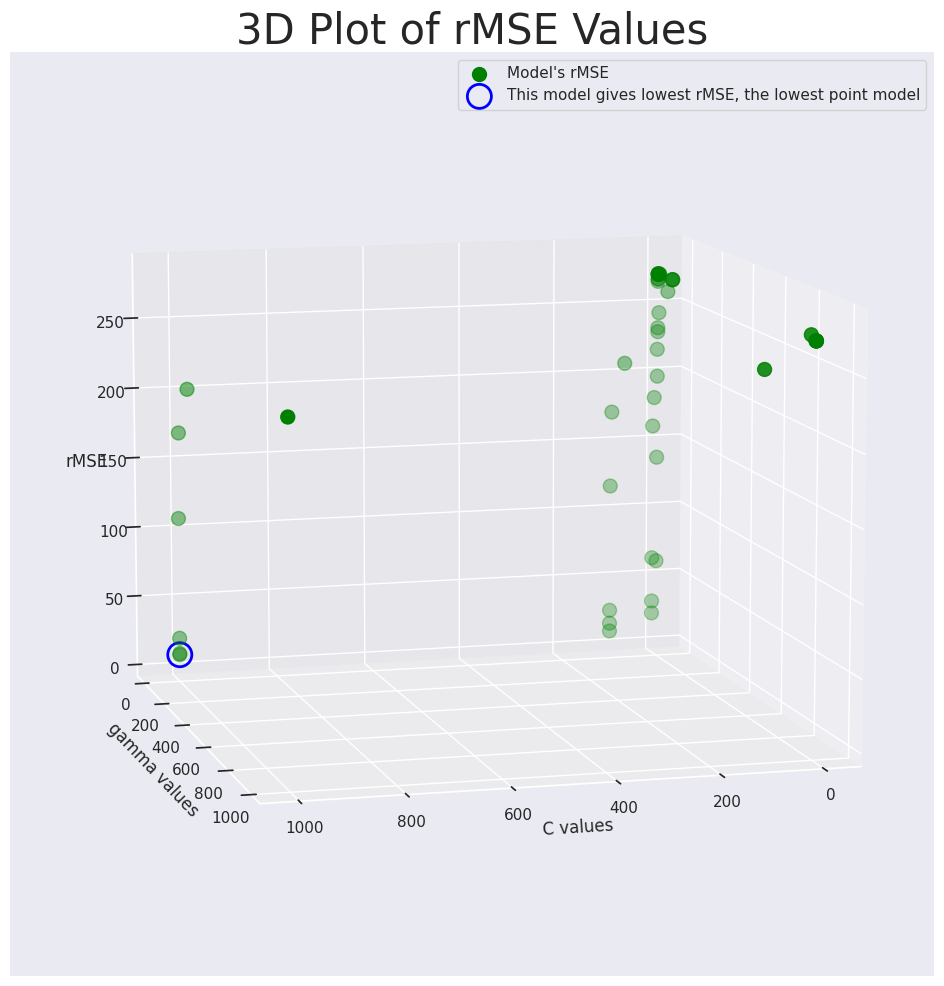

In [ ]:
# now we can plot!



fig = plt.figure(figsize = (20,12)) # width = 20, height = 12

ax = plt.axes(projection = "3d")

ax.scatter(C_coords, gamma_coords, rMSE_list,
           color = "green", label = "Model's rMSE", s = 100)


# Make one circle in point with lowest rMSE!
ax.scatter(optimal_svr_model.C, optimal_svr_model.gamma,
            best_svr_rMSE, facecolors="none", s = 300,
            edgecolors="blue", linewidths=2,
            label="This model gives lowest rMSE, the lowest point model")

ax.set_title("3D Plot of rMSE Values", fontsize = 30)
ax.set_xlabel("C values")
ax.set_ylabel("gamma values")
ax.set_zlabel("rMSE")

ax.view_init(10,75)

ax.legend();

Recall that the rMSE of the tuned SVR model is:



In [ ]:
best_svr_rMSE = round(rMSE_list[lowest_index],3) # we want lowest rMSE
print("The optimal SVR model has a rMSE of:", best_svr_rMSE)


The optimal SVR model has a rMSE of: 10.899


### Conclusion for SVR


SVR gave a lower rMSE than regular Linear Regression. This is surprising since the most simplist ML model is already performing better than some advanced ML models.


What if we used tree based models such as Random Forest and XGBoost? Let's start with Random Forest.


---

## Regression Model 5: Random Forest


* Overall, the explanation is similar to classification Random Forests, but there are different explanations for regression Random Forests.

* In many situations, psychology tells us that a group decision is better than a single person's decision. The group is the Random Forest, and the single person is a Decision Tree. This is the intuition of Random Forest, multiple trees tend to give better results than single trees.

* The regression Random Forest model's prediction is actually simple. We use many decision trees, and each tree outputs a number. We take all the numbers and take the mean.

* For example, let's say we want to predict how much a house will cost. We observe the first house and its characteristics. Let's say that we make a Random Forest with 3 trees. Maybe tree 1 predicts the house to be 201k, then tree 2 predicts 210k, and tree 3 predicts 195k.
Next, the Random Forest takes the mean of these trees:

$$\widehat y_1 = \frac{\widehat y_{tree_1} + \widehat y_{tree_2} + \widehat y_{tree_3}}{3} = \frac{201k + 210k + 195k}{3} = 202k$$

This Random Forest predicts the first house cost as 202k!

Repeat this process for observations/houses 2,...,n!

* We usually use 100 to 500 trees in Random Forests, but I used 3 trees as a example so calculation is easier to understand!

* Regression Random Forests easily benefit from multiple trees. This is because a single regression tree could be biased AKA the prediction is far off target from the actual value. But if average big and small predictions with some moderate ones, we would get a more accurate prediction. Statistically, this is because the variance gets lower due to more sample sizes:

$$var(\bar y) = \frac{\sigma^2}{n}$$

The reduction in variance will most likely cause the rMSE to be lower as well.


* For a more in-depth explenation of decision trees and random forests, please reference my Pokemon MEGA Project.


In [ ]:
from sklearn.ensemble import RandomForestRegressor


rf_model = RandomForestRegressor(n_estimators = 500,
                                 min_samples_split = 10,
                                 min_samples_leaf = 5,
                                 max_features = "sqrt")

rf_model.fit(X_train,y_train)

y_preds = rf_model.predict(X_test)

results_df = pd.DataFrame({"Actual values": y_test,
                           "Predicted values":y_preds})
results_df


,Actual values,Predicted values
244,379.28,423.459407
243,410.44,405.242849
242,411.05,424.273732
241,394.36,423.945954
240,394.94,421.286286
...,...,...
4,467.26,427.193242
3,483.37,427.646379
2,481.20,428.027877
1,488.73,428.862430


In [ ]:
from sklearn.ensemble import RandomForestRegressor


# What each parameter does:

# n_estimators = 500 -> number of trees, 500 trees in this case

# oob_score=True -> gives out-of-bag error,
# dont need this unless we need in-depth analysis

# max_depth = 3 -> 3 is the max layers of a tree
# max_depth = None -> Tree has no limit of layers

# min_samples_split = 2 -> needs at least 2 observations in a node for a split
# a split makes a branch, no split means no branch is made

# min_samples_leaf = 1 -> a leaf needs at least 1 stock price.
# The leaf is the end part of a tree, where we get our predictions

# max_features = "sqrt" -> each tree only uses the square root amount of the
# total predictors. Here, we got 4 predictors, so sqrt(4) = 2,
# each tree uses 2 predictors, and these 2 predictors are selected at random
# ALERT: we usually USE this since we want to make each tree totally different!

# bootstrap = True by default, don't need to specify this!

# random_state = 1 -> set.seed(1) in R, always make the same tree

# all these parameters above can reduce overfitting and hopefully gives less error
# BUT random_state does NOT contribute to reducing overfitting


# ALERT: Random Forest learns more whern we have tiny constraints!
# Having min samples per leaf as 1, only 2 observations needed for a split
# and having a max depth of None let the trees grow freely!!!

#

rf_model = RandomForestRegressor(n_estimators = 500,
                                  max_depth = None,
                                  min_samples_split = 2,
                                  min_samples_leaf = 1,
                                  max_features = "sqrt",
                                  random_state = 1)

rf_model.fit(X_train,y_train)

y_preds = rf_model.predict(X_test)

results_df = pd.DataFrame({"Actual values": y_test, "Predicted values": y_preds})
results_df


,Actual values,Predicted values
244,379.28,422.235762
243,410.44,399.804675
242,411.05,418.831485
241,394.36,419.487591
240,394.94,416.527216
...,...,...
4,467.26,433.745238
3,483.37,435.647625
2,481.20,434.962951
1,488.73,434.992938


Random Forest does not seem to have accurate predictions.

In [ ]:
rf_rMSE = round(root_mean_squared_error(y_test,y_preds),3)

print("Random Forest's rMSE number:", rf_rMSE)

rMSE_check(rf_rMSE)


Random Forest's rMSE number: 15.437
Model's rMSE is great.


### Conclusion for Random Forest

Linear Regression still has a lower rMSE of 7.358.


---

## Regression Model 6: XGBoost

* XGBoost stands for Extreme Gradient Boosting. For regression, it sums the baseline number and predictions from multiple trees to  produce one number. Thats it!

* Here is an intuition of XGBoost: Let us imagine an archer who is trying to shoot the bullseye. The archer already has some experience with shooting arrows, but he is not an expert. He shoots his first arrow, and it goes way left of the bullseye. He then tries to adjust his second arrow so that hits more to the right, but it still does not hit the bullseye.

He keeps shooting arrows, keeps learning from his mistakes, and keeps noting the distance from his arrow mark to the bullseye.

At his 500th arrow, he shoots the arrow and it finally hits the bullseye! Now, the arrow is not at the middle of the bullseye, but hitting any part of the bullseye is a big feat!

This is XGBoost. This model tries to give "bullseye" predictions.

Here each "arrow" is a tree. Each tree tries to learn the errors of the previous tree. The goal is to minimize the error distance between the prediction and the true value. Usually, the prediction won't exactly be the true value, but it can be really close.


* Random Forest is a parallel approach since it uses independent trees. When training  the trees, they are made randomly due to the bootstrap process.

* XGBoost is a sequential approach. The trees are trained by each tree predicting then learning: We start with a baseline value. Next, tree 1 predicts a residual, then tree 2 learns from tree 1 and the baseline value, and tree 2 gives its own residual. Next, tree 3 learns from tree 2, tree 1, and the residual, and tree 3 gives its own predicition. Repeat this for M trees. Combine all tree values plus the baseline value to get our final prediction for observation. Repeat for observarions 2 to n.    


---

### Regression XGBoost Notation and Formula:

To understand the process of XGBoost, here is the mathematical formula of XGBoost:

$$\widehat y_M(\vec x) = \widehat f_0 + \eta \widehat f_1(\vec x) + \eta \widehat f_2(\vec x) + ... \eta \widehat f_M(\vec x)$$

Where:

* $\vec x$ is the vector of predictors for a certain observation. We plug in those predictors for each tree.


* $\widehat f_0$ is the baseline prediction. For regression, it is usually the mean of the response variable $y$ which is $\bar y$.

* $\widehat f_m(\vec x)$ is the prediction from the m-th tree. The m-th tree has learned information of it's previous trees.

EX: $\widehat f_2(\vec x)$ is the prediction of tree 2.

Be careful, $\widehat y_2$ is the prediction of the baseline plus tree 1 with learning rate, and tree 2 with learning rate.

* $\eta$ is the learning rate. It is basically the multiplier of each tree's contribution.

We usually use small learning rates  such as 0.01 to 0.30. Each tree makes a small correction. This is a more stable approach but requires more trees such as 300 to 1000.

Big learning rates  such as 0.30 or higher carry some risk. Each tree makes a bigger corrections, but overfitting can happen and the predictions may over estimate.



* $M$ is the total number of trees.

* $\widehat y_M(x)$ is the final prediction after all trees.

Just to be clear, for regression XGBoost, the baseline value is usually the biggest number, then tree 1's predicted number is significantly small, and Tree M has the smallest number. We add up those numbers from baseline to tree M.

Lets use some pretend numbers as a example: $\widehat y_M = 190k + 1k + 0.9k + ... + 0.01k = 201.71k$




In [ ]:
from xgboost import XGBRegressor

# XGBoost parameters:

# 1. objective = "reg:squarederror" -> use MSE
# this is the default, so no need to mention this!

# 2. n_estimators -> amount of trees to use, called boosting rounds for XGBoost
# n_estimators = 500 trees

# 3. learning_rate (eta) -> how much each tree learns from previous tree
# learning_rate = 0.05 -> eta = 0.05

# 4. max_depth -> how complex each tree is. depth = 1 -> 2 branches.
# depth = 2 -> at most 4 branches, depth = 3 -> at most 8 branches
# max_depth = None -> "NOT SAFE FOR XGBOOST, do 6 inside!"

# 5. subsample -> fraction of training rows used for each tree, prevents overfitting
# subsample = 0.8 -> only use 80% of training data for each tree
# subsample = 1.0 -> use 100%, use all the training data for each tree


# 6. colsample_bytree -> fraction of total predictors to use for each tree
# similar to max_features in random forest
# colsample_bytree = 0.7 -> use 70% of predictors,
# colsample_bytree = 1.0 -> use all

# 7. gamma -> gamma = 0 makes big complex trees, gamma = 5 makes small simple trees
# We may need complex trees to predict well, so do gamma = 1

# 8. min_child_weight -> number of samples or weights needed to make a split.
# similar to min_sample_split in random forest, BUT if we use weights, can be different
# min_child_weight = 5 -> need at least 5 pokemon to make a split
# for instance, if we give a legendary a weight of 5, and regular pokemon a weight of 1,
# 2 legendary pokemon and 5 regular pokemon -> (2*5) + 5 = 15 as weight.

# 9. random_state = 1 -> set the seed as 1, this makes results reproducible.
# think of this as a minecraft seed, the same minecraft seed always gives a same world!



# xgboost model:

xgboost_model = XGBRegressor(n_estimators = 500,
                          learning_rate = 0.05, # eta
                          max_depth = 6,
                          subsample = 1.0,
                          colsample_bytree = 1.0,
                          gamma = 1,
                          min_child_weight = 2,
                          random_state = 1
                          )

xgboost_model.fit(X_train,y_train)

y_preds = xgboost_model.predict(X_test)

results_df = pd.DataFrame({"Actual values": y_test, "Predicted values": y_preds})
results_df

,Actual values,Predicted values
244,379.28,403.949768
243,410.44,365.831268
242,411.05,401.230469
241,394.36,401.920074
240,394.94,375.049927
...,...,...
4,467.26,432.019104
3,483.37,442.039886
2,481.20,440.482086
1,488.73,441.537872


* We are defintely noticing a pattern. Both random forest and XGBoost are not predicting well as Linear Regression.

* Perhaps the reason for this is because most of the predictors have a linear relationship.

In [ ]:
xgboost_rMSE = round(root_mean_squared_error(y_test,y_preds),3)

print("XGBoost's rMSE number:", xgboost_rMSE)

rMSE_check(xgboost_rMSE)


XGBoost's rMSE number: 16.313
Model's rMSE is great.


### Conclusion for XGBoost

* Again, Linear Regression is still the king of the least error with a rMSE number of 7.358.

* It is true that tree based models such as random forests and XGBoost do well in non-linear data or linear data.

* But perhaps Linear Regression does extremely well with linear data.


---

## Regression Model 7: Neural Network

* Neural Networks are a machine learning model  inspired by our brain neurons. Brain neurons are connected with other neurons. Similarly, Neural Networks use artificial neurons (often symbolized as circles) that are connected with other neurons using lines.

**Neural Networks have three parts:**

* Part 1: Input Layer

The amount of neurons in the first layer equal the number of predictors. If our training set has 2000 observations, we feed those observations in the Input Layer.


* Part 2: The Hidden Layers

These are the middle layers of the neural network. We can have 1 hidden layer or multiple hidden layers.

The hidden layer involves 4 steps:

1. The hidden layers have neurons that are a linear combination of weights and the variables in the input layer PLUS a bias number (b).

So each hidden layer node has the linear combination: $z = w_1 x_1 + w_2 x_2 + ... w_p x_p + b$.

Where:

$b$ is the bias number.

$x_k$ is a predictor variable.

$w_k$ is the weight number.

$z$ is the linear combination of $w_k$, $x_k$, and $b$.


2. We usually make the neural network use an activation function. A activation function simply converts our linear combination number of $z$ into a different number.

For the middle layer, we usually use the ReLU activation:

$$f(z) = ReLU(z) = max(0,z)$$

If $z$ is negative, it becomes a value 0. If $z$ is positive, the value remains as $z$.  

3. If the model detects that the weights are bad at predicting, we assign new weights. $w_1^*,w_2^*,...w_p^*$.


4. If there are additional hidden layers, repeat step 1 to 3. If there are no additional hidden layers, then go to the output layer.


* Part 3- The Output Layer:


This is the last layer. Here we use a final activation function on $z$, which is $f(z)$. $f(z)$  depends on if we do regression or classification. The final numbers from the output layer will be our predicted numbers or classes.

In my case, we are doing regression , so my activation function is the linear function:

$$f(z) = z$$

This activation function looks so simple. You might think its a typo, but it is NOT a typo!!!

The value of $z$ is already a continuous number. Recall that $z = w_1 x_1 + w_2 x_2 + ... w_p x_p + b$.  So in a way, $z$ acts as linear regression.

So since $z$ was already a continuous number from the start, we do NOT have to do anything else to it!  

---


* I will make a Neural Network with a Input Layer of 10 neurons (since there are 10 predictors), three Hidden Layers (each with 12 neurons), and one Output Layer (only has 1 neuron since we will only have one value in regression).

* For more information of Neural Networks, please refer to my Pokemon MEGA Project.

In [ ]:
# scaling is important for neural network, it can be affected by the input scale

scaler_function = StandardScaler()

scaler_train = scaler_function.fit(X_train)
# Make the training data learn, NOT the testing data!

X_train_scaled = scaler_train.transform(X_train)

X_test_scaled = scaler_train.transform(X_test)

#print(X_train_scaled)
#print(X_test_scaled)



# NOTE: I have tried a version where I fitted the model with regular X_train
# and predicted with regular X_test

# The predictions reached 6000's instead of 300's and 400's!

# SCALING IS IMPORTANT!!!


Lets actually code the neural network!

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense


# 1. set seeds
import random

random.seed(1)
np.random.default_rng(1)
tf.random.set_seed(1)



In [ ]:
num_cols = len(X_train.columns)

print("The number of predictor variables in X_train:",num_cols)

The number of predictor variables in X_train: 10


In [ ]:

# 2. make the neural network model

nn_model = Sequential([

    # this is BOTH the input layer with 4 predictors/neurons and
    # the 1st hidden layer with 3 neurons and relu!
    Dense(12, input_dim = num_cols, activation = "relu"),

    # 2nd hidden layer with 3 neurons
    Dense(12, activation = "relu"),  # do NOT forget your commas!


    # 3rd hidden layer with 3 neurons
    Dense(12, activation = "relu"),

    # output layer:
    Dense(1, activation = "linear")

])


# 3. specify the error/loss metric and optimizer

nn_model.compile(loss = "mse", optimizer = "adam",
                   metrics = ["mse"])



In [ ]:
# 4. fit the model:
# epochs = 100 -> the data set goes through the neural network model 100 times
# batch_size = 32, amount of observations that goes through neural network
# until the weights get updated

nn_model.fit(X_train_scaled, y_train, epochs = 100, batch_size = 32,
              verbose = 1)





Epoch 1/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 29276.8594 - mse: 29276.8594
Epoch 2/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 28063.4492 - mse: 28063.4492
Epoch 3/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 20663.7422 - mse: 20663.7422
Epoch 4/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5985.3125 - mse: 5985.3125  
Epoch 5/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1602.8616 - mse: 1602.8616
Epoch 6/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1175.4414 - mse: 1175.4414
Epoch 7/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 831.6989 - mse: 831.6989
Epoch 8/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 589.4188 - mse: 589.4188
Epoch 9/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 409.8380 - mse: 409.8380
Epoch 10/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 301.6328 - mse: 301.6328
Epoch 11/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228.8811 - mse: 228.8811
Epoch 12/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - 

In [ ]:
y_preds = nn_model.predict(X_test_scaled)

y_preds = y_preds.ravel() # make the multi-dim array into a 1D array


results_df = pd.DataFrame({"Actual values": y_test, "Predicted values": y_preds})
results_df

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


,Actual values,Predicted values
244,379.28,381.320801
243,410.44,396.049744
242,411.05,406.120789
241,394.36,404.296417
240,394.94,397.610352
...,...,...
4,467.26,471.245209
3,483.37,471.602875
2,481.20,476.401611
1,488.73,485.616974


In [ ]:
nn_rMSE = round(root_mean_squared_error(y_test,y_preds),3)

print("Neural Network's rMSE number:", nn_rMSE)

rMSE_check(nn_rMSE)


Neural Network's rMSE number: 9.083
MOdel's rMSE is fantastic!


### Conclusion for Neural Network

Neural Network defintely had a low rMSE of 8.984.

But Linear Regression still beats it with a rMSE of 7.358, so it appears that regular Linear Regression is the best model.



---

# 🏆 Table of Regression models' rMSE numbers

What model was the best in terms of least error?


In [ ]:
regression_table = pd.DataFrame({
    "Regression Model": ["Linear Regression",
                         "Ridge",
                         "LASSO",
                         "SVR",
                         "Random Forest",
                         "XGBoost",
                         "Neural Network"],

    "rMSE": [linear_reg_rMSE,
             ridge_rMSE,
             lasso_rMSE,
             best_svr_rMSE,
             rf_rMSE,
             xgboost_rMSE,
             nn_rMSE]

})


regression_table

,Regression Model,rMSE
0,Linear Regression,7.358
1,Ridge,7.359
2,LASSO,231.960
3,SVR,10.899
4,Random Forest,15.437
5,XGBoost,16.313
6,Neural Network,9.083


We can sort the values by smallest first:

In [ ]:
regression_table.sort_values("rMSE")

,Regression Model,rMSE
0,Linear Regression,7.358
1,Ridge,7.359
6,Neural Network,9.083
3,SVR,10.899
4,Random Forest,15.437
5,XGBoost,16.313
2,LASSO,231.960


### Table Results Summary

* When looking at the predictors, it is clear why regular Linear Regression was the best model.

* Most of the predictors from EDA were had moderate or strong linear correlations with the closing price stock. So it makes sense that Linear Regression performs well.

* Ridge had a rMSE of 7.359, while Linear Regression had a rMSE of 7.358, so this was a tight race in terms of a model having the lowest rMSE. But even if the rMSE values were tied, Linear Regression would be the best model to choose since Linear Regression is more easy to interpret.


---

# 🏆 Bar Plot of Regression models' rMSE numbers


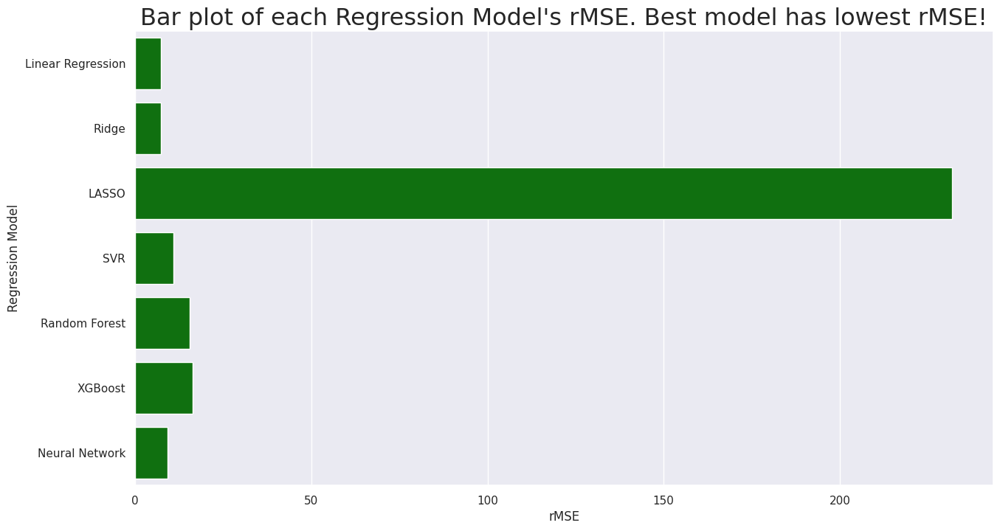

In [ ]:
plt.figure(figsize = (15,8)) # height

sns.barplot(regression_table, x = "rMSE",
            y = "Regression Model", color = "green")

plt.title("Bar plot of each Regression Model's rMSE. Best model has lowest rMSE!",
          fontsize = 23);



# 🏆 Daily Stock Price Graph with best ML estimates

* Lets make a Daily Stock Price Graph with Linear Regression predicted 2025 stock values.

* Lets run the linear regression model one more time to get the predicted values again.


* Then we will plot the 2016 to 2025 actual stock prices AND the 2025 predicted stock prices from linear regression!



In [ ]:
from sklearn.linear_model import LinearRegression

linear_reg_model = LinearRegression(fit_intercept=True)

linear_reg_model.fit(X_train,y_train)


# lets round to 2 decimal places since actual values has 2 decimal places!
y_preds = np.round(linear_reg_model.predict(X_test),2)

# y_preds

results_df = pd.DataFrame({"Actual values": y_test,
                          "Predicted values": y_preds})

results_df


,Actual values,Predicted values
244,379.28,373.30
243,410.44,398.48
242,411.05,402.49
241,394.36,399.05
240,394.94,397.19
...,...,...
4,467.26,471.42
3,483.37,478.99
2,481.20,479.60
1,488.73,489.50


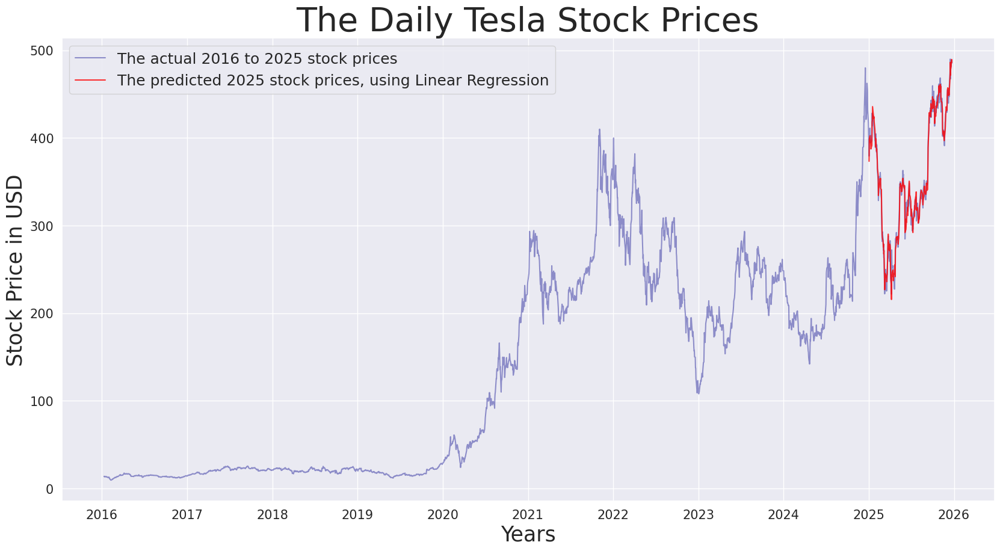

In [ ]:
fig = plt.figure(figsize = (20,10))


plt.plot(regression_df["date"], regression_df["close"], alpha = 0.4,
         c = "darkblue", label = "The actual 2016 to 2025 stock prices")

plt.plot(testing_df["date"], results_df["Predicted values"], alpha = 0.8,
         c = "red", label = "The predicted 2025 stock prices, using Linear Regression")


plt.title("The Daily Tesla Stock Prices", fontsize = 40)

plt.xlabel("Years", fontsize = 25)
plt.ylabel("Stock Price in USD", fontsize = 25)



# Make the ticks and legend have a bigger font:

plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

plt.legend(fontsize = 18);




### Why do I not see a straight line?

* You might have been expecting a straight line like $y = mx+b$ since we used a Linear Regression model.

* However, Linear Regression does NOT account for temporal order. Linear Regression first calculates its predictions based on the predictor values. Next, the graph organizes the predictions by the chronological order.





### Summary of the Graph

* Recall that Linear Regression had a  rMSE of 7.358.

* It seems like Linear Regression forecasted the daily 2025 stock prices well!

* The red line (predicted values) seems to cover the blue lines (actual values) with great accuracy.

---






## ❗❗❗ Is using ML models realistic for predicting long-term Stock Prices?



### ❗ There is one BIG problem.

* Notice that we have predictor variable values of each 2025 day! We have the predictor matrix of $X_{test,2025}$.

* However, how would we forecast the stock price days of the year 2026 and onwards? We do not have any 2026 predictor variable values for that! We do not have the predictor matrix of $X_{test, 2026}!$

* Therefore, using Machine Learning (ML) Models to predict many future daily prices such as the next years or next months is not realistic! It is not realistic to obtain $X_{test, future}$ since we currently live in the present.

* In the current time, we realistically have $X_{train, past}$  and  $X_{test,past}$.


* This project was created around December 2025, so at that time the available predictor matrices are: $X_{train,past} = X_{train,2016-2024}$ and $X_{test,past} = X_{train,2025}$  


* Realistically, ML models can predict the next day's stock price. Then we could keep training the ML models as days go on by. But this is only short term predictions.




---


## ❗ Is there a way to forecast long-term Stock Prices?

Yes! We can use Time Series models to forecast long-term stock prices!

And most time series models do NOT require future data! It will automatically forecast future stock prices.

One catch is that time series are mainly used to view general trends and seasonalities, not to predict accurate stock prices. But that is fine! most people only require future patterns to make decisions, not exact stock prices.


Lets start by learning the basics of time series.

---

# ⏳ SECTION F: Time Series Crash Course

Before we can get into fun time series models, we HAVE to understand what time series data is. We also have to understand the diagnostic tools behind it. And lastly, we have to understand some basic time series models because the fun time series models build off of each other.


**ALERT:** Do not worry if you do not understand most of the time series concept! Time series is not a easy topic to understand and will need some days for the content to marinate.



---




### Time Series data


Time Series data definition: A sequence of observations collected over time, where order matters.

The defintion can be that simple, time series data is not complicated!

The Seaborn library has a example data set of flights. It has years, months, and the number of passengers. We can turn this into a time series data. Lets view it!


---

In [ ]:
flights_df = sns.load_dataset("flights")

flights_df



,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121
...,...,...,...
139,1960,Aug,606
140,1960,Sep,508
141,1960,Oct,461
142,1960,Nov,390


In [ ]:
flights_df.dtypes


,0
year,int64
month,category
passengers,int64


We will need this to create a date variable that contains year and month.



In [ ]:
# create a string and then convert it to a datetime variable type

# year is a intger type, we need to convert it to string
# month is category type, we need to convert it to a string

flights_df["date"] = pd.to_datetime(flights_df["year"].astype(str) + "-" +
                                    flights_df["month"].astype(str) + "-01")


flights_df["date"]

,date
0,1949-01-01
1,1949-02-01
2,1949-03-01
3,1949-04-01
4,1949-05-01
...,...
139,1960-08-01
140,1960-09-01
141,1960-10-01
142,1960-11-01


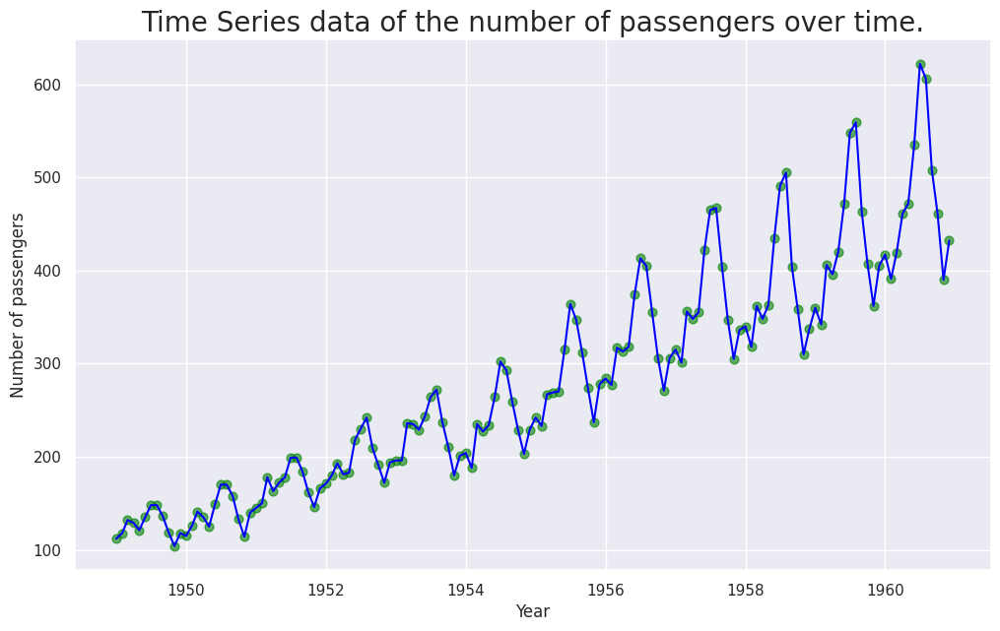

In [ ]:
fig = plt.figure(figsize = (12,7))


plt.scatter(flights_df["date"], flights_df["passengers"], alpha = 0.6,
            s = 40, color = "green")

plt.plot(flights_df["date"], flights_df["passengers"], color = "blue")



plt.title("Time Series data of the number of passengers over time.",
          fontsize = 20)

plt.xlabel("Year")
plt.ylabel("Number of passengers");


* This passenger data seems to show that as time goes on, we have more passengers who ride a airplane.

* Furthermore, there seems to be some seasonality going on. It appears that the winter months have the least amount of passengers while the summer months have the most amount of passengers for each year.

---



## Random Variables (RV) Case Study

Before we talk about the most basic time series, lets review what a random variable is.

The definition of a random variable (RV): A variable that has a random value. The value is not a fixed constant.

* This is a example of a variable that is NOT a RV:

$$x + 2 = 5$$

In this case, $x = 3$ always. Notice $x$ is lower case here too. Lower case letters represent realized values.

* Example of a RV:

$$X \sim Unif(0,1)$$

Here, X can be any decimal value from 0 to 1 since it comes from a uniform distribution from 0 to 1. Notice that $X$ is capital here, we usually denote capital letters as a RV.

RVs apply in the real world as well! Lets say that someone tries to measure a random person's height in the United States. That person would not always be 65 inches. We could have a person with a height of 62.7 inches, 74.91 inches, and so on.

Lets pretend the people's heights are normally distributed with a population mean of 67 inches, and a population variance of 10 inches. A normal distribution is a reasonable assumption since people's heights are continous and can have decimal values, and a LOT of people live in the United States! The variable of a selected person's height is random and could be anything from this normal distribution!

The notation is:

$$X_i \sim N(\mu = 67, \sigma^2 = 10)$$

Where $X_i$ is the RV for the i-th person!

Therefore, in $e_i \sim N(0,\sigma^2)$, the residuals ($e_i$) are RVs since they can have a random value from the Normal distribution.

* This explenation came from my Pokemon MEGA project.

---

### White Noise

White noise is the most basic time series. It is often used as a building block in time series modeling.

* It is denoted by:

$$w_t \sim wn(0,\sigma^2)$$

* Usually, we use a iid Normal distribution to model white noise time series.

* iid = independent and identically distributed. This means each observation is independent and follows the same distribution as the other observations.

$$w_t \sim^{iid} N(0,\sigma^2)$$


* White Noise time series represent a time series where each observation is NOT correlated with other observations. In other words, knowing past values will NOT give you information of future values.


* Notice that $t$ is a observation index.


---


* Lets show a example white noise times series below:

In [ ]:
# simulate white noise of N(0,9) using numpy:


white_noise_data = np.random.normal(loc = 0, # the mean is 0
                 scale = 3, # the standard deviation is 3, thus the variance is 3^2 = 9
                 size = 500 # the number of observations
                 )

white_noise_data[0:10] # First 10 white noise observations



array([ 2.26444714, -2.18882446,  1.85563251,  3.24702534,  2.29215159,
       -0.81244773,  2.44570759,  0.01749758,  3.89202204,  4.53415643])

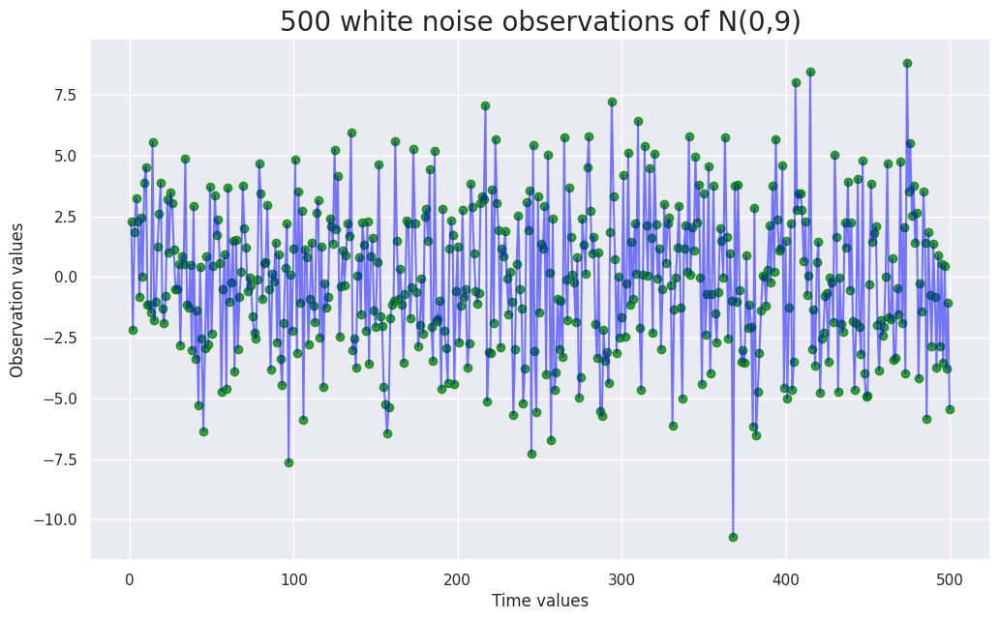

In [ ]:

fig = plt.figure(figsize = (12,7))

plt.scatter(range(1,501,1), white_noise_data, alpha = 0.75, color = "green")
plt.plot(range(1,501,1), white_noise_data, alpha = 0.5, color = "blue")

plt.title("500 white noise observations of N(0,9)", fontsize = 20)
plt.xlabel("Time values")
plt.ylabel("Observation values");



Notice that the mean value (the center) is around 0 and the variance (the spread) is relatively constant.



---

### Stationarity vs Non-Stationarity

There are two types of time series data.


* Stationarity:

A time series is stationary if it has three traits.

**Firstly**, the time series has a constant mean for all $t$. There is no upwards or downwards trend.

Here is the notation:

$$\mu_t = E(x_t) = \mu$$


**Secondly**, the time series has a constant variance for all $t$. There is no increasing or decreasing spread.

Here is the notation:

$$Var(x_t) = \sigma^2$$


**Thirdly**, the Auto-Correlation Function (ACF) decays rapidly. We will talk more about ACF soon. ACF basically measures the linear relationship between the two observations.

Mathematically, $\rho(s,t)$ depends on $s$ and $t$ only through the difference of $|s-t|$.


**Basically**, if a time series data looks like white noise, it is most likely a stationary times series!

* Non-Stationarity:

Any time series that has a trend or a ACF that does not rapidly decay.

We usually have Non-Stationary time series such as stock prices. There are two ways to deal with this-

First option, we use a time series model that can transform the Non-Stationary time series data into a Stationary time series.

Second option, we can de-trend and de-seasonalize the data, then apply a ARMA model. (We will talk about a ARMA model soon.)

---

### Trends


* A trend is a long term increase or decrease in the time series data.


Examples of trends over time:
* A country's GDP increases over time due to wise economic decisions.

* The number of 3 point shots made increases in the NBA.


Trends can be modeled with linear or polynomial regression.

Here are some examples:

Linear Regression:

$x_t = \beta_0 + \beta_1 t + w_t$

* $\beta_0$ is the intercept value
* $\beta_1$ is the slope value  
* $w_t$ represents white noise


Polynomial Regression (3rd degree):

$x_t = \beta_0 + \beta_1 t + \beta_2 t^2 + \beta_3 t^3 + w_t$


* Higher-degree terms ($t^2$, $t^3$, etc.) allow the trend to curve.


---




### Seasonality


* Seasonality Defintion: is any cylical pattern for any time period $d$.

$d$ usually represents the 12 months of a year. But we could make $d$ represent 4 financial quarters or 365 days.

Many time series data are affected by seasons such as winter or summer seasons. A ski shop would sell a significant amount of merchandise in the winter, but may not gain much revenue in the summer.

* A solid way to estimate seasonal effects is the seasonal means method. It has two steps:

**Step 1-** First, estimate the sample means $\bar s_j$ for the j-th month average.

**Step 2-** Second, estimate the departure of each monthly means with the overall means.

$$\hat s_j = \bar s_j - \bar x$$

* $\hat s_j$ is the seasonal effect for month $j$.

* $\bar s_j$ is the monthly mean for month $j$.

* $\bar x$ is the overall average of the WHOLE data.

Finding the seasonal effect helps us "de-seasonalize" the data.

---


### Differencing

* Differencing Defintion: Take a non-stationary time series $x_t$ and subtract by it by its previous value $x_{t-1}$ to get a stationary time series $y_t$.



Differencing is one way we can remove trends and seasonality.


* Here is a example differencing to get rid of a linear trend:

$$y_t = \nabla x_t = x_t - x_{t-1}$$

Here, $\nabla$ represents the differencing operator.

* Here is a example differencing to get rid of a seasonality and a possible linear trend:


$$y_t = \nabla_d x_t = x_t - x_{t-d}$$

Here, $\nabla_d$ represents the seasonal difference.

* Here is a example differencing to get rid of a seasonality and a  quadratic trend:

$$y_t = \nabla \nabla_d x_t = (x_t - x_{t-d}) - (x_{t-d} - x_{t-d-1})$$


**The Backshift Operator:**

$$B x_t = x_{t-1}$$

We use $B$ as a way to show a shift.

Here is a backshift for one value:

$$\nabla x_t = (1-B)x_t = x_t - B x_t = x_t - x_{t-1}$$

Here is a backshift for a seasonal value:

$$\nabla_d x_t = (1-B^d)x_t = x_t - B^d x_t = x_t - x_{t-d}$$


Differencing will be important for SARIMA and ARIMA models.


---


### Auto Correlation Function (ACF)


* As a note, the Auto Covariance Function (ACVF), finds the raw co-variance values of a time series. But we do not need to find ACVF values to get the ACF values. For simplicity, lets focus on ACF.

**The ACF formula is:**

$$\rho (t,t+h) = \frac{cov(x_t, x_{t+h})}{\sqrt{var(x_t) * var(x_{t+h})}}$$


Where:

* $h$ is a lag. A lag is the number of time steps that you shift a time series.

* Examples:

Lets assume we have a daily time series.

$h = 0:$ compare today with today.

$h = 1:$ compare today with yesterday.

$h = 2:$ compare today with two days ago.




**The simplified ACF formula is:**

$$\rho (h) = \frac{\gamma(h)}{\gamma(0)}$$

Where:

* $\gamma(h)$ is the auto-covariance function at lag $h$: $cov(x_t, x_{t+h})$

* $\gamma(0)$ is variance at lag $0$: $var(x_t)$




* The ACF of white noise looks like:

$$\rho(h) =
 \begin{cases}
 1, & \text{if } h = 0 \\
 0, & \text{if } h \ne 0 \\
 \end{cases}$$

If we compare $w_t$ with $w_t$, then the auto correlation value will be $\rho(0) = 1$ since they are the exact same value.

Remember that a white noise observation is uncorrelated with the previous or future white noise observations. So $w_t$ and $w_{t-1}$ will be uncorrelated with each other.


---





### Partial Auto Correlation Function (PACF)

* Partial Auto Correlation (PACF) has "partial" in it's name because it tries to find the correlation of $x_t$ and $x_{t+h}$ without the predictors $x_{t+1}, x_{t+2},..., x_{t+h-1}$.

* We can find this by subtracting $x_t$ and $x_{t+h}$ by its estimators $\hat x_t$ and $\hat x_{t+h}$. These estimators contain  the predictors $x_{t+1}, x_{t+2},..., x_{t+h-1}$.


* The PACF formula is:

$$\alpha(h) = corr(x_{t+h} - \hat x_{t+h}, x_t - \hat x_t)$$




* ACF and PACF will help us figure out if a time series has any AR(p), MA(q), components. Lets jump into the AR time series!




---




### AutoRegressive (AR) [Time Series Model]

The AutoRegressive model of order p, AR(p) is:

$$x_t = \phi_1 x_{t-1} + \phi_2 x_{t-2} + ... + \phi_p x_{t-p} + w_t$$

In a AR model, the current value of the series $x_t$ depends on past values such as $x_{t-1}$, $x_{t-2}$, and $x_{t-p}$.

AR models have a ACF that tails off over time and a PACF that cuts off at lag p.



Here is an example of a AR(2) model:

$$x_t = 0.7 x_{t-1} - 0.3 x_{t-2} + w_t$$

Where:

* $\phi_1 = 0.7$ and $\phi_2 = -0.3$




---


### Moving Average (MA) [Time Series Model]

The Moving Average model of order q, MA(q) is:

$$x_t = w_t + \theta_1 w_{t-1} + \theta_2 w_{t-2} + ... + \theta_q w_{t-q}$$

In an MA model, the current value of the series $x_t$ depends on past errors such as $w_{t-1}$, $w_{t-2}$, and $w_{t-q}$.


MA models have a ACF cuts off at lag q and a PACF that tails off over time.

Here is an example of a MA(1) model:


$$x_t = w_t + 0.5 w_{t-1}$$


Where:

* $\theta_1 = 0.5$



---


### AutoRegressive Moving Average (ARMA) [Time Series Model]

A time series is a ARMA(p,q) process if it is stationary and satisfies:

$$x_t = \phi_1 x_{t-1} + ... + \phi_p x_{t-p} + w_t + \theta_1 w_{t-1} + ... + \theta_q w_{t-q}$$

Where:

* $p:$ AR order

* $\phi:$ AR parameters

* $q:$ MA order

* $\theta:$ MA parameters


An ARMA(p,q) model simply contains both AR(p) and MA(q) processes.

Here is a example of a ARMA(1,1) model:

$$x_t = 0.9 x_{t-1} + w_t - 0.8 w_{t-1}$$

Where:

* $\phi_1 = 0.9$ (AR part)

* $\theta_1 = -0.8$ (MA part)



**NOTE:** For AR, MA, and ARMA models, we must first de-trend and de-seasonalize the time series data first, Then we can apply a ARMA model!





---


###  AutoRegressive Integrated Moving Average (ARIMA)  [Time Series Model]

An ARIMA model is a extension of a ARMA model.

The "I" part in ARIMA simply uses differenceing so that it de-trends the time series data.


A ARIMA(p,d,q) process is written as:

$$\phi(B)(1-B)^d x_t = \theta(B) w_t$$

Where:

* $\phi(B) = 1 - \phi_1 B -  \phi_2 B^2 - ... - \phi_p B^p$ $\Rightarrow$ AR part

* $\theta(B) = 1 + \theta_1 B +  \theta_2 B^2 + ... + \theta_q B^q$ $\Rightarrow$ MA part

* $(1-B)^d$ $\Rightarrow$ Differencing operator, removes the trend.

* $w_t$ $\Rightarrow$ The error, the white noise.


Here is a example of a ARIMA(1,1,1) model:

$$(1-0.6B)(1-B)^1 x_t = (1 + 0.2B) w_t$$

$$(1- 1.6 B + 0.6B^2) x_t = (1 + 0.2B) w_t$$

(Recall that $B x_t = x_{t-1}$, and $B^2 x_{t-1} = x_{t-2}$)

$$x_t - 1.6 x_{t-1} + 0.6 x_{t-2} = w_t + 0.2 w_{t-1}$$

Where:

* $\phi_1 = 0.6$ (AR part)

* $\theta_1 = 0.2$ (MA part)

* $d=1$ (The first differencing)

* The $-1.6$ is the effect of the AR part and the differencing result

---


###  Seasonal AutoRegressive Integrated Moving Average (SARIMA)  [Time Series Model]

A SARIMA model is an extension of an ARIMA model.

The "S" part in SARIMA models seasonal patterns in the time series data.

SARIMA is modeled as: ARIMA(p,d,q) $\times$ (P,D,Q)

A ARIMA(p,d,q) $\times$ (P,D,Q) process is written as:

$$\phi(B) \Phi(B^{12})  (1-B)^d (1-B^s)^D x_t = \theta(B) \Theta(B^{12}) w_t$$  

Where:

* $\Phi(B^{12}) = 1 - \Phi_1 B^{12} -  \Phi_2 B^{24} - ... - \Phi_P B^{P*12}$ $\Rightarrow$ AR part

* $\Theta(B^{12}) = 1 + \Theta_1 B^{12} +  \Theta_2 B^{24} + ... + \Theta_Q B^{Q*12}$ $\Rightarrow$ MA part

* $(1-B^s)^D$ $\Rightarrow$ Differencing operator for seasonality. $s$ is the seasonal period (12 months), $D$ is the number of seasonal differences.

Here is a example of a ARIMA(1,1,1) $\times$ (1,1,1):

$$(1-0.6B) (1-0.25B^{12})  (1-B)^1 (1-B^{12})^1 x_t = (1 + 0.2B) (1+ 0.9B^{12}) w_t$$


Where the regular terms are:

* $\phi_1 = 0.6$ (p=1)

* $\theta_1 = 0.2$ (q=1)

* $d=1$ (The first regular differencing)

And the seasonal terms are:

* $\Phi_1 = 0.25$ (P=1)

* $\Theta_1 = 0.9$ (Q=1)

* $D = 1$ (The first seasonal difference)

* $s = 12$ (The seasonal period, in this case we do 12 months)


---


# 🕝 SECTION G: Objective 3- Time Series


Lets create a time series data set.

I will add the date, the response variable of close, and any of the significant predictors that have strong linear correlations (One time series wants these linear predictors, stay tuned!).

In [ ]:
ts_df = tesla_df[["date", "close", "previous_close", "daily_range",
                  "SMA_10", "EMA_10", "previous_volume", "rolling_std_10",
                  "rolling_max_10", "rolling_min_10", "momentum" ]]

ts_df



,date,close,previous_close,daily_range,SMA_10,EMA_10,previous_volume,rolling_std_10,rolling_max_10,rolling_min_10,momentum
2503,2016-01-11,13.8567,14.0667,0.7634,14.96415,14.703243,53585373.0,0.762065,16.0007,13.8567,-1.5146
2502,2016-01-12,13.9980,13.8567,0.5620,14.83762,14.575017,61362614.0,0.810387,16.0007,13.8567,-1.2653
2501,2016-01-13,13.3540,13.9980,0.8434,14.59175,14.353014,46185742.0,0.853514,16.0007,13.3540,-2.4587
2500,2016-01-14,13.7453,13.3540,1.1080,14.37901,14.242520,61814864.0,0.758613,16.0007,13.3540,-2.1274
2499,2016-01-15,13.6660,13.7453,0.5213,14.14554,14.137699,97358636.0,0.528400,14.8953,13.3540,-2.3347
...,...,...,...,...,...,...,...,...,...,...,...
4,2025-12-17,467.2600,489.8800,29.0799,458.40300,459.302242,107608100.0,15.247209,489.8800,439.5800,20.5200
3,2025-12-18,483.3700,467.2600,17.7400,461.28700,463.678198,106490400.0,17.053748,489.8800,439.5800,28.8400
2,2025-12-19,481.2000,483.3700,15.7700,463.90700,466.863980,95168450.0,17.968584,489.8800,439.5800,26.2000
1,2025-12-22,488.7300,481.2000,13.5000,468.82200,470.839620,103305400.0,17.284020,489.8800,445.1700,49.1500


### I coded with R before, where is the "t" variable?

Well Python has a simpler approach to modeling most Time Series (TS) models.

* For many cases, Python just needs the response variable for TS models!

* However, complex TS models may require predictor variables as well. We will do one complex TS model called SARIMAX to demonstrate this!

* We should at least have a date variable for reference. The modern TS model called Prophet requires a date variable


---

## Lets use Monthly time series data!

* Many time series perform more efficiently in monthly data. This is because months can show seasonality effects better.


* Any time series data with days can still show seasonality. After all, seasonality is mainly about patterns, not actual seasons. But it is simpler to use months for time series models if we have many observations.



In [ ]:
ts_df.dtypes

# date is still a datetime variable type, whew!

,0
date,datetime64[ns]
close,float64
previous_close,float64
daily_range,float64
SMA_10,float64
EMA_10,float64
previous_volume,float64
rolling_std_10,float64
rolling_max_10,float64
rolling_min_10,float64


Lets make the index as a the months:

In [ ]:
ts_df.set_index("date", inplace = True)



In [ ]:
ts_df

# notice the index now contains the dates.

,close,previous_close,daily_range,SMA_10,EMA_10,previous_volume,rolling_std_10,rolling_max_10,rolling_min_10,momentum
date,,,,,,,,,,
2016-01-11,13.8567,14.0667,0.7634,14.96415,14.703243,53585373.0,0.762065,16.0007,13.8567,-1.5146
2016-01-12,13.9980,13.8567,0.5620,14.83762,14.575017,61362614.0,0.810387,16.0007,13.8567,-1.2653
2016-01-13,13.3540,13.9980,0.8434,14.59175,14.353014,46185742.0,0.853514,16.0007,13.3540,-2.4587
2016-01-14,13.7453,13.3540,1.1080,14.37901,14.242520,61814864.0,0.758613,16.0007,13.3540,-2.1274
2016-01-15,13.6660,13.7453,0.5213,14.14554,14.137699,97358636.0,0.528400,14.8953,13.3540,-2.3347
...,...,...,...,...,...,...,...,...,...,...
2025-12-17,467.2600,489.8800,29.0799,458.40300,459.302242,107608100.0,15.247209,489.8800,439.5800,20.5200
2025-12-18,483.3700,467.2600,17.7400,461.28700,463.678198,106490400.0,17.053748,489.8800,439.5800,28.8400
2025-12-19,481.2000,483.3700,15.7700,463.90700,466.863980,95168450.0,17.968584,489.8800,439.5800,26.2000


In [ ]:
monthly_df = ts_df[["close", "previous_close", "daily_range",
                  "SMA_10", "EMA_10", "previous_volume", "rolling_std_10",
                  "rolling_max_10", "rolling_min_10",
                    "momentum" ]].resample("M").mean()

# explenation of code:
# resample("M") groups by months.
# .mean() -> calculate average closing price per month!
#

monthly_df



,close,previous_close,daily_range,SMA_10,EMA_10,previous_volume,rolling_std_10,rolling_max_10,rolling_min_10,momentum
date,,,,,,,,,,
2016-01-31,13.305479,13.399764,0.619143,13.916134,13.876031,6.282798e+07,0.506429,14.713721,13.177107,-1.416671
2016-02-29,11.311315,11.308885,0.770820,11.469760,11.575344,9.869837e+07,0.832624,12.667675,10.232560,-0.696645
2016-03-31,14.409818,14.295150,0.579050,13.779018,13.763789,6.761858e+07,0.573153,14.662059,12.923445,1.630950
2016-04-30,16.730605,16.695714,0.642181,16.450970,16.412028,9.845502e+07,0.463788,17.248271,15.808786,0.633971
2016-05-31,14.442257,14.497910,0.490990,14.840345,14.859979,7.542742e+07,0.589548,15.704000,14.010929,-1.023310
...,...,...,...,...,...,...,...,...,...,...
2025-08-31,331.144762,329.925714,11.506081,326.193381,326.698844,7.654708e+07,9.972900,339.922857,310.794762,7.520952
2025-09-30,395.892381,390.613810,14.490557,375.416667,376.750402,9.430427e+07,18.166897,400.941905,349.262857,45.101905
2025-10-31,441.327826,440.813043,18.923243,438.597826,437.431011,8.797031e+07,10.282942,456.178261,420.911739,6.934348


Each observation should represent a month's average closing price!


**NOTE:** For most time series model, we will only focus on the response variable "close". But for a certain time series model, we will use the other linear predictors in order to improve forecasting future stocks. Stay tuned!

---

## How does the Monthly Time Series plot look like?

So how does the monthly data look in a line plot? Lets find out!

In [ ]:
monthly_df = monthly_df.reset_index()

monthly_df


,date,close,previous_close,daily_range,SMA_10,EMA_10,previous_volume,rolling_std_10,rolling_max_10,rolling_min_10,momentum
0,2016-01-31,13.305479,13.399764,0.619143,13.916134,13.876031,6.282798e+07,0.506429,14.713721,13.177107,-1.416671
1,2016-02-29,11.311315,11.308885,0.770820,11.469760,11.575344,9.869837e+07,0.832624,12.667675,10.232560,-0.696645
2,2016-03-31,14.409818,14.295150,0.579050,13.779018,13.763789,6.761858e+07,0.573153,14.662059,12.923445,1.630950
3,2016-04-30,16.730605,16.695714,0.642181,16.450970,16.412028,9.845502e+07,0.463788,17.248271,15.808786,0.633971
4,2016-05-31,14.442257,14.497910,0.490990,14.840345,14.859979,7.542742e+07,0.589548,15.704000,14.010929,-1.023310
...,...,...,...,...,...,...,...,...,...,...,...
115,2025-08-31,331.144762,329.925714,11.506081,326.193381,326.698844,7.654708e+07,9.972900,339.922857,310.794762,7.520952
116,2025-09-30,395.892381,390.613810,14.490557,375.416667,376.750402,9.430427e+07,18.166897,400.941905,349.262857,45.101905
117,2025-10-31,441.327826,440.813043,18.923243,438.597826,437.431011,8.797031e+07,10.282942,456.178261,420.911739,6.934348
118,2025-11-30,424.543684,425.932632,19.526337,432.974000,431.680242,8.817460e+07,14.966179,456.377895,411.163684,-20.214737


---

### Lets make our response vector and predictor matrix:

* Lets make the response vector for closing price. But we need to be careful, time series is different from ML models. We will have to make a pandas series where we have a index of time.

* Then lets make the predictor matrix for the other predictors. The p



In [ ]:
# need to do monthly_df["close"].values, .values ensures it uses numeric values.


# response vector:
y = pd.Series(monthly_df["close"].values, index= monthly_df["date"])
y







,0
date,
2016-01-31,13.305479
2016-02-29,11.311315
2016-03-31,14.409818
2016-04-30,16.730605
2016-05-31,14.442257
...,...
2025-08-31,331.144762
2025-09-30,395.892381
2025-10-31,441.327826


In [ ]:
# predictor matrix:
X = monthly_df[["previous_close", "daily_range",
                  "SMA_10", "EMA_10", "previous_volume", "rolling_std_10",
                  "rolling_max_10", "rolling_min_10", "momentum" ]]

X

,previous_close,daily_range,SMA_10,EMA_10,previous_volume,rolling_std_10,rolling_max_10,rolling_min_10,momentum
0,13.399764,0.619143,13.916134,13.876031,6.282798e+07,0.506429,14.713721,13.177107,-1.416671
1,11.308885,0.770820,11.469760,11.575344,9.869837e+07,0.832624,12.667675,10.232560,-0.696645
2,14.295150,0.579050,13.779018,13.763789,6.761858e+07,0.573153,14.662059,12.923445,1.630950
3,16.695714,0.642181,16.450970,16.412028,9.845502e+07,0.463788,17.248271,15.808786,0.633971
4,14.497910,0.490990,14.840345,14.859979,7.542742e+07,0.589548,15.704000,14.010929,-1.023310
...,...,...,...,...,...,...,...,...,...
115,329.925714,11.506081,326.193381,326.698844,7.654708e+07,9.972900,339.922857,310.794762,7.520952
116,390.613810,14.490557,375.416667,376.750402,9.430427e+07,18.166897,400.941905,349.262857,45.101905
117,440.813043,18.923243,438.597826,437.431011,8.797031e+07,10.282942,456.178261,420.911739,6.934348
118,425.932632,19.526337,432.974000,431.680242,8.817460e+07,14.966179,456.377895,411.163684,-20.214737


### Making the Training set and Testing set (for demonstration)


Just like with ML models, we could make a training set and testing set.

(I will explain why I will actually not use a training test and testing set for time series model in this project.)

* $X_{train}$ = Training set predictor matrix

* $\vec y_{train}$ = Training set response vector

* $X_{test}$ = Testing set predictor matrix

* $\vec y_{test}$ = Testing set response vector





Lets make the training set the years of 2016 to 2024.

Make the testing set the year of 2025.


In [ ]:
# X_train matrix

# df.iloc[:-5] -> go all the way, but STOP at the last 5th row

# df.iloc[:-12] -> Go all the way from the start (january 2016),
# and then STOP at the last 12th row (december 2024)


X_train = X.iloc[:-12]
X_train



,previous_close,daily_range,SMA_10,EMA_10,previous_volume,rolling_std_10,rolling_max_10,rolling_min_10,momentum
0,13.399764,0.619143,13.916134,13.876031,6.282798e+07,0.506429,14.713721,13.177107,-1.416671
1,11.308885,0.770820,11.469760,11.575344,9.869837e+07,0.832624,12.667675,10.232560,-0.696645
2,14.295150,0.579050,13.779018,13.763789,6.761858e+07,0.573153,14.662059,12.923445,1.630950
3,16.695714,0.642181,16.450970,16.412028,9.845502e+07,0.463788,17.248271,15.808786,0.633971
4,14.497910,0.490990,14.840345,14.859979,7.542742e+07,0.589548,15.704000,14.010929,-1.023310
...,...,...,...,...,...,...,...,...,...
103,209.827273,9.991527,212.374409,213.057830,7.374997e+07,10.164426,228.211818,197.795455,-8.296364
104,232.784000,9.383140,225.452700,226.725872,7.969692e+07,8.736255,238.848000,213.834000,16.410500
105,239.292609,8.642091,239.114304,239.122566,8.370691e+07,12.509233,258.181739,223.611304,-1.937826
106,313.454000,16.592455,298.406800,298.466856,1.060661e+08,21.776651,331.351500,264.858500,48.214500


In [ ]:
# y_train vector

y_train = y.iloc[:-12]
y_train




,0
date,
2016-01-31,13.305479
2016-02-29,11.311315
2016-03-31,14.409818
2016-04-30,16.730605
2016-05-31,14.442257
...,...
2024-08-31,209.010909
2024-09-30,235.160000
2024-10-31,238.780435


In [ ]:
# X_test matrix

# df.iloc[-5:] -> start at the 5th last row, and then STOP at last row

# df.iloc[-12:] -> start at the 12th last row (january 2025),
# and then STOP at last row (december 2025)


X_test = X.iloc[-12:]
X_test



,previous_close,daily_range,SMA_10,EMA_10,previous_volume,rolling_std_10,rolling_max_10,rolling_min_10,momentum
108,404.981000,20.344930,411.370550,410.295876,7.519568e+07,16.269382,437.490000,386.269000,-15.164000
109,349.214211,16.911158,365.298842,363.690084,8.159270e+07,18.006306,388.551053,334.010526,-42.741579
110,257.418571,16.464852,264.823429,267.719787,1.287272e+08,21.113127,298.268095,234.548095,-32.438095
111,256.052857,20.436386,255.703095,255.716616,1.410968e+08,16.738634,281.555238,227.483333,1.099524
112,320.802857,12.479576,307.396476,307.627718,1.048390e+08,17.039835,330.937619,281.982381,41.519524
113,325.331500,17.395315,329.081150,328.138899,1.240430e+08,15.642496,350.579500,301.688000,-10.105500
114,315.415455,10.501073,316.793909,316.575396,9.767422e+07,11.005166,332.244545,298.861818,-2.508636
115,329.925714,11.506081,326.193381,326.698844,7.654708e+07,9.972900,339.922857,310.794762,7.520952
116,390.613810,14.490557,375.416667,376.750402,9.430427e+07,18.166897,400.941905,349.262857,45.101905
117,440.813043,18.923243,438.597826,437.431011,8.797031e+07,10.282942,456.178261,420.911739,6.934348


In [ ]:
# y_test vector

y_test = y.iloc[-12:]
y_test




,0
date,
2025-01-31,405.019000
2025-02-28,343.339474
2025-03-31,255.808095
2025-04-30,257.148095
2025-05-31,323.864762
2025-06-30,323.891500
2025-07-31,314.988636
2025-08-31,331.144762
2025-09-30,395.892381


## 🏆 Plot of the Monthly Tesla Stock Prices from 2016 to 2025





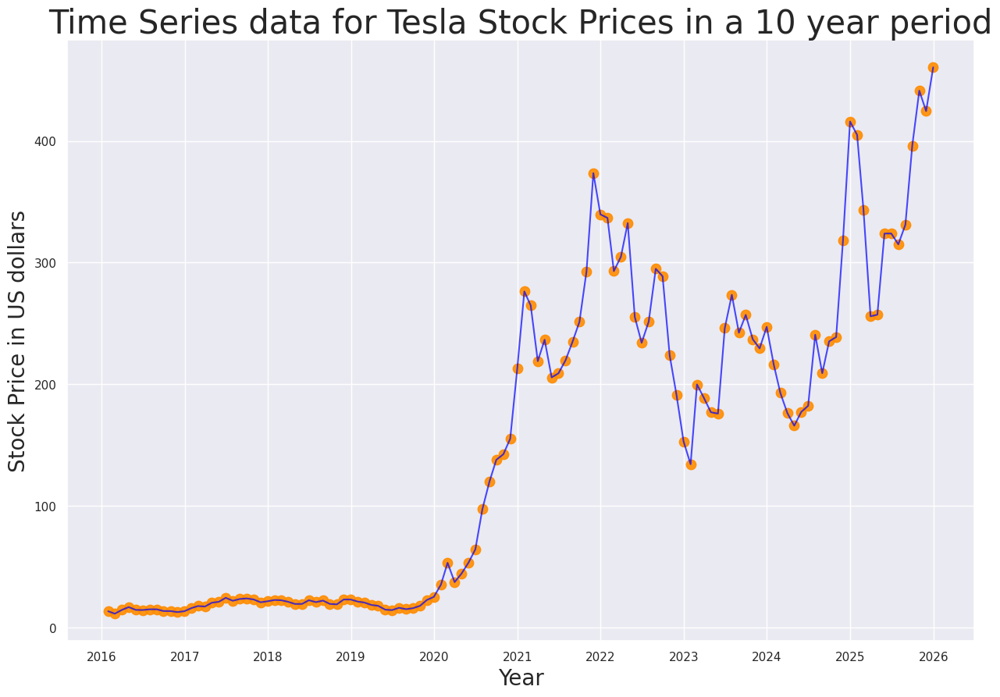

In [ ]:
fig = plt.figure(figsize = (15,10))

# scatter plot:
plt.scatter(monthly_df["date"], monthly_df["close"], alpha = 0.9,
            s = 80, color = "darkorange")

# line plot:
plt.plot(monthly_df["date"], monthly_df["close"], color = "blue", alpha = 0.7)


plt.title("Time Series data for Tesla Stock Prices in a 10 year period",
          fontsize = 30)

plt.ylabel("Stock Price in US dollars", fontsize = 20)

plt.xlabel("Year", fontsize = 20);




* Lets clarify something, this is a graph of time series DATA! We have NOT made a single model yet!!!!!


* The Tesla Stock Price data does not seem stationary. This is because there appears to be a trend and seasonality.

* After the year 2020, there seems to be a upward trend.

* During the time period of years 2020 to 2025 there also seems to be seasonality due to cylical pattern of dips and rises.

---

## 🏆 Time Series Tesla Stock Price Business Insights

Models are not necessary to gain insights! Just looking at the data can give us insights!

**Monthly Patterns:**

* January appears to have the largest spikes in stock prices.

* Spring months tend to decrease in stock prices.

* Summer to late winter months tend to increase in stock prices.


**Business Insights:**

* Based on these trends, an investor might consider buying during early spring months when prices are lower and selling during summer or late winter months when prices tend to peak.

* WARNING: Tesla stocks are highly volatile. These patterns are not guaranteed and should not be relied on as a definitive trading strategy.  

---

## ❗ Why I will NOT use a Training set and Testing set

I  ran some time series models and discovered that the training set models and the full data models can give significantly different parameters.

This is because the year of 2025 contains important seasonal patterns, and a model will need this information to make accurate forecasts.

To illustrate the difference, I will show one example of a training set SARIMA model versus the full dataset SARIMA model.


---

## Time Series Model 1: SARIMA


Recall that SARIMA is modeled as: ARIMA(p,d,q) $\times$ (P,D,Q)

An ARIMA(p,d,q) $\times$ (P,D,Q) process is written as:

$$\phi(B) \Phi(B^{12})  (1-B)^d (1-B^s)^D x_t = \theta(B) \Theta(B^{12}) w_t$$  

---
### How do we select p,d,q, and P,D,Q?

We select the model with the lowest AIC (Akaike Information Criterion). The lowest AIC model will be best model in terms of prediction.

We will use the pmdarima library to find the best model according to AIC.

* NOW, lets fit a SARIMA model with a training set, and the full data set. Spoiler Alert: They will have different parameters!



In [ ]:
import pmdarima as pm


# Training set SARIMA:

parameters = pm.auto_arima(
    y_train,
    seasonal = True,
    m = 12, # seasonal period in months
    stepwise = True,
    trace = True

)


print(parameters.summary())


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1010.675, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1010.578, Time=1.04 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1010.003, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1010.777, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1008.124, Time=0.20 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1010.052, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1010.753, Time=0.45 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1010.084, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1010.066, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1008.594, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1007.712, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1009.548, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12]     

It appears that the best training set SARIMA model is:  ARIMA(0,1,1)(0,0,0)[12]  

This model has the lowest AIC value of 1011.673.


But don't you find this strange? There is clearly seasonality from the years 2021 to 2024. Therefore, it is odd that we have zero seasonal parameters!

Lets see how well it does in predicting the year of 2025 anyways!





### ❗ PART 1: SARIMA evaluation (Train on 2016 - 2024, then predict 2025)


Lets see how well SARIMA predicts 2025 values.

In [ ]:



# Get the orders from auto_arima
the_order = parameters.order
the_seasonal_order = parameters.seasonal_order

print(the_order)
print(the_seasonal_order)




(0, 1, 1)
(0, 0, 0, 12)


In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX # Need this import!


sarima_model = SARIMAX(y_train, order = the_order,
                              seasonal_order = the_seasonal_order )

# sarima_model # -> displays some text

results = sarima_model.fit(disp = False)

# results # -> displays some text again for both False and True


### SARIMA diagnostic plot


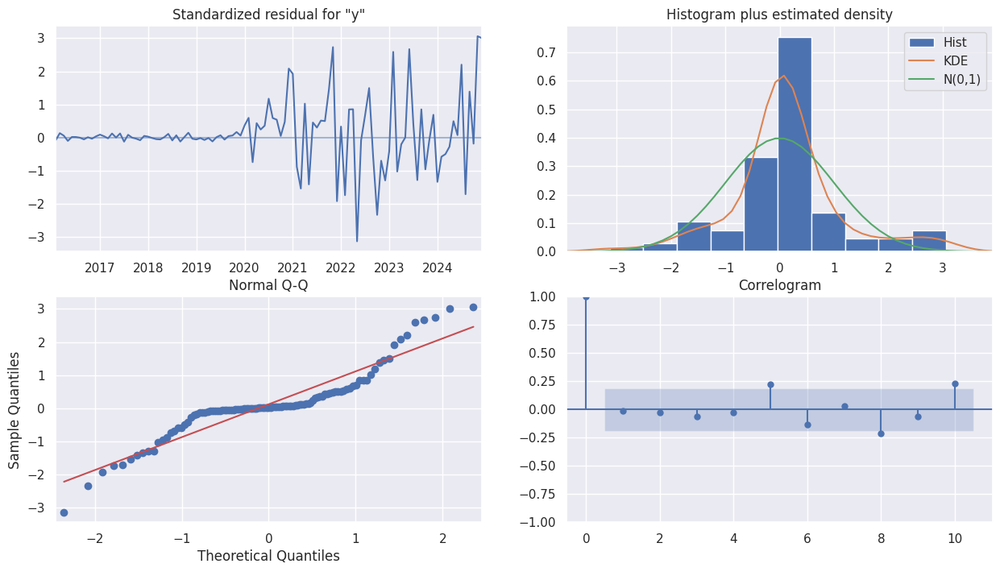

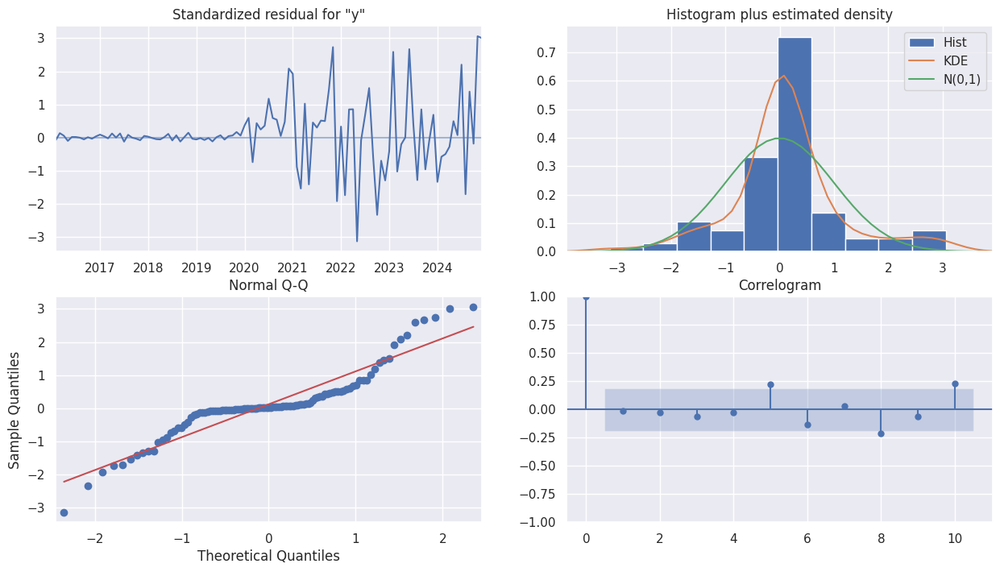

In [ ]:

results.plot_diagnostics(figsize = (15,8))



There is a possibility that the residuals are not white noise.

Firstly, many residuals are not clustered in the qqline.

Secondly, some residuals are outside the confidence interval in the Correlogram (ACF).

Lets continue using this SARIMA model anyways.


### Forecasting future values using SARIMA


In [ ]:
forecast = results.get_forecast(steps = 12) # the next 12 months

pred_mean = forecast.predicted_mean
pred_ci = forecast.conf_int()


#print(forecast) # just gives text

print(pred_mean)

print(pred_mean.index)




2025-01-31    434.231748
2025-02-28    434.231748
2025-03-31    434.231748
2025-04-30    434.231748
2025-05-31    434.231748
2025-06-30    434.231748
2025-07-31    434.231748
2025-08-31    434.231748
2025-09-30    434.231748
2025-10-31    434.231748
2025-11-30    434.231748
2025-12-31    434.231748
Freq: ME, Name: predicted_mean, dtype: float64
DatetimeIndex(['2025-01-31', '2025-02-28', '2025-03-31', '2025-04-30',
               '2025-05-31', '2025-06-30', '2025-07-31', '2025-08-31',
               '2025-09-30', '2025-10-31', '2025-11-30', '2025-12-31'],
              dtype='datetime64[ns]', freq='ME')


**ALERT:** The predicted mean values being the same number of 434.231748 may look like a mistake, but sometimes SARIMA thinks these are the best estimates.

Although the original time series data showed a trend, this trend was removed through differencing of $d=1$. As a result, the differenced series has a mean close to zero. This SARIMA model then forecasts zero expected change over time.


We will also see that the prediction intervals has different numbers, so it is okay if the predicted mean values are the same.





In [ ]:
print(pred_ci) # prediction interval


               lower y     upper y
2025-01-31  382.607171  485.856325
2025-02-28  352.362247  516.101250
2025-03-31  330.597132  537.866364
2025-04-30  312.668383  555.795114
2025-05-31  297.063348  571.400149
2025-06-30  283.060691  585.402805
2025-07-31  270.249412  598.214085
2025-08-31  258.368947  610.094550
2025-09-30  247.241793  621.221703
2025-10-31  236.740580  631.722916
2025-11-30  226.770234  641.693262
2025-12-31  217.257561  651.205936


### SARIMA Plot (Forecast year 2025)

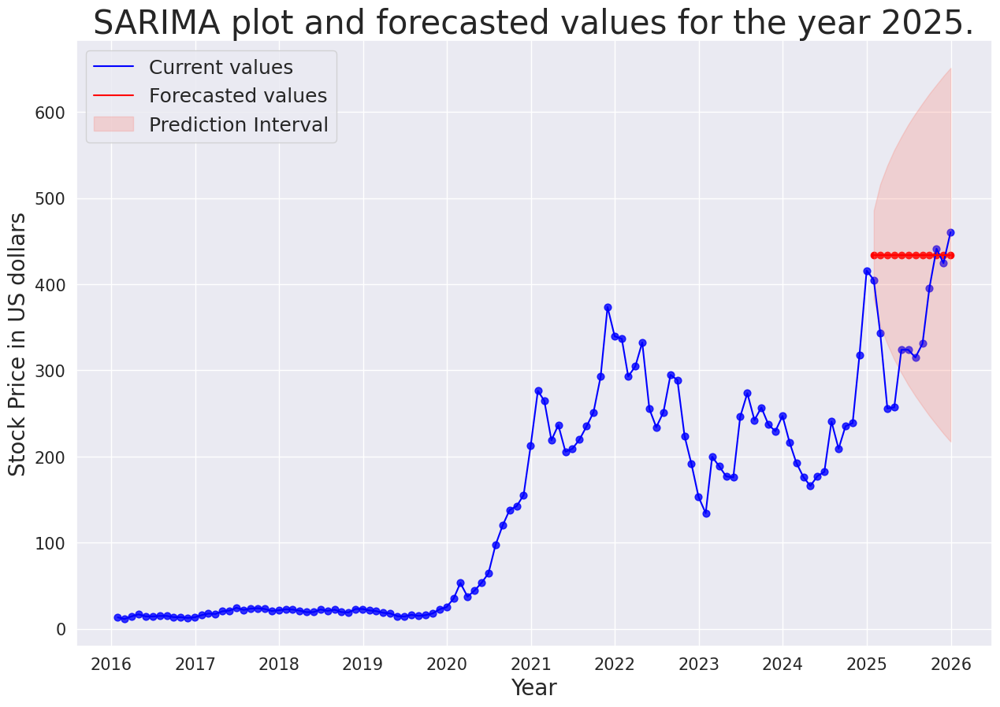

In [ ]:
fig = plt.figure(figsize = (15,10))

# current time values:
plt.scatter(monthly_df["date"], monthly_df["close"], alpha = 0.8,
            s = 40, color = "blue")

plt.plot(monthly_df["date"], monthly_df["close"], color = "blue",
         label = "Current values")


# forecasted values:

plt.scatter(pred_mean.index, pred_mean, color = "red")


plt.plot(pred_mean, color = "red",
         label = "Forecasted values")

plt.fill_between(pred_ci.index, pred_ci.iloc[:,0], pred_ci.iloc[:,1],
                 color = "salmon", alpha = 0.25,
                 label = "Prediction Interval")



plt.title("SARIMA plot and forecasted values for the year 2025.",
          fontsize = 30)

plt.ylabel("Stock Price in US dollars", fontsize = 20)

plt.xlabel("Year", fontsize = 20)


plt.legend()


# Make the ticks and legend have a bigger font:

plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

plt.legend(fontsize = 18);







**ALERT:** This plot may look like a incorrect, but this is the nature of the forecasted values if we only have a difference value of $d=1$.





Lets calculate the rMSE.

In [ ]:
from sklearn.metrics import root_mean_squared_error

rMSE_sarima = round(root_mean_squared_error(y_test, pred_mean),3)
rMSE_sarima

101.577

SARIMA's rMSE of 101.577 is defintely too high.

Now, rMSE does not tell the whole story since we have to consider the prediction interval. But even the prediction interval does not capture some of the time series points...

Since the prediction interval does not capture some of the time series points, this specific SARIMA model struggles to FULLY capture the variability in the this stock price data.





### ❗ PART 2: SARIMA evaluation (Train on 2016 - 2025, then forecast the next 3 years)

Lets see what the forecasts look like if we include the 2025 data!


In [ ]:

# Full dataset SARIMA:

parameters = pm.auto_arima(
    y,
    seasonal = True,
    m = 12, # seasonal period in months
    stepwise = True,
    trace = True

)


print(parameters.summary())


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1143.505, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1141.638, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1138.336, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1143.481, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1137.792, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1138.769, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1139.451, Time=0.43 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1135.131, Time=0.15 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1136.563, Time=0.64 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1136.237, Time=0.58 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1140.164, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1136.885, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[12] inte

It appears that the best SARIMA model is:
ARIMA(2,1,2)(2,0,0)[12]             

This model has the lowest AIC value of 1125.469.

Even though the AIC value of the full dataset is higher than the AIC value of the training set, that is fine since the full data set contains more information.

Furthermore, this model seems more trustworthy since it contains seasonal components. Lets use this full data set SARIMA model!

---

We use the statsmodels.api library to use SARIMA


In [ ]:



# Get the orders from auto_arima
the_order = parameters.order
the_seasonal_order = parameters.seasonal_order

print(the_order)
print(the_seasonal_order)




(2, 1, 2)
(2, 0, 0, 12)


In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX # Need this import!


sarima_model = SARIMAX(y, order = the_order,
                              seasonal_order = the_seasonal_order )

# sarima_model # -> displays some text

results = sarima_model.fit(disp = False)

# results # -> displays some text again for both False and True


### SARIMA diagnostic plot



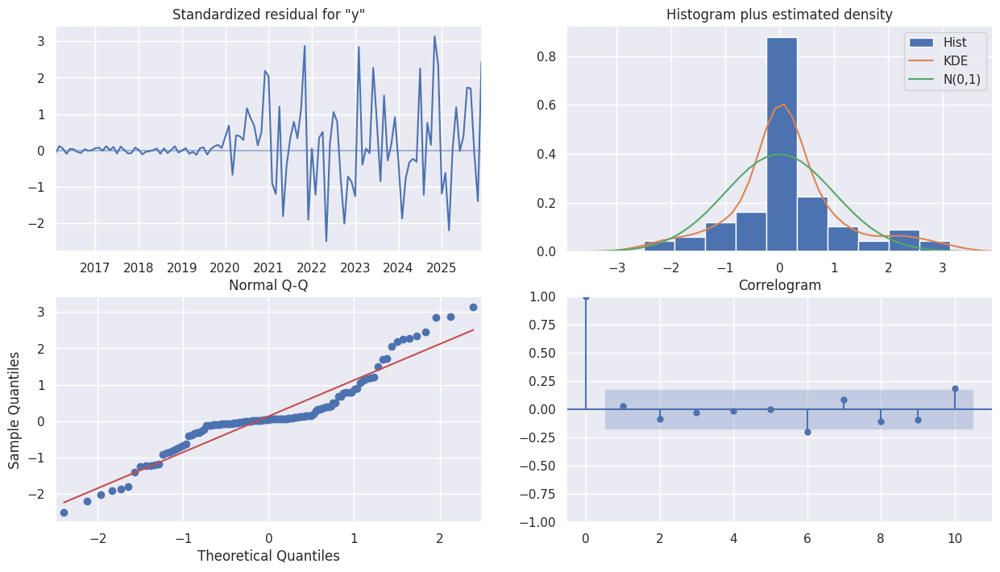

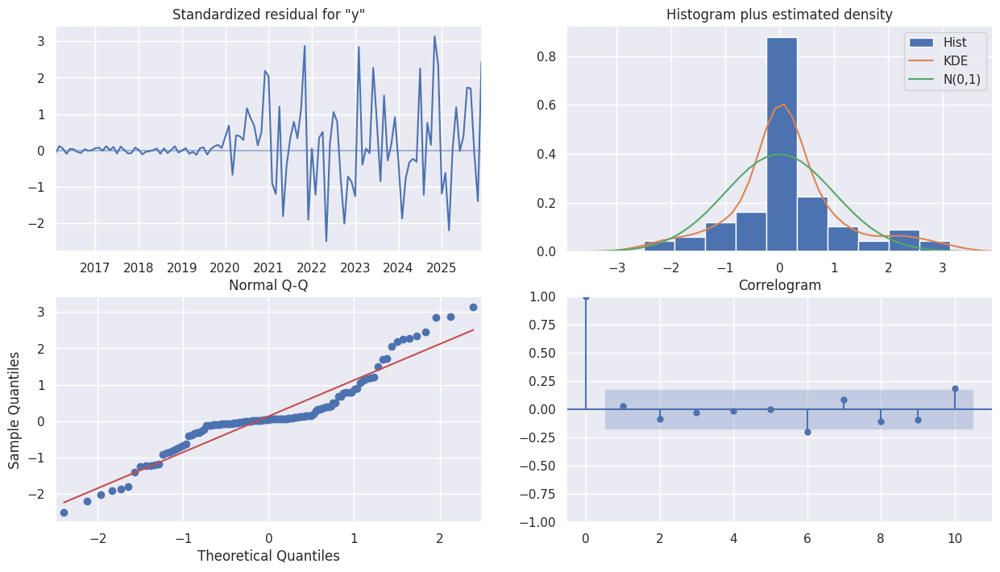

In [ ]:

results.plot_diagnostics(figsize = (15,8))



The residuals seem okay and appear to be white noise.

The correlograms show us the ACF plots for the residuals. They appear to be white noise since most lags are contained inside the shaded area (the confidence interval).

The normality assumption seems shaky since some residuals are not clustered in the QQ line in the QQ plots.

Lets continue to use the SARIMA model anyways.

---

### Forecasting future values using SARIMA




In [ ]:
forecast = results.get_forecast(steps = 36) # the next 36 months

pred_mean = forecast.predicted_mean
pred_ci = forecast.conf_int()


#print(forecast) # just gives text

print(pred_mean)

print(pred_mean.index)




2026-01-31    462.534827
2026-02-28    492.742689
2026-03-31    496.054064
2026-04-30    470.202287
2026-05-31    451.043428
2026-06-30    463.758034
2026-07-31    482.739795
2026-08-31    498.810654
2026-09-30    471.830709
2026-10-31    464.297035
2026-11-30    464.118405
2026-12-31    474.410101
2027-01-31    464.288468
2027-02-28    455.399413
2027-03-31    480.235378
2027-04-30    506.227440
2027-05-31    497.566077
2027-06-30    475.439284
2027-07-31    456.717246
2027-08-31    469.575485
2027-09-30    475.075213
2027-10-31    460.351364
2027-11-30    434.933991
2027-12-31    413.661042
2028-01-31    434.105512
2028-02-29    446.317213
2028-03-31    438.792835
2028-04-30    424.760748
2028-05-31    428.535061
2028-06-30    446.810119
2028-07-31    447.973575
2028-08-31    424.645360
2028-09-30    413.240777
2028-10-31    424.104710
2028-11-30    443.093172
2028-12-31    433.474920
Freq: ME, Name: predicted_mean, dtype: float64
DatetimeIndex(['2026-01-31', '2026-02-28', '2026-03-3

In [ ]:
print(pred_ci) # confidence interval


               lower y     upper y
2026-01-31  412.745750  512.323904
2026-02-28  416.668376  568.817002
2026-03-31  400.501927  591.606201
2026-04-30  362.160658  578.243916
2026-05-31  333.242360  568.844496
2026-06-30  334.730145  592.785922
2026-07-31  341.077756  624.401835
2026-08-31  346.680334  650.940974
2026-09-30  312.164831  631.496587
2026-10-31  297.455747  631.138322
2026-11-30  288.392185  639.844625
2026-12-31  289.311081  659.509120
2027-01-31  267.880489  660.696446
2027-02-28  249.290767  661.508059
2027-03-31  263.974338  696.496419
2027-04-30  278.954795  733.500086
2027-05-31  260.088264  735.043890
2027-06-30  229.450645  721.427922
2027-07-31  202.764444  710.670049
2027-08-31  206.870612  732.280357
2027-09-30  203.191607  746.958820
2027-10-31  180.280144  740.422583
2027-11-30  147.803218  722.064764
2027-12-31  119.413123  707.908961
2028-01-31  134.303008  733.908016
2028-02-29  141.229851  751.404575
2028-03-31  129.194897  748.390773
2028-04-30  110.8494

### SARIMA Plot (Forecast the next 3 years)

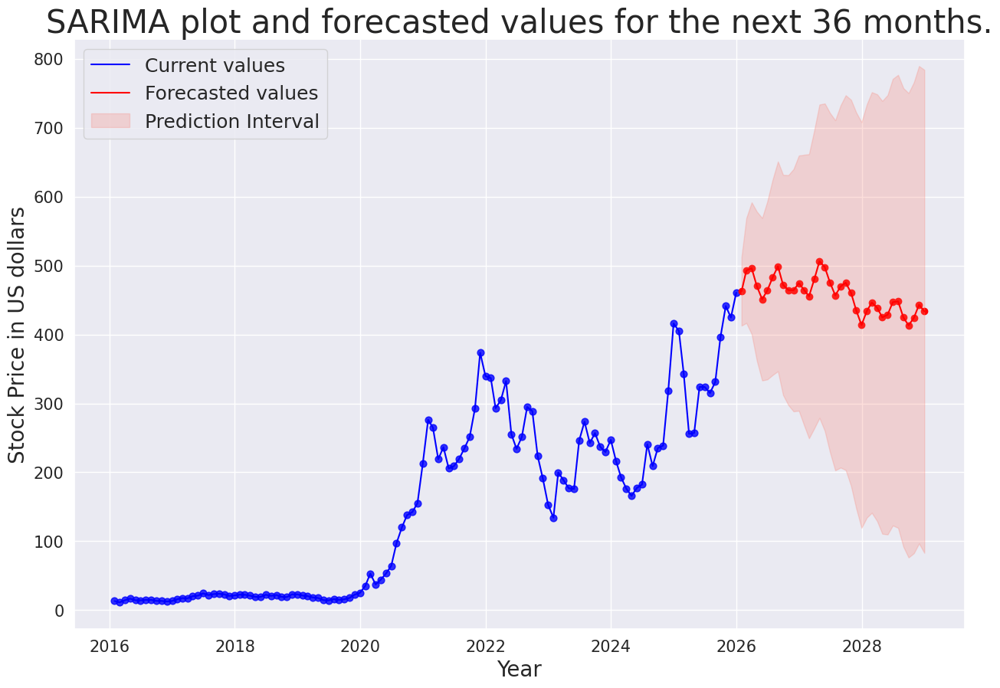

In [ ]:
fig = plt.figure(figsize = (15,10))

# current time values:
plt.scatter(monthly_df["date"], monthly_df["close"], alpha = 0.8,
            s = 40, color = "blue")

plt.plot(monthly_df["date"], monthly_df["close"], color = "blue",
         label = "Current values")


# forecasted values:

plt.scatter(pred_mean.index, pred_mean, color = "red")


plt.plot(pred_mean, color = "red",
         label = "Forecasted values")

plt.fill_between(pred_ci.index, pred_ci.iloc[:,0], pred_ci.iloc[:,1],
                 color = "salmon", alpha = 0.25,
                 label = "Prediction Interval")



plt.title("SARIMA plot and forecasted values for the next 36 months.",
          fontsize = 30)

plt.ylabel("Stock Price in US dollars", fontsize = 20)

plt.xlabel("Year", fontsize = 20)


plt.legend()


# Make the ticks and legend have a bigger font:

plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

plt.legend(fontsize = 18);







This is an interesting SARIMA plot.

SARIMA predicts that the mean future Tesla stock prices would increase somewhat for 2026, but then decrease in 2027 and 2028.

But this is not a guarantee, the prediction intervals shows the possible values for 2026 to 2028.

---


### Conclusion for SARIMA

This SARIMA forecast should be interpreted with caution.

We can NOT make any financial decisions using this SARIMA plot on its own!

But if we this plot along wide other information such as macro economic pattern, the trend of Elon Musk's tweets, stock market news, and more, we can get more wisdom on buying or selling Tesla stocks.


In a way, this SARIMA model serves as a supporting analytical tool rather than a decision-making system. It shows possible trends while acknowledging uncertainty in long-term stock price forecasting.

---

## Time Series Model 2: SARIMAX

SARIMAX is simply a extension of SARIMA.

"The Seasonal Autoregressive Integrated Moving Average with Exogenous Regressors (SARIMAX) model is a powerful time series forecasting technique that extends the traditional ARIMA model to account for seasonality and external factors" (GeeksforGeeks).

The "X" stands for eXogenous, AKA the predictor variables from the original data frame. For SARIMAX, we would want to use linear predictors.

Here is the SARIMAX formula:

$$y_t = SARIMA ~ terms + \beta_1 X_{1,t} + \beta_2 X_{2,t} + ... +  \epsilon_t$$

Where:

* $SARIMA ~ terms$: Are the seasonal effects from (**S**), past values from (**AR**), the differenced values from (**I**), and the past errors from (**MA**).

* $X_{1,t}, X_{2,t}$: The exogenous variables (the predictors) at time $t$.

* $\beta_1, \beta_2$: The beta coefficents that the model learns from the exogenous variables.

* $\epsilon_t$: The random error at time $t$.



Basically, SARIMAX uses the exogenous variables to have more information and forecast future values better.

---




### We will use training and testing sets for SARIMAX!

In terms of coding, SARIMAX is a strict time series model. It needs past X values and can only forecast future X values. We will make the training set represent the past, and make the testing set represent the future.

Even though we used all the data for SARIMA, we can not do this same approach for SARIMAX when evaluating forecasts.




In [ ]:

# Train dataset SARIMAX:

parameters = pm.auto_arima(
    y_train,
    exogenous = X_train, # need to include exogenous to use SARIMAX!
    seasonal = True,
    m = 12, # seasonal period in months
    stepwise = True,
    trace = True

)


print(parameters.summary())


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1010.675, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1010.578, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1010.003, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1010.777, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1008.124, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1010.052, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1010.753, Time=0.42 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1010.084, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1010.066, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1008.594, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1007.712, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=1009.548, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12]     

 The best training model based on AIC scores is: ARIMA(0,1,1)(0,0,0)[12]          


This is similar to our training set SARIMA parameters.


In [ ]:

# Get the orders from auto_arima
the_order = parameters.order
the_seasonal_order = parameters.seasonal_order

print(the_order)
print(the_seasonal_order)




(0, 1, 1)
(0, 0, 0, 12)


Recall our X Data Frame and our y Series are:

In [ ]:
y

,0
date,
2016-01-31,13.305479
2016-02-29,11.311315
2016-03-31,14.409818
2016-04-30,16.730605
2016-05-31,14.442257
...,...
2025-08-31,331.144762
2025-09-30,395.892381
2025-10-31,441.327826


In [ ]:
X

,previous_close,daily_range,SMA_10,EMA_10,previous_volume,rolling_std_10,rolling_max_10,rolling_min_10,momentum
0,13.399764,0.619143,13.916134,13.876031,6.282798e+07,0.506429,14.713721,13.177107,-1.416671
1,11.308885,0.770820,11.469760,11.575344,9.869837e+07,0.832624,12.667675,10.232560,-0.696645
2,14.295150,0.579050,13.779018,13.763789,6.761858e+07,0.573153,14.662059,12.923445,1.630950
3,16.695714,0.642181,16.450970,16.412028,9.845502e+07,0.463788,17.248271,15.808786,0.633971
4,14.497910,0.490990,14.840345,14.859979,7.542742e+07,0.589548,15.704000,14.010929,-1.023310
...,...,...,...,...,...,...,...,...,...
115,329.925714,11.506081,326.193381,326.698844,7.654708e+07,9.972900,339.922857,310.794762,7.520952
116,390.613810,14.490557,375.416667,376.750402,9.430427e+07,18.166897,400.941905,349.262857,45.101905
117,440.813043,18.923243,438.597826,437.431011,8.797031e+07,10.282942,456.178261,420.911739,6.934348
118,425.932632,19.526337,432.974000,431.680242,8.817460e+07,14.966179,456.377895,411.163684,-20.214737


SARIMAX needs the indices of X to be the dates of y!



In [ ]:
X.index = y.index

# Lets also make the train and test set have equal indexes
X_train.index = y_train.index
X_test.index = y_test.index


X

,previous_close,daily_range,SMA_10,EMA_10,previous_volume,rolling_std_10,rolling_max_10,rolling_min_10,momentum
date,,,,,,,,,
2016-01-31,13.399764,0.619143,13.916134,13.876031,6.282798e+07,0.506429,14.713721,13.177107,-1.416671
2016-02-29,11.308885,0.770820,11.469760,11.575344,9.869837e+07,0.832624,12.667675,10.232560,-0.696645
2016-03-31,14.295150,0.579050,13.779018,13.763789,6.761858e+07,0.573153,14.662059,12.923445,1.630950
2016-04-30,16.695714,0.642181,16.450970,16.412028,9.845502e+07,0.463788,17.248271,15.808786,0.633971
2016-05-31,14.497910,0.490990,14.840345,14.859979,7.542742e+07,0.589548,15.704000,14.010929,-1.023310
...,...,...,...,...,...,...,...,...,...
2025-08-31,329.925714,11.506081,326.193381,326.698844,7.654708e+07,9.972900,339.922857,310.794762,7.520952
2025-09-30,390.613810,14.490557,375.416667,376.750402,9.430427e+07,18.166897,400.941905,349.262857,45.101905
2025-10-31,440.813043,18.923243,438.597826,437.431011,8.797031e+07,10.282942,456.178261,420.911739,6.934348


In [ ]:

SARIMAX_model = SARIMAX(y_train,
                        exog = X_train, # the exogenous variables that SARIMAX needs
                        order = the_order,
                        seasonal_order = the_seasonal_order )

# sarima_model # -> displays some text

results = SARIMAX_model.fit(disp = False)

# results # -> displays some text again for both False and True


### SARIMAX diagnostic plot:

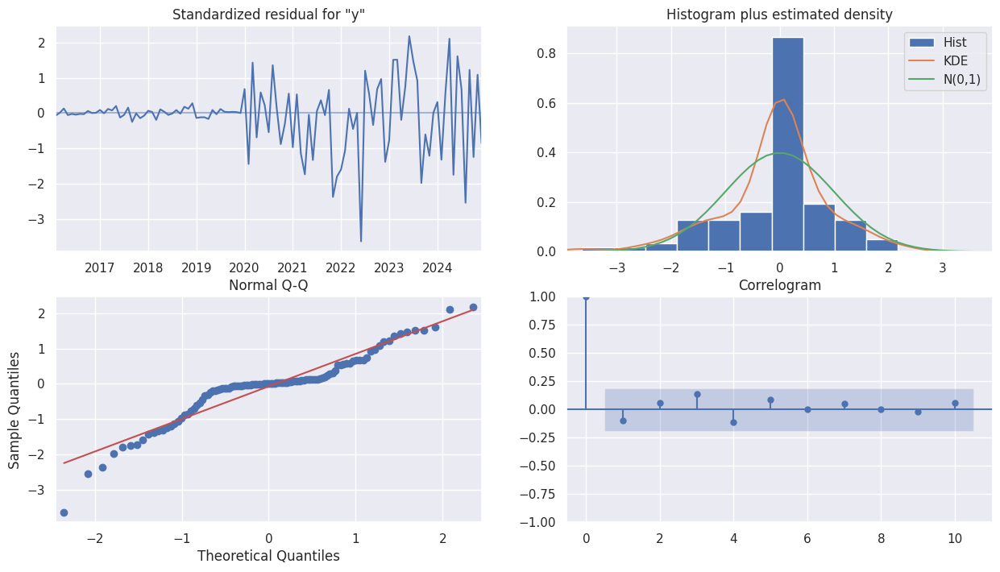

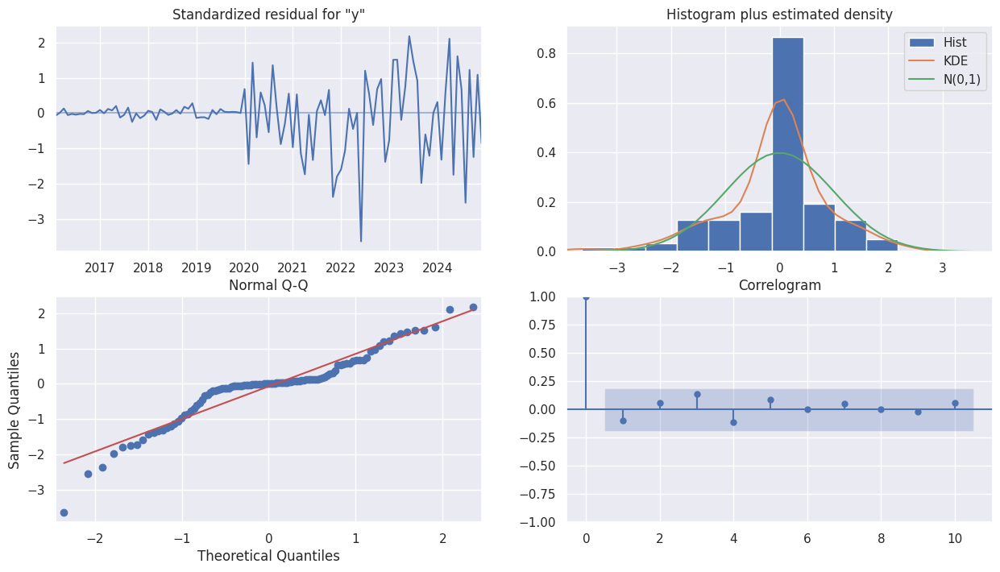

In [ ]:

results.plot_diagnostics(figsize = (15,8))



Just like SARIMA, the residuals seem okay and appear to be white noise.

The correlograms show us the ACF plots for the residuals. They appear to be white noise since most lags are contained inside the shaded area (the confidence interval).

The normality assumption seems shaky since some residuals are not clustered in the QQ line in the QQ plots.

Lets continue to use the SARIMA model anyways.

---

### Forecasting future values using SARIMAX


In [ ]:
forecast = results.get_forecast(steps = 12, exog = X_test) # the next 12 months

pred_mean = forecast.predicted_mean
pred_ci = forecast.conf_int()


#print(forecast) # just gives text

print(pred_mean)

print(pred_mean.index)




2025-01-31    403.923982
2025-02-28    344.890687
2025-03-31    256.594877
2025-04-30    255.752639
2025-05-31    324.688358
2025-06-30    323.100266
2025-07-31    315.074278
2025-08-31    330.318730
2025-09-30    396.168338
2025-10-31    439.807751
2025-11-30    423.889973
2025-12-31    462.521312
Freq: ME, Name: predicted_mean, dtype: float64
DatetimeIndex(['2025-01-31', '2025-02-28', '2025-03-31', '2025-04-30',
               '2025-05-31', '2025-06-30', '2025-07-31', '2025-08-31',
               '2025-09-30', '2025-10-31', '2025-11-30', '2025-12-31'],
              dtype='datetime64[ns]', freq='ME')


In [ ]:
print(pred_ci) # confidence interval


               lower y     upper y
2025-01-31  402.965007  404.882956
2025-02-28  343.919882  345.861492
2025-03-31  255.612384  257.577370
2025-04-30  254.758595  256.746683
2025-05-31  323.682897  325.693820
2025-06-30  322.083514  324.117017
2025-07-31  314.046361  316.102195
2025-08-31  329.279767  331.357693
2025-09-30  395.118445  397.218230
2025-10-31  438.747041  440.868460
2025-11-30  422.818556  424.961390
2025-12-31  461.439293  463.603331


Interesting, the SARIMAX prediction intervals are extremely small!

### SARIMAX Plot:



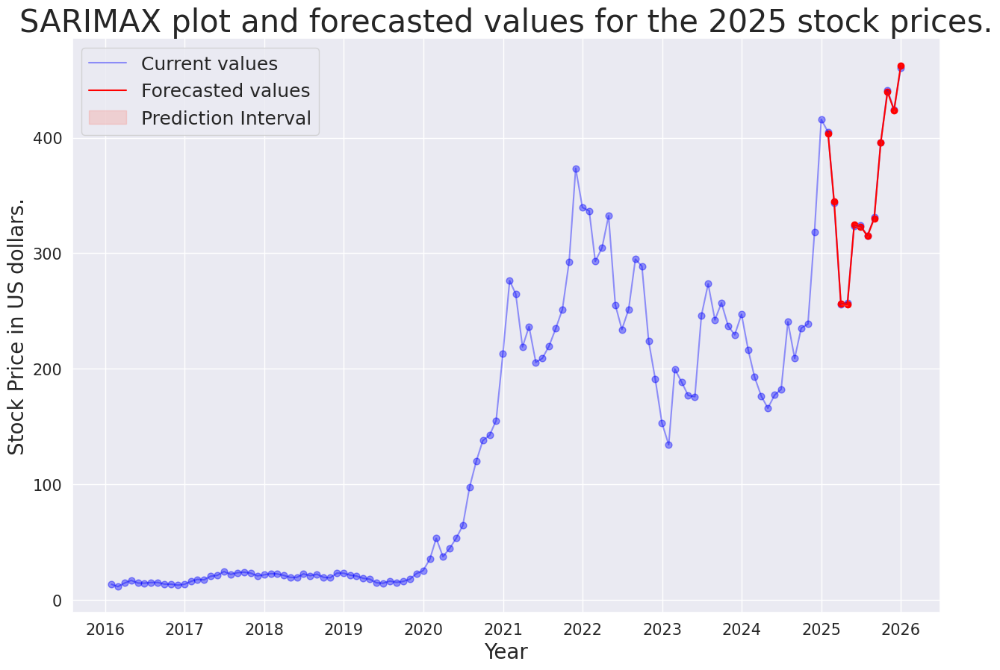

In [ ]:
fig = plt.figure(figsize = (15,10))

# current time values:
plt.scatter(monthly_df["date"], monthly_df["close"], alpha = 0.4,
            s = 40, color = "blue")

plt.plot(monthly_df["date"], monthly_df["close"], color = "blue", alpha = 0.4,
         label = "Current values")


# forecasted values:

plt.scatter(pred_mean.index, pred_mean, color = "red")


plt.plot(pred_mean, color = "red",
         label = "Forecasted values")

plt.fill_between(pred_ci.index, pred_ci.iloc[:,0], pred_ci.iloc[:,1],
                 color = "salmon", alpha = 0.25,
                 label = "Prediction Interval")



plt.title("SARIMAX plot and forecasted values for the 2025 stock prices.",
          fontsize = 30)

plt.ylabel("Stock Price in US dollars.", fontsize = 20)

plt.xlabel("Year", fontsize = 20)


plt.legend()


# Make the ticks and legend have a bigger font:

plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

plt.legend(fontsize = 18);







SARIMAX did a amazing job predicting the stock prices of the year 2025!!!

Lets calculate the rMSE of the actual stock prices, and the predicted SARIMAX values!

In [ ]:
from sklearn.metrics import root_mean_squared_error


rMSE_SARIMAX = round(root_mean_squared_error(y_test, pred_mean),3)
rMSE_SARIMAX




1.116

### Whoa, isnt a rMSE of 1.116 suspicious?

In Machine Learning and Time Series, if we have a extremely low rMSE, we should not be happy. We have to consider the reasons why a model gave a low rMSE.

In our case, it appears that the exogenous variables were extremely strong predictor variables. That explains why SARIMAX had a low rMSE!

Recall that SARIMAX does well if the predictor variables are linear, and I picked any predictors that had a weak to strong linear correlation.

Also recall that Linear Regression was the best ML model due to the fact that some predictors had strong linear correlations.


Even though SARIMAX had a low rMSE, we should not use it for predicting stock prices. I will explain more in the conclusion for SARIMAX.

---

### Conclusion for SARIMAX

Even though SARIMAX did a amazing job predicting the 2025 stock prices, SARIMA is a more realistic model to use.

**Why?**

Firstly, we will not always have the future values of exogenous variables. This project only considers stock prices from 2016 to 2025, so the only exogenous values we have is from 2016 to 2025. Where would we find the exogenous values of year 2026 and onwards? Finding future exogenous values is a big challenge for SARIMAX!

Secondly, SARIMA can automatically forecast future values using the stock prices. It does not require exogenous variables to do this!

Overall, for this project, it is recommended to use SARIMA instead of SARIMAX.

Enough of the SARIMA family, lets jump into a fun model called Prophet!


---

## Time Series Model 3: Prophet


"Prophet is an open-source tool released by Facebook's Data Science team that produces time series forecasting data based on an additive model where a non-linear trend fits with seasonality and holiday effects"(Dieckmann).

Prophet is a modern time series models that many companies use. And there are many good reasons why:

* Prophet is relatively easy to use.

* Prophet can handle missing data.

* Prophet handles trends and seasonality AUTOMATICALLY!

* Interpretting a Prophet is straight forward.






Here is the Prophet time series model formula:

$$\hat y_t = \hat m_t + \hat s_t + \hat h_t$$


Where:

* $\hat y_t$: The predicted/forecasted value at time $t$.

* $\hat m_t$: The predicted trend.

* $\hat s_t$: The predicted seasonal component.

* $\hat h_t$: The predicted holiday effect. (This is optional.)




---

**Coding ALERT:** Prophet can use just $y$, or $y$ and $X$! CAREFUL, Prophet needs a df of closing price and date for $y$!

For this project, we will just use the response vector of $y$, the stock prices. This is because we will not always have future values of $X$ the exogenous variables!



Lets start setting up out dataframe of closing price and date for $y$! Then lets fit a Prophet model!


**NOTE:** Prophet is not designed to accurately predict future values! It is designed to give general trends, seasonality, and possible holiday spikes! So using a train and test set is not ideal.

In [ ]:
y # our original y Series that contains just the stocke prices



,0
date,
2016-01-31,13.305479
2016-02-29,11.311315
2016-03-31,14.409818
2016-04-30,16.730605
2016-05-31,14.442257
...,...
2025-08-31,331.144762
2025-09-30,395.892381
2025-10-31,441.327826


In [ ]:
y_p = y.reset_index() # this is how we how we make the the date variable

y_p.columns = ["ds", "y"]

# ALERT: prophet needs column names of "ds" and "y" or else it will NOT WORK!

y_p


,ds,y
0,2016-01-31,13.305479
1,2016-02-29,11.311315
2,2016-03-31,14.409818
3,2016-04-30,16.730605
4,2016-05-31,14.442257
...,...,...
115,2025-08-31,331.144762
116,2025-09-30,395.892381
117,2025-10-31,441.327826
118,2025-11-30,424.543684


Lets do the same coding edits for the training and testing sets! (For demonstration purposes.)

In [ ]:
# Training set:
y_train_p = y_train.reset_index() # this is how we how we make the the date variable

y_train_p.columns = ["ds", "y"]

# ALERT: prophet needs column names of "ds" and "y" or else it will NOT WORK!

y_train_p



# Testing set:

y_test_p = y_test.reset_index() # this is how we how we make the the date variable

y_test_p.columns = ["ds", "y"]

# ALERT: prophet needs column names of "ds" and "y" or else it will NOT WORK!

y_test_p







,ds,y
0,2025-01-31,405.019000
1,2025-02-28,343.339474
2,2025-03-31,255.808095
3,2025-04-30,257.148095
4,2025-05-31,323.864762
5,2025-06-30,323.891500
6,2025-07-31,314.988636
7,2025-08-31,331.144762
8,2025-09-30,395.892381
9,2025-10-31,441.327826


### Prophet evaluation (Train on 2016 - 2025, then forecast the next 3 years)


In [ ]:
from prophet import Prophet

# 1. intiate model:
prophet_model = Prophet(interval_width = 0.95) # Create a 95% prediction interval

# 2. fit model:
prophet_model.fit(y_p) # y_p is a data frame



INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
# 3. make future values:

future_values = prophet_model.make_future_dataframe(periods = 36, freq = "M")
print(future_values)

# 4. forecast the future values

forecast_values = prophet_model.predict(future_values)
print(forecast_values)



            ds
0   2016-01-31
1   2016-02-29
2   2016-03-31
3   2016-04-30
4   2016-05-31
..         ...
151 2028-08-31
152 2028-09-30
153 2028-10-31
154 2028-11-30
155 2028-12-31

[156 rows x 1 columns]
            ds       trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
0   2016-01-31  -50.922575 -154.341224   78.897021   -50.922575   -50.922575   
1   2016-02-29  -47.722101 -167.961972   95.060909   -47.722101   -47.722101   
2   2016-03-31  -44.300904 -180.805144   69.534769   -44.300904   -44.300904   
3   2016-04-30  -40.990069 -180.890910   73.608487   -40.990069   -40.990069   
4   2016-05-31  -37.568872 -188.458430   69.835112   -37.568872   -37.568872   
..         ...         ...         ...         ...          ...          ...   
151 2028-08-31  456.274061  331.433190  577.304812   456.272474   456.275721   
152 2028-09-30  459.584619  344.768397  593.756718   459.582976   459.586366   
153 2028-10-31  463.005530  340.093174  586.569408   463.003813   463.007367

<Figure size 2000x1000 with 0 Axes>

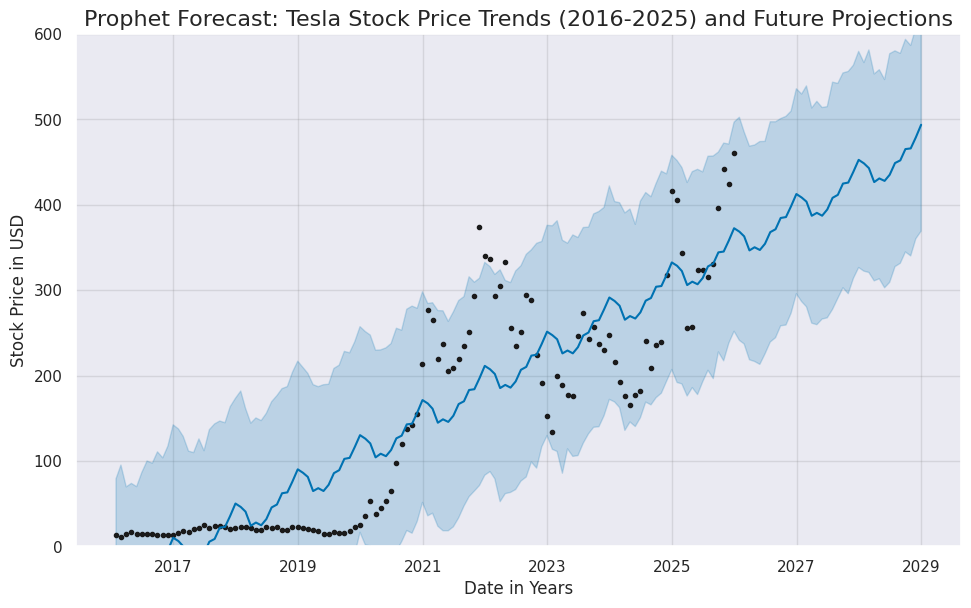

In [ ]:
# 5. plot the forecast:

plt.figure(figsize = (20,10))


# ALERT: assign a variable name so that the prophet_model will not give duplicate plots!
fig_1 = prophet_model.plot(forecast_values)

plt.title("Prophet Forecast: Tesla Stock Price Trends (2016-2025) and Future Projections",
          fontsize = 16)

plt.xlabel("Date in Years")
plt.ylabel("Stock Price in USD")

# Not possible to get a negative stock price, so set the y-limit:
plt.ylim(0,600);


### How to read a Prophet plot

* The black dots are the historical time series data points. These are our stock prices ($y$).

* The dark blue line represents the shaded trend line ($\hat y$). This is created by the trend ($\hat m_t$) and seasonality components ($\hat s_t$).

* The light blue shade represents the prediction intervals. The values come from $\hat y_{lower}$ and $\hat y_{upper}$.

---

We can see that Prophet did not capture all historical points inside the confidence interval. But that is okay!

The main point of Prophet is to visualize the trend and seasonality of the current and future time series!



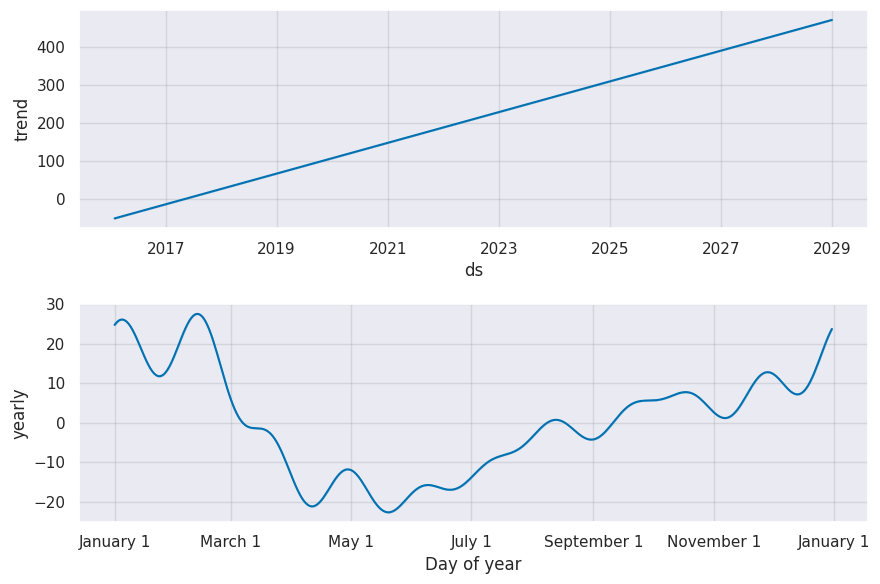

In [ ]:
# 6. Seasonal and Trends components plot:

fig_2 = prophet_model.plot_components(forecast_values)




**Trend:**

* There seems to just be a simple linear trend for the Tesla Stock prices. The overall trend is increasing prices.

* While it is true that the stock prices have a cyclical pattern, they keep increasing over the years.



**Seasonality:**

Recall from the "Plot of the Monthly Tesla Stock Prices from 2016 to 2025" part in Section G, there were monthly patterns in the stock prices:

* January appears to have the largest spikes in stock prices.

* Spring months tend to decrease in stock prices.

* Summer to late winter months tend to increase in stock prices.

The seasonality plot seems to align with these monthly patterns.


**Holidays?:**

* There is not enough significant evidence that Tesla has holiday or company days where the Tesla stock prices suddenly increases or decreases.

* While it is true that Elon Musk's tweets can cause stock prices to increase or decrease, these tweets can happen any time. So the holiday component is not practical.

* Therefore, it is best to not model the holidays component!


### Conclusion for Prophet

Prophet can give us simple but great information. It confirms that the Tesla stock prices are increasing and have a seasonal pattern.

Finding future stock prices in the future accurately is a challenge. So Prophet focuses in general forecasts instead.

Sometimes, general forecasts and trends are all a company needs to make informed decisions.


---

## Time Series Model 4: State-Space Model

Fun fact 1, we have already created State-Space models! SARIMA, SARIMAX, and Prophet are State-Space models in disguise!

Fun fact 2, this model has been originally used for aerospace research, but then was applied to economics, medicine, and soil science (Shumway and Stoffer 319).


**State-Space Model Intuition:**

Imagine you have a pet hamster moving in a cage and the room is dark:

* You can not see the hamster (Hidden State).

* You can hear sounds of the hamster moving around (Observation State).

* You create a time series model to estimate where the hamster is and what areas the hamster travels to (State-Space Model).


---
**State-Space Model in Time Series:**

* Hidden State: The true trend and patterns of the time series.

* Observation State: The actual observations we want to measure. In this case, we want to measure Tesla stock prices over time.

* Goal: We want to estimate the Hidden State and and forecast future Observations.



---
**Actual State-Space Model Formulas:**

State-Space Models have two formulas.

Formula 1: Hidden State Equation

$$\vec x_t = F \vec x_{t-1} + \vec w_t$$

Where:

* $\vec x_t$ is the vector that contains the hidden states at time $t$. Here is one example:

$\vec x_t =
\begin{bmatrix}
 level_t \\
trend_t \\
seasonality_t
\end{bmatrix}$  

Where $level_t$, $trend_t$, and $seasonality_t$ are the baseline value, the trend value, and seasonality value for $\vec x_t$, respectively.

* $\vec x_{t-1}$ is the vector of the previous hidden states.


* $F$ is the State transition Matrix. It measures how the State gets updated over time.

* $\vec w_t$ is the vector of process noise.  



Formula 2: Observation Equation

$$\vec y_t = H \vec x_t + \vec v_t$$


Where:

* $\vec y_t$ is the vector of observed values. In this case, these are the actual observations. (These are NOT the estimated observations! A Kalman filter will help us find estimated observations of the $\vec{\hat{y}}_t
$.)

* $H$ is the observation matrix.

* $\vec x_t$ is the same vector from Formula 1.

* $\vec v_t$ is the measurement noise.


For this project, we only have one set of stock prices, $y_t$, so we do NOT do: $\vec y_t$. If we have two or more sets of stock prices, we do $\vec y_t$!

---
**Estimated State-Space Model Formulas:**


Formula 1: Hidden State Equation

$$\vec{\hat x}_t = F \vec{\hat x}_{t-1} + \vec{\hat w}_t$$

Where:

* $\vec{\hat x}_t$ is the estimated state from a algorithm such as a Kalman filter.


Formula 2: Observation Equation

$$\vec{\hat y}_t = H \vec{\hat x}_t$$

Where:

* $\vec{\hat y}_t$ is the predicted observation value / the forecasted value.

The end result of State-Space is to get $\vec{\hat{y}}_t$.




---
Lets make a custom State-Space model!



In [ ]:
import statsmodels.api as sm


space_state_model = sm.tsa.UnobservedComponents(y, level = "local linear trend", seasonal = 12)

resulting_values = space_state_model.fit(disp = False)
resulting_values




In [ ]:
# Forecast 36 steps ahead, AKA 3 years.

forecast_values = resulting_values.get_forecast(steps = 36)
print(forecast_values)

print()

# y_pred, the mean values
pred_mean = forecast_values.predicted_mean
print(pred_mean)

print()

pred_ci = forecast_values.conf_int()
print(pred_ci)



2026-01-31    461.828724
2026-02-28    456.026234
2026-03-31    439.440899
2026-04-30    442.909307
2026-05-31    440.225740
2026-06-30    447.650790
2026-07-31    461.305810
2026-08-31    464.955928
2026-09-30    478.008724
2026-10-31    479.085577
2026-11-30    491.263501
2026-12-31    505.382007
2027-01-31    506.680731
2027-02-28    500.878241
2027-03-31    484.292906
2027-04-30    487.761314
2027-05-31    485.077747
2027-06-30    492.502797
2027-07-31    506.157817
2027-08-31    509.807935
2027-09-30    522.860731
2027-10-31    523.937584
2027-11-30    536.115508
2027-12-31    550.234014
2028-01-31    551.532739
2028-02-29    545.730248
2028-03-31    529.144913
2028-04-30    532.613321
2028-05-31    529.929754
2028-06-30    537.354804
2028-07-31    551.009824
2028-08-31    554.659942
2028-09-30    567.712738
2028-10-31    568.789591
2028-11-30    580.967515
2028-12-31    595.086021
Freq: ME, Name: predicted_mean, dtype: float64

               lower y     upper y
2026-01-31  401.

### Space State Model plot

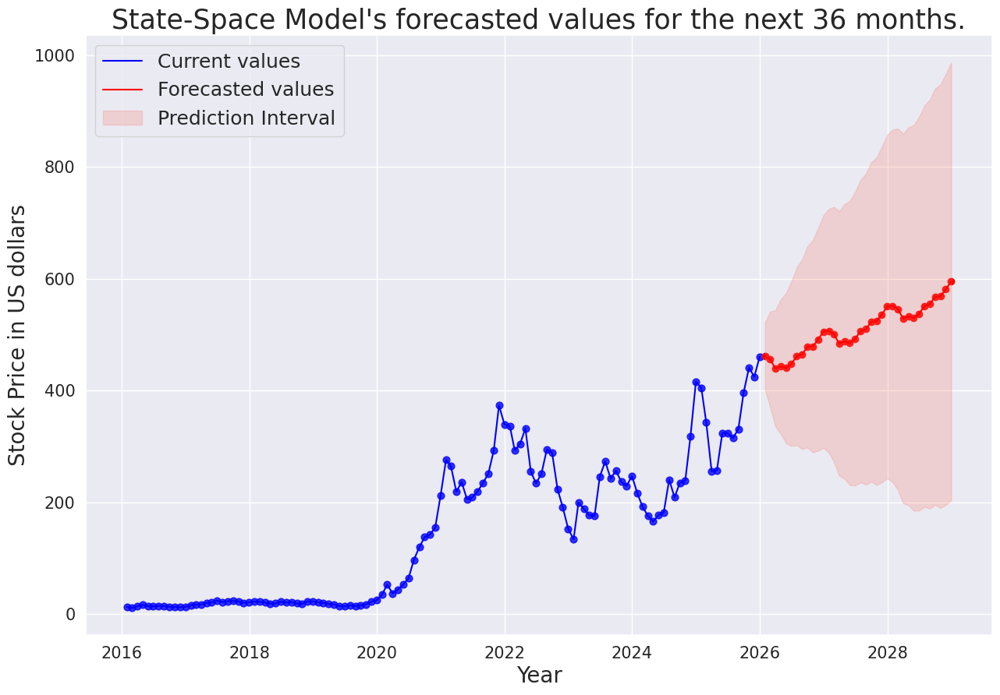

In [ ]:
fig = plt.figure(figsize = (15,10))

# current time values:
plt.scatter(monthly_df["date"], monthly_df["close"], alpha = 0.8,
            s = 40, color = "blue")

plt.plot(monthly_df["date"], monthly_df["close"], color = "blue",
         label = "Current values")


# forecasted values:

plt.scatter(pred_mean.index, pred_mean, color = "red")


plt.plot(pred_mean, color = "red",
         label = "Forecasted values")

plt.fill_between(pred_ci.index, pred_ci.iloc[:,0], pred_ci.iloc[:,1],
                 color = "salmon", alpha = 0.25,
                 label = "Prediction Interval")



plt.title("State-Space Model's forecasted values for the next 36 months.",
          fontsize = 25)

plt.ylabel("Stock Price in US dollars", fontsize = 20)

plt.xlabel("Year", fontsize = 20)


plt.legend()


# Make the ticks and legend have a bigger font:

plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

plt.legend(fontsize = 18);







* It appears the State-Space Model suggests a upward and cylical trend for the future values.

* The prediction intervals also show the possible values of the stock prices.


* Recall that SARIMA indicates that the stock prices could actually decrease.  It is interesting that a custom state-space model says otherwise.





### Conclusion for State-Space Model

---

* Just like Prophet, the custom State-Space Model forecasts a upward trend in Tesla stock prices. But unlike Prophet, State-Space's prediction intervals widens as time increases.


* The Space-State model appears to give constant upward trends and constant cyclical patterns for the next 3 years.


* Since SARIMA, SARIMAX, and Prophet are special types of Space-State models, I am not sure if we learned anything radical. But Space-State does confirm general patterns of the other time series models we made!




---

## 🏆 Time Series Table


---

In [ ]:
# Make df display all content in columns:
pd.set_option("display.max_colwidth", None)


ts_table = pd.DataFrame({"Time Series Models":["SARIMA",
                                               "SARIMAX",
                                               "Prophet",
                                               "State-Space Model"],
                         "Characteristics":["Suggests that the future stock prices could decrease over time. Prediction intervals widened over time.",
                                            "Forecasted the 2025 stock prices well, but not ideal for future forecasts since it requires future exogenous data.",
                                            "Showed that in general future stock prices will keep increasing with seasonality. Prediction intervals did NOT widen over time.",
                                            "Suggests that the future stock prices could increase over time. Prediction intervals widened over time."]})

ts_table


,Time Series Models,Characteristics
0,SARIMA,Suggests that the future stock prices could decrease over time. Prediction intervals widened over time.
1,SARIMAX,"Forecasted the 2025 stock prices well, but not ideal for future forecasts since it requires future exogenous data."
2,Prophet,Showed that in general future stock prices will keep increasing with seasonality. Prediction intervals did NOT widen over time.
3,State-Space Model,Suggests that the future stock prices could increase over time. Prediction intervals widened over time.


In [ ]:
# reset the column settings:
pd.reset_option("display.max_colwidth")

# 💡 SECTION H: Conclusion


To conclude, let us summarize all our objectives from Section A.


---
### Objective 1: ML models on daily stock price data

* ML models are mainly effective for predicting short-term stock prices.

* Predicting stock prices for the next few years or even months will be challenging due to the fact we do not have future daily data. (This project's ML models did well since we had lagged 2025 days in our 2025 data. In real life, we will not have this! But we can certainly predict the next day!)  

* Linear Regression was the best ML model for Tesla Stock Prices since it had the lowest rMSE value of 7.358. A possible reason that linear regression did well was because some predictors had strong linear correlations.


---
### Objective 2: Time Series models on monthly stock price data

* Time series are mainly used to view general trends and seasonalities. Just visualizing the time series data and model is extremely helpful for stakeholders.

* Time series may not accurately predict future stock prices. But most time series have prediction intervals to account for the range of possible future stock prices.

* Prophet had constant prediction intervals and appeared to give a confident direction of where the stock prices would head.


---
### Objective 3: Insights and Results

**Trend:**

* After the year 2020, there seems to be a upward trend.


**Monthly Patterns (Seasonality):**

* During the time period of years 2020 to 2025 there also seems to be seasonality due to cylical pattern of dips and rises.


* January appears to have the largest spikes in stock prices.

* Spring months tend to decrease in stock prices.

* Summer to late winter months tend to increase in stock prices.


**Business Insights:**

* Based on these trends, an investor might consider buying during early spring months when prices are lower and selling during summer or late winter months when prices tend to peak.

* WARNING: Tesla stock prices are highly volatile. These patterns are not guaranteed and should not be relied on as a definitive trading strategy.  

---

Here is the original time series data on the 2016 to 2025 Tesla Stock Prices displayed here for your convenience:

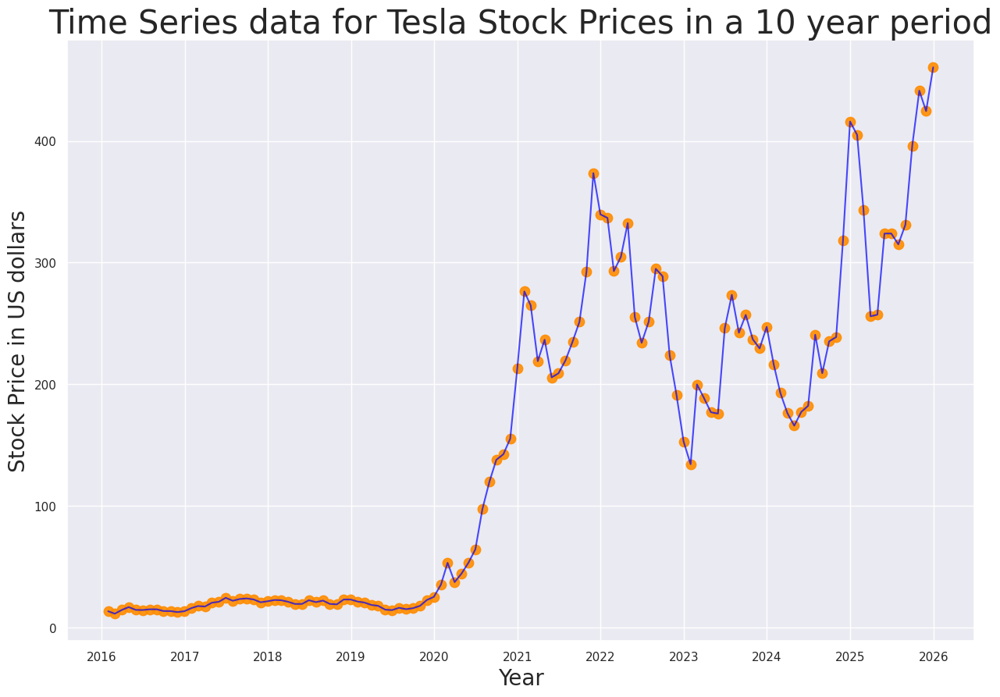

In [ ]:
fig = plt.figure(figsize = (15,10))

# scatter plot:
plt.scatter(monthly_df["date"], monthly_df["close"], alpha = 0.9,
            s = 80, color = "darkorange")

# line plot:
plt.plot(monthly_df["date"], monthly_df["close"], color = "blue", alpha = 0.7)


plt.title("Time Series data for Tesla Stock Prices in a 10 year period",
          fontsize = 30)

plt.ylabel("Stock Price in US dollars", fontsize = 20)

plt.xlabel("Year", fontsize = 20);




This concludes the Tesla Stock Price Prediction Project.


I want to give you one question. How would you use time series data to generate insights?

Maybe you are thinking of the stock prices of Elon's other company, SpaceX.

Perhaps it is the number of turtle eggs in the beaches of Florida over a few years.

**Or do you have another time series data in mind?**

# Bibliography

“NASDAQ Tesla Stock Prices.” Nasdaq, www.nasdaq.com/market-activity/stocks/tsla/historical?page=1&rows_per_page=10&timeline=y10. Accessed 24 Dec. 2025.

“Elon Musk | Tesla”, www.tesla.com/elon-musk. Accessed 24 Dec. 2025.

Hong, Zhong. “Predicting Stock Returns .” Medium, 27 Dec. 2024, medium.com/@zhonghong9998/predicting-stock-returns-a-guide-to-feature-engineering-for-financial-data-bbf6700b11d7. Accessed 24 Dec. 2025


“How to Use OHLCV Data.” Finage, 30 May 2025, finage.co.uk/blog/how-to-use-ohlcv-data-to-improve-technical-analysis-in-trading--684007623458598454e3dd10.

Schwab Brokerage. Understanding Stocks Public, www.schwab.com/stocks/understand-stocks. Accessed 12 Jan. 2026.

Moskowitz, Dan. “The 10 Richest People in the World.” Investopedia, Investopedia, www.investopedia.com/articles/investing/012715/5-richest-people-world.asp. Accessed 12 Jan. 2026.

GeeksforGeeks. “Complete Guide to SARIMAX in Python.” GeeksforGeeks, 23 July 2025, www.geeksforgeeks.org/python/complete-guide-to-sarimax-in-python/. Accessed 16 Jan. 2026  

Dieckmann, Jonas. “Getting Started Predicting Time Series Data with Facebook Prophet.” Medium, 30 Jan. 2024, medium.com/data-science/getting-started-predicting-time-series-data-with-facebook-prophet-c74ad3040525. Accessed 16 Jan. 2026  

Shumway, Robert, and David Stoffer. Time Series Analysis and Its Applications with R Examples. Springer New York, 2011. Accessed 19 Jan. 2026  

###